# TIME SERIES MODEL FOR PREDICTING BUDGET BEHAVIOR

# PROPHET MODEL

In [1]:
# Apply the imports first
# Linear algebra
import numpy as np 

# Pandas profiling for Exploratory Data Analysis (EDA)
import pandas_profiling as pp 

# Data processing, CSV file I/O (e.g., pd.read_csv)
import pandas as pd 

# Data visualization
import matplotlib.pyplot as plt # Data visualization
import seaborn as sns # Data visualization
import plotly.express as px # Data visualization
import plotly.graph_objects as go
from scipy.stats import chi2_contingency, norm # Chi-square calculation

# Stocks-related missing information
import yfinance as yf

# Ignoring the warnings
import warnings
warnings.filterwarnings("ignore", category=FutureWarning)

%matplotlib inline

# Ranking the stocks
import matplotlib.pyplot as plt
import matplotlib.dates as dates
import optuna
from wordcloud import WordCloud, STOPWORDS # For word cloud generation

# Evaluate if they should be removed
import statsmodels.api as sm

# Time series
import datetime

# Uncomment to install Prophet if not already installed
#!pip install fbprophet --quiet
import plotly.offline as py
py.init_notebook_mode()

# Save model
import pickle

# Apply the "from" statements after the imports

# Evaluate if they should be removed
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn import linear_model
from matplotlib.pyplot import figure
from lazypredict.Supervised import LazyClassifier, LazyRegressor
# Ranking the stocks
from plotly.subplots import make_subplots

# Prophet Model Stuff
# Uncomment to install Prophet if not already installed
#!pip install fbprophet --quiet

from prophet import Prophet
from prophet.plot import plot_plotly
from prophet.plot import plot_yearly
from prophet.plot import add_changepoints_to_plot


# Get names of indexes for which column Stock has value No
from pickle import FALSE


# connect with my sql %pip install mysql-connector-python pandas
import mysql.connector


It is important to know how the behavior of the system is in terms of payment and its acquisitions, where the amount is registered with the original modena, the acquisition is defined in pesos, the payment would be in pesos, but if the acquisition is in dollars, then that Payment amount represents dollars.





In [902]:
# Load the CSV file into a DataFrame
df_pagos = pd.read_csv("pagos_moneda_filtro_campos2024.csv", engine="python", sep=',', quotechar='"', error_bad_lines=False)

# Filter out rows where pagos_pk is null
df_pagos = df_pagos[df_pagos['pag_pk'].notna()]


In [903]:
df_pagos.sample(5)

,pag_pk,pag_fecha_planificada,pag_importe_planificado,pag_fecha_real,pag_importe_real,pag_confirmar,mon_pk,mon_nombre
13314,33017.0,5/30/2022 0:00,1086716.0,6/3/2022 0:00,1483365.0,1.0,1,Pesos
9397,23128.0,8/14/2020 0:00,436700.0,8/14/2020 0:00,216184.0,1.0,1,Pesos
28333,41477.0,5/30/2023 0:00,0.0,12/15/2023 0:00,25200.0,1.0,2,Dlares
17489,45079.0,11/30/2024 0:00,29790.0,11/30/2025 0:00,29790.0,0.0,1,Pesos
12596,31656.0,7/30/2022 0:00,27459.0,7/30/2022 0:00,0.0,1.0,1,Pesos


In [904]:
df_pagos.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 29704 entries, 0 to 30121
Data columns (total 8 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   pag_pk                   29704 non-null  float64
 1   pag_fecha_planificada    29704 non-null  object 
 2   pag_importe_planificado  29704 non-null  float64
 3   pag_fecha_real           28820 non-null  object 
 4   pag_importe_real         29017 non-null  float64
 5   pag_confirmar            27143 non-null  float64
 6   mon_pk                   29704 non-null  int64  
 7   mon_nombre               29704 non-null  object 
dtypes: float64(4), int64(1), object(3)
memory usage: 2.0+ MB


In [906]:
# Seleccionar las columnas a analizar relacionadas con "pagos"
columns_to_analyze_pagos = [
    'pag_pk', 'pag_fecha_planificada', 'pag_importe_planificado', 
    'pag_fecha_real', 'pag_importe_real', 'pag_confirmar', 
    'mon_pk', 'mon_nombre'
]

# Establecer los valores de referencia de registros esperados para cada columna
expected_counts_pagos = {
    'pag_pk': 29704,
    'pag_fecha_planificada': 29704,
    'pag_importe_planificado': 29704,
    'pag_fecha_real': 29704,
    'pag_importe_real': 29704,
    'pag_confirmar': 29704,
    'mon_pk': 29704,
    'mon_nombre': 29704
}

# Calcular la diferencia de registros respecto a los valores esperados
difference_pagos = {col: expected_counts_pagos[col] - df_pagos[col].count() for col in columns_to_analyze_pagos}

# Calcular el porcentaje sobre los valores esperados
percentage_pagos = {col: (df_pagos[col].count() / expected_counts_pagos[col]) * 100 for col in columns_to_analyze_pagos}

# Calcular el porcentaje sobre el total de registros en df_pagos
percentage_total_projects_pagos = {col: (df_pagos[col].count() / 29704) * 100 for col in columns_to_analyze_pagos}

# Calcular el porcentaje con respecto a 'pag_pk'
percentage_with_respect_to_pag_pk = {col: (df_pagos[col].count() / df_pagos['pag_pk'].count()) * 100 for col in columns_to_analyze_pagos}

# Crear un DataFrame con el resultado
result_pagos = pd.DataFrame({
    'Column': columns_to_analyze_pagos,
    'Record Count': [df_pagos[col].count() for col in columns_to_analyze_pagos],
    'Difference from Expected': [difference_pagos[col] for col in columns_to_analyze_pagos],
    'Percentage of Total Expected (%)': [percentage_pagos[col] for col in columns_to_analyze_pagos],
    'Percentage of Total Records (29704) (%)': [percentage_total_projects_pagos[col] for col in columns_to_analyze_pagos],
    'Percentage with respect to pag_pk (%)': [percentage_with_respect_to_pag_pk[col] for col in columns_to_analyze_pagos]
})

# Ajustar el DataFrame para mejor visualización
result_pagos = result_pagos.reset_index(drop=True)
result_pagos.index += 1  # Inicia el índice en 1 en lugar de 0
result_pagos.columns = [
    'Column', 'Record Count', 'Difference from Expected', 
    'Percentage of Total Expected (%)', 'Percentage of Total Records (29704) (%)',
    'Percentage with respect to pag_pk (%)'
]

# Aplicar estilo para mejorar la visualización
styled_result_pagos = result_pagos.style.format({
    'Record Count': '{:,.0f}',
    'Difference from Expected': '{:,.0f}',
    'Percentage of Total Expected (%)': '{:.2f}%',
    'Percentage of Total Records (29704) (%)': '{:.2f}%',
    'Percentage with respect to pag_pk (%)': '{:.2f}%'
}).background_gradient(subset=['Difference from Expected'], cmap='coolwarm')\
   .set_properties(**{
       'border': '1px solid black',
       'padding': '5px',
       'text-align': 'center'
   }).set_table_styles([
       {'selector': 'thead th', 'props': [('background-color', '#4CAF50'), ('color', 'white'), ('text-align', 'center')]},
       {'selector': 'tbody td', 'props': [('text-align', 'center')]}
   ]).set_caption("All Columns, Differences, and Percentages for df_pagos with respect to pag_pk")

# Mostrar la tabla estilizada en Jupyter Notebook
styled_result_pagos


,Column,Record Count,Difference from Expected,Percentage of Total Expected (%),Percentage of Total Records (29704) (%),Percentage with respect to pag_pk (%)
1,pag_pk,"29,704",0,100.00%,100.00%,100.00%
2,pag_fecha_planificada,"29,704",0,100.00%,100.00%,100.00%
3,pag_importe_planificado,"29,704",0,100.00%,100.00%,100.00%
4,pag_fecha_real,"28,820",884,97.02%,97.02%,97.02%
5,pag_importe_real,"29,017",687,97.69%,97.69%,97.69%
6,pag_confirmar,"27,143","2,561",91.38%,91.38%,91.38%
7,mon_pk,"29,704",0,100.00%,100.00%,100.00%
8,mon_nombre,"29,704",0,100.00%,100.00%,100.00%


In this case, they would be 8.62% of the records that NaN has and they will be eliminated from the data set, since applying the average would not make sense and replacing it by zero would not either because we would be changing its value.

In [907]:
#Eliminan las filas de esos registros
indexNames = df_pagos[df_pagos['pag_confirmar'].isnull()].index
# Delete these row indexes from dataFrame

df_pagos.drop(indexNames,inplace=True)

In [908]:
df_pagos['pag_confirmar'].isnull().sum()

0

In [909]:
df_pagos.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 27143 entries, 106 to 30121
Data columns (total 8 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   pag_pk                   27143 non-null  float64
 1   pag_fecha_planificada    27143 non-null  object 
 2   pag_importe_planificado  27143 non-null  float64
 3   pag_fecha_real           26673 non-null  object 
 4   pag_importe_real         26669 non-null  float64
 5   pag_confirmar            27143 non-null  float64
 6   mon_pk                   27143 non-null  int64  
 7   mon_nombre               27143 non-null  object 
dtypes: float64(4), int64(1), object(3)
memory usage: 1.9+ MB


From the profile analysis, the data we are going to analyze we want to keep = Payment_Pk, payment_planned_date, payment_planned_amount, payment_actual_date, payment_actual_amount, payment_confirm = 1. In this case we are interested in payment confirm = 1 since these are the payments confirmed by the person responsible for the projects/programs. We discard the unconfirmed ones in order to keep the accurate data.
It is convenient to remember that for the prediction model we are going to project on the actual data.
And an opening by supplier will not be performed.

In [910]:
#Eliminan las filas de esos registros de los no confirmados.
indexNames = df_pagos[df_pagos['pag_confirmar']==0].index
# Delete these row indexes from dataFrame
df_pagos.drop(indexNames,inplace=True)

In [911]:
df_pagos.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 23659 entries, 106 to 30121
Data columns (total 8 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   pag_pk                   23659 non-null  float64
 1   pag_fecha_planificada    23659 non-null  object 
 2   pag_importe_planificado  23659 non-null  float64
 3   pag_fecha_real           23659 non-null  object 
 4   pag_importe_real         23659 non-null  float64
 5   pag_confirmar            23659 non-null  float64
 6   mon_pk                   23659 non-null  int64  
 7   mon_nombre               23659 non-null  object 
dtypes: float64(4), int64(1), object(3)
memory usage: 1.6+ MB


In [289]:
profile = pp.ProfileReport(df_pagos, title = "EDA_Pagos")
profile.to_file(output_file="reporteEDA_Pagos.html") 

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [912]:
# Calcular el total de registros en df_pagos
total_count = df_pagos['mon_nombre'].count()

# Calcular el conteo de cada moneda
currency_counts = df_pagos['mon_nombre'].value_counts()

# Calcular el porcentaje de cada moneda
currency_percentages = (currency_counts / total_count) * 100

# Crear un DataFrame con los resultados
result_currency = pd.DataFrame({
    'Currency': currency_counts.index,
    'Count': currency_counts.values,
    'Percentage (%)': currency_percentages.values
})

# Filtrar para mostrar solo las monedas relevantes
filtered_result_currency = result_currency[result_currency['Currency'].isin(['Pesos', 'Dlares', 'Euros', 'Unidades Indexadas', 'Unidad Reajustable'])]

# Mostrar la tabla resultante
filtered_result_currency


,Currency,Count,Percentage (%)
0,Pesos,15337,64.825225
1,Dlares,7999,33.809544
2,Unidades Indexadas,315,1.331417
3,Euros,7,0.029587
4,Unidad Reajustable,1,0.004227


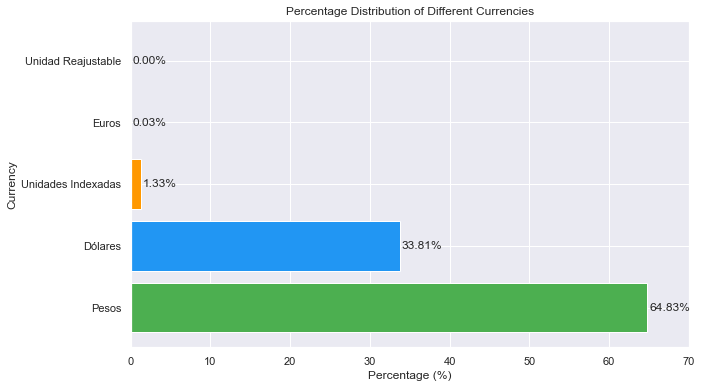

In [913]:
# Updated data with correct values
data = {
    'Currency': ['Pesos', 'Dólares', 'Unidades Indexadas', 'Euros', 'Unidad Reajustable'],
    'Count': [15337, 7999, 315, 7, 1],
    'Percentage': [64.83, 33.81, 1.33, 0.03, 0.00]
}

# Creating a bar plot
plt.figure(figsize=(10, 6))
plt.barh(data['Currency'], data['Percentage'], color=['#4CAF50', '#2196F3', '#FF9800', '#9C27B0', '#673AB7'])

# Adding labels and title
plt.xlabel('Percentage (%)')
plt.ylabel('Currency')
plt.title('Percentage Distribution of Different Currencies')
plt.xlim(0, 70)

# Adding data labels to each bar
for index, value in enumerate(data['Percentage']):
    plt.text(value + 0.2, index, f'{value:.2f}%', va='center', ha='left', fontsize=12)

# Display the plot
plt.show()


64.83% of payments are in pesos. 33.81% are in dollars, and 98.64% of the entire budget is modeled for these two currencies.

In [914]:
df_pagos.describe()

,pag_pk,pag_importe_planificado,pag_importe_real,pag_confirmar,mon_pk
count,23659.000000,2.365900e+04,2.365900e+04,23659.0,23659.000000
mean,22955.088254,2.246513e+05,2.156076e+05,1.0,1.392071
std,13275.837788,1.995342e+06,1.073419e+06,0.0,0.631651
min,125.000000,-4.306824e+06,-4.306824e+06,1.0,1.000000
25%,11501.500000,3.440000e+02,1.039000e+03,1.0,1.000000
50%,22501.000000,8.120000e+03,1.080000e+04,1.0,1.000000
75%,34219.500000,8.772700e+04,8.835750e+04,1.0,2.000000
max,49296.000000,1.800000e+08,5.621250e+07,1.0,5.000000


In [915]:
import plotly.express as px
fig = px.box(df_pagos, y="pag_importe_real")
fig.show()

Skewed Distribution: The distribution of pag_importe_real is heavily right-skewed, meaning most payments are small, with a few larger payments pulling the distribution's tail towards the higher values.
Potential Outliers: The plot highlights a substantial number of high-value outliers. These might represent large or special transactions that are significantly different from the majority of payments.
Insight into Payment Behavior: The plot suggests that in this dataset, small payments are the norm, but there are occasional transactions that involve much larger sums, potentially indicating different types of payments or special cases.

In [875]:
import plotly.express as px
fig = px.box(df_pagos, y="pag_importe_planificado")
fig.show()

Alignment with Expectations: The overall distribution of planned and real payments is similar, indicating that the payment execution closely followed the planned budget for most transactions.
Variance in Large Transactions: The presence of larger outliers in the planned payments compared to the real payments suggests that some large transactions were planned but were either scaled down or not executed as anticipated.
Financial Planning Insight: This comparison highlights the importance of careful financial planning and monitoring, especially for larger transactions, where there is a higher variance between planned and actual payments.

In [916]:
df_indice_recet= df_pagos.reset_index()

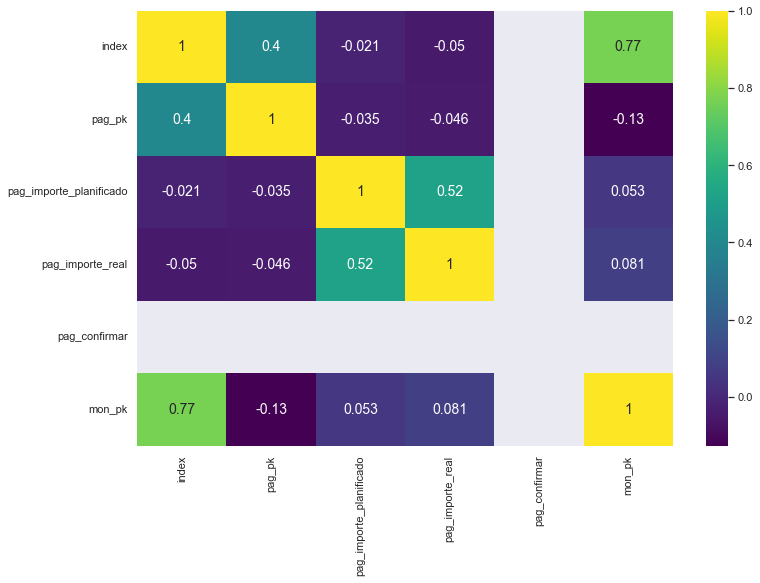

In [917]:
plt.figure(figsize=(12, 8))
sns.heatmap(df_indice_recet.corr(), annot=True, cmap='viridis')
plt.show()

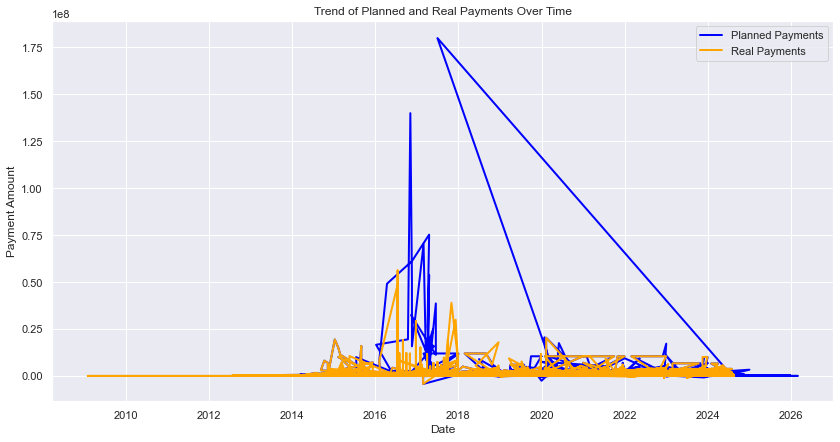

In [918]:
import pandas as pd
import matplotlib.pyplot as plt

# Convert date columns to datetime
df_pagos['pag_fecha_planificada'] = pd.to_datetime(df_pagos['pag_fecha_planificada'])
df_pagos['pag_fecha_real'] = pd.to_datetime(df_pagos['pag_fecha_real'])

# Plot planned payments over time
plt.figure(figsize=(14, 7))
plt.plot(df_pagos['pag_fecha_planificada'], df_pagos['pag_importe_planificado'], label='Planned Payments', color='blue')
plt.plot(df_pagos['pag_fecha_real'], df_pagos['pag_importe_real'], label='Real Payments', color='orange')
plt.xlabel('Date')
plt.ylabel('Payment Amount')
plt.title('Trend of Planned and Real Payments Over Time')
plt.legend()
plt.show()


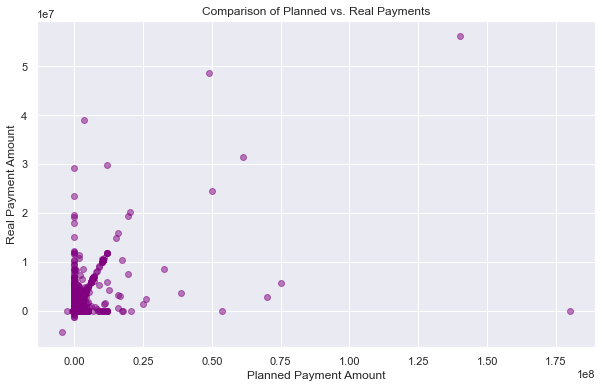

<Figure size 720x432 with 0 Axes>

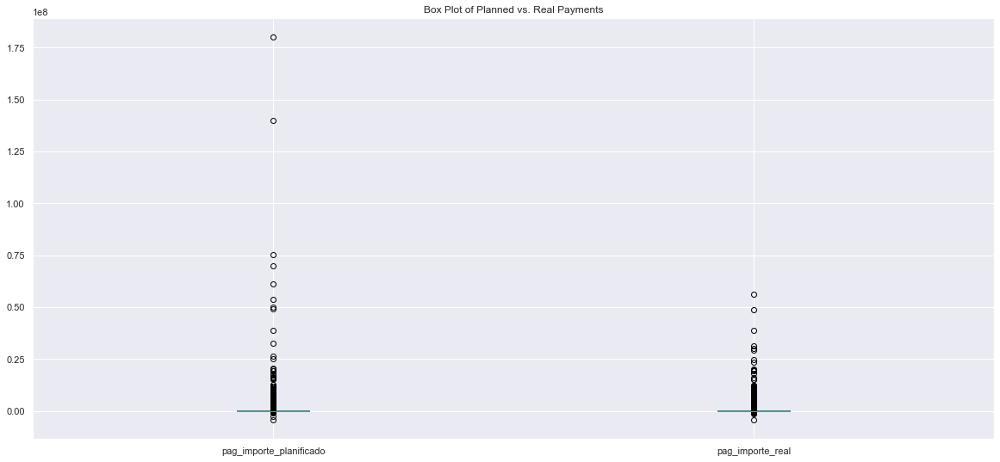

In [919]:
# Scatter plot comparing planned and real payments
plt.figure(figsize=(10, 6))
plt.scatter(df_pagos['pag_importe_planificado'], df_pagos['pag_importe_real'], alpha=0.5, color='purple')
plt.xlabel('Planned Payment Amount')
plt.ylabel('Real Payment Amount')
plt.title('Comparison of Planned vs. Real Payments')
plt.show()

# Box plot for planned vs. real payments
plt.figure(figsize=(10, 6))
df_pagos[['pag_importe_planificado', 'pag_importe_real']].plot(kind='box')
plt.title('Box Plot of Planned vs. Real Payments')
plt.show()



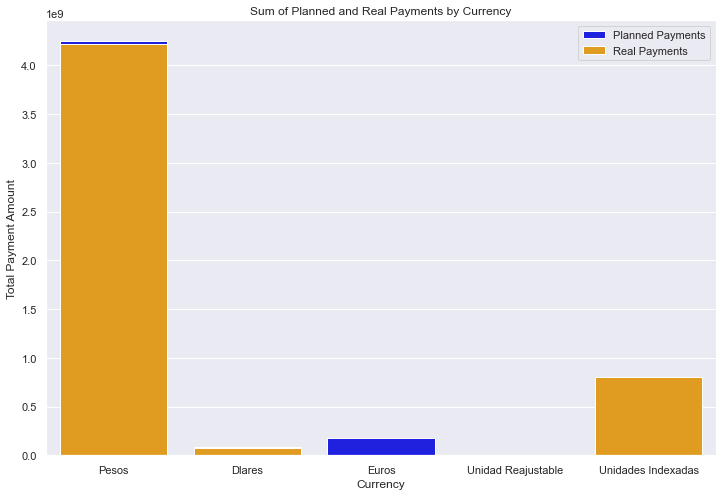

In [880]:
import seaborn as sns

# Grouped bar plot by currency
plt.figure(figsize=(12, 8))
sns.barplot(x='mon_nombre', y='pag_importe_planificado', data=df_pagos, estimator=sum, ci=None, label='Planned Payments', color='blue')
sns.barplot(x='mon_nombre', y='pag_importe_real', data=df_pagos, estimator=sum, ci=None, label='Real Payments', color='orange')
plt.title('Sum of Planned and Real Payments by Currency')
plt.ylabel('Total Payment Amount')
plt.xlabel('Currency')
plt.legend()
plt.show()


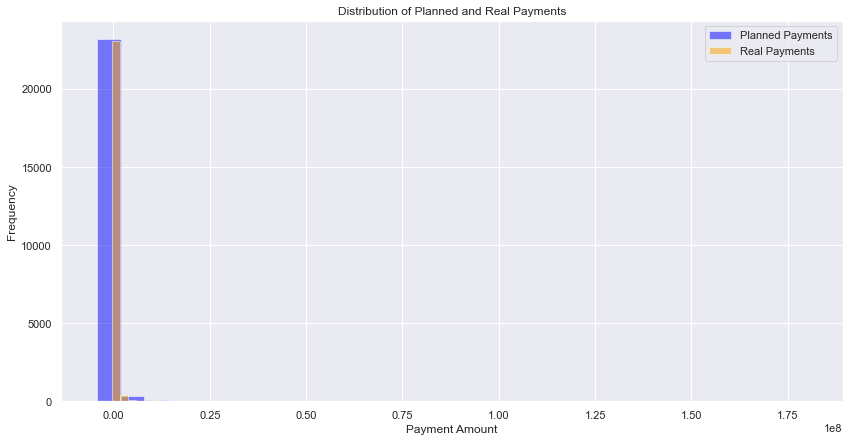

In [881]:
# Histograms for payment distributions
plt.figure(figsize=(14, 7))
df_pagos['pag_importe_planificado'].hist(bins=30, alpha=0.5, label='Planned Payments', color='blue')
df_pagos['pag_importe_real'].hist(bins=30, alpha=0.5, label='Real Payments', color='orange')
plt.xlabel('Payment Amount')
plt.ylabel('Frequency')
plt.title('Distribution of Planned and Real Payments')
plt.legend()
plt.show()


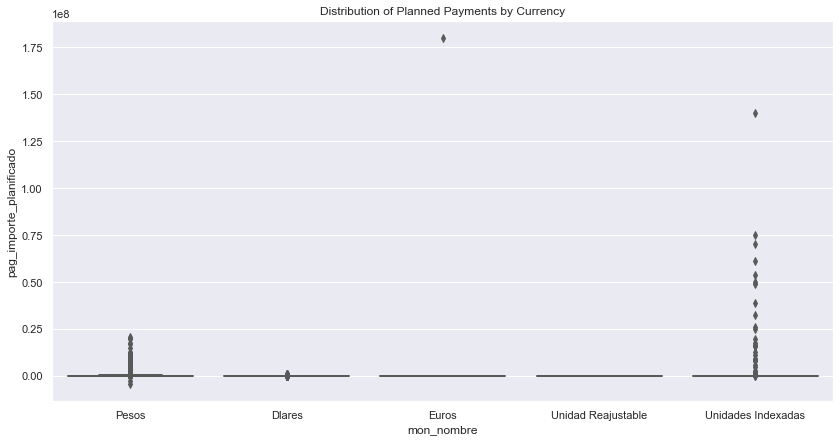

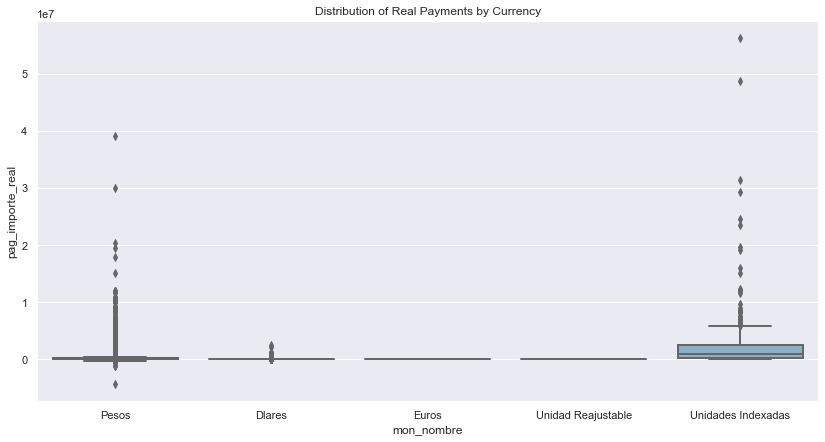

In [882]:
# Box plots segmented by currency
plt.figure(figsize=(14, 7))
sns.boxplot(x='mon_nombre', y='pag_importe_planificado', data=df_pagos, palette='Set2')
plt.title('Distribution of Planned Payments by Currency')
plt.show()

plt.figure(figsize=(14, 7))
sns.boxplot(x='mon_nombre', y='pag_importe_real', data=df_pagos, palette='Set3')
plt.title('Distribution of Real Payments by Currency')
plt.show()


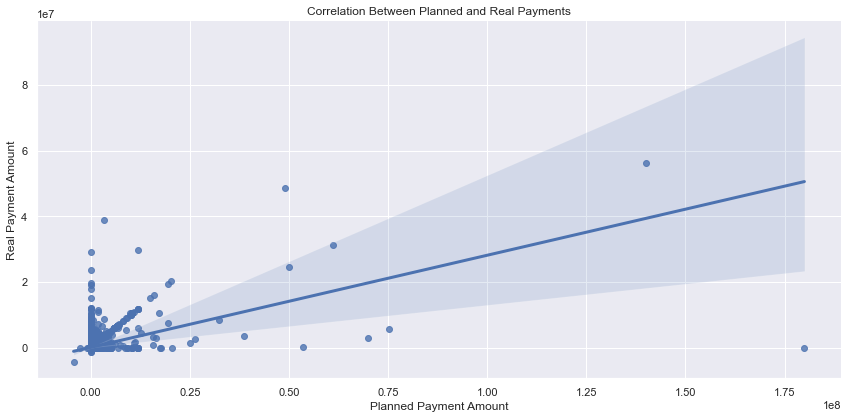

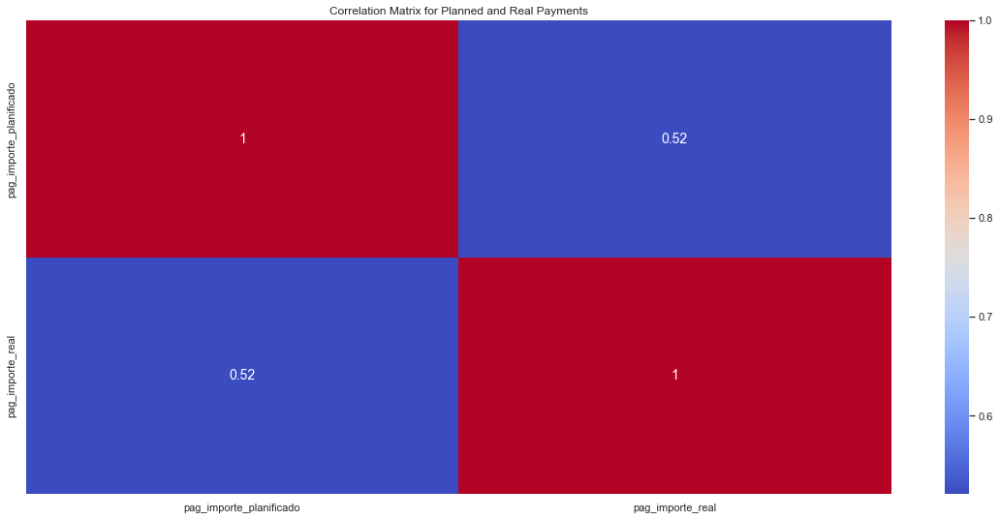

In [883]:
# Scatter plot with trend line
sns.lmplot(x='pag_importe_planificado', y='pag_importe_real', data=df_pagos, aspect=2, height=6)
plt.xlabel('Planned Payment Amount')
plt.ylabel('Real Payment Amount')
plt.title('Correlation Between Planned and Real Payments')
plt.show()

# Correlation matrix
correlation_matrix = df_pagos[['pag_importe_planificado', 'pag_importe_real']].corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix for Planned and Real Payments')
plt.show()


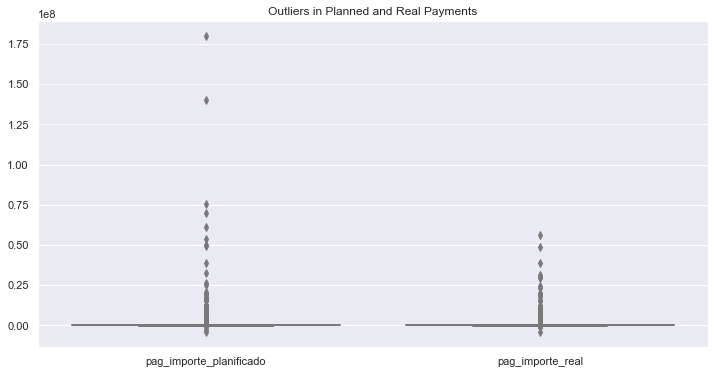

In [884]:
# Box plots to detect outliers in planned and real payments
plt.figure(figsize=(12, 6))
sns.boxplot(data=df_pagos[['pag_importe_planificado', 'pag_importe_real']], palette='coolwarm')
plt.title('Outliers in Planned and Real Payments')
plt.show()


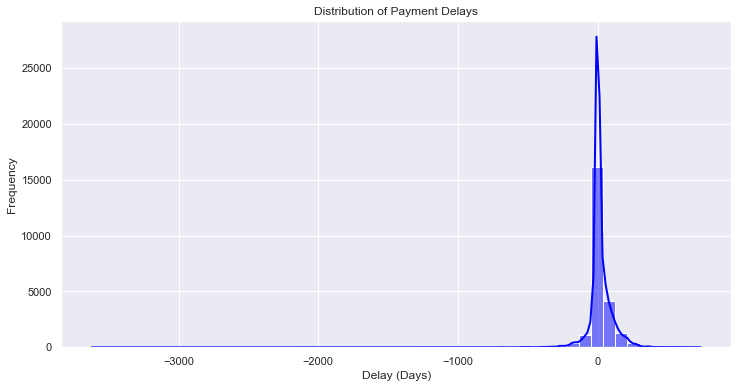

In [885]:
# Calculate delay between planned and real payment dates
df_pagos['delay_days'] = (pd.to_datetime(df_pagos['pag_fecha_real']) - pd.to_datetime(df_pagos['pag_fecha_planificada'])).dt.days

# Plot the distribution of delays
plt.figure(figsize=(12, 6))
sns.histplot(df_pagos['delay_days'], bins=50, kde=True, color='blue')
plt.title('Distribution of Payment Delays')
plt.xlabel('Delay (Days)')
plt.ylabel('Frequency')
plt.show()


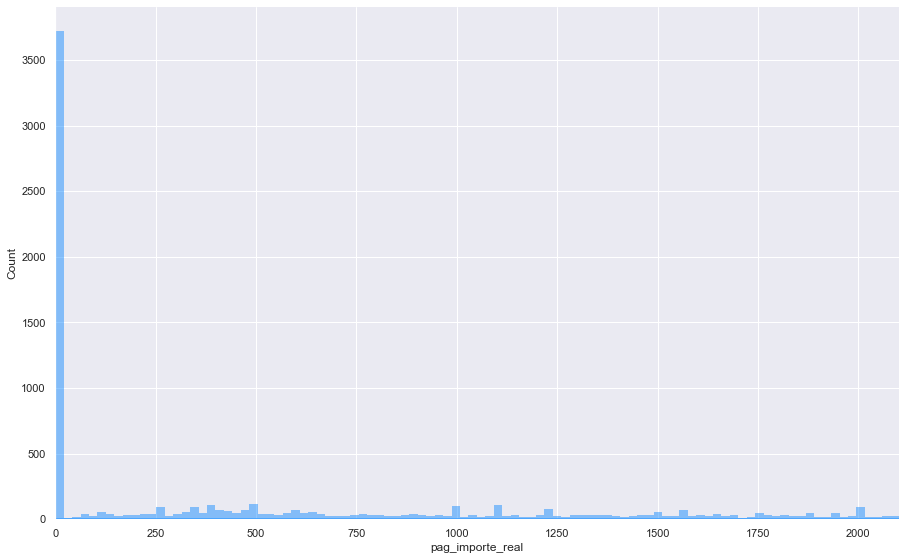

In [886]:
d2 = sns.displot(data=df_indice_recet, x='pag_importe_real', kde=True, height=8, aspect=1.6, bins=100, binrange=(0, 2100), color='dodgerblue')
d2.set(xlabel='pag_importe_real')
plt.xlim(0, 2100)
plt.show()

In [920]:
#Cambio de los tipo objetos a tipo fecha 
df_pagos['pag_fecha_planificada'] = pd.to_datetime(df_pagos['pag_fecha_planificada'])
df_pagos['pag_fecha_real'] = pd.to_datetime(df_pagos['pag_fecha_real'])

df_pagos.head()

,pag_pk,pag_fecha_planificada,pag_importe_planificado,pag_fecha_real,pag_importe_real,pag_confirmar,mon_pk,mon_nombre
106,125.0,2012-11-23,25205.0,2012-11-23,25205.0,1.0,1,Pesos
107,427.0,2012-12-28,25205.0,2012-12-28,25205.0,1.0,1,Pesos
108,428.0,2013-05-10,17644.0,2013-05-10,17644.0,1.0,1,Pesos
109,429.0,2013-06-21,17644.0,2013-06-21,17644.0,1.0,1,Pesos
110,430.0,2013-07-26,40328.0,2013-07-26,40328.0,1.0,1,Pesos


In [921]:
sns.set_style('darkgrid')
plt.rcParams['font.size'] = 14
plt.rcParams['figure.figsize'] = (20, 9)
plt.rcParams['figure.facecolor'] = '#00000000'
plt.rcParams['lines.linewidth'] = 2
# plt.style.use('fivethirtyeight')

In [922]:
df_pagos.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 23659 entries, 106 to 30121
Data columns (total 8 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   pag_pk                   23659 non-null  float64       
 1   pag_fecha_planificada    23659 non-null  datetime64[ns]
 2   pag_importe_planificado  23659 non-null  float64       
 3   pag_fecha_real           23659 non-null  datetime64[ns]
 4   pag_importe_real         23659 non-null  float64       
 5   pag_confirmar            23659 non-null  float64       
 6   mon_pk                   23659 non-null  int64         
 7   mon_nombre               23659 non-null  object        
dtypes: datetime64[ns](2), float64(4), int64(1), object(1)
memory usage: 1.6+ MB


In [923]:
df_pagos_DP=df_pagos

In [889]:

dfi=df_pagos.set_index('pag_fecha_real', drop=True, append=False, inplace=False, verify_integrity=False)
dfi

,pag_pk,pag_fecha_planificada,pag_importe_planificado,pag_importe_real,pag_confirmar,mon_pk,mon_nombre,delay_days
pag_fecha_real,,,,,,,,
2012-11-23,125.0,2012-11-23,25205.0,25205.0,1.0,1,Pesos,0
2012-12-28,427.0,2012-12-28,25205.0,25205.0,1.0,1,Pesos,0
2013-05-10,428.0,2013-05-10,17644.0,17644.0,1.0,1,Pesos,0
2013-06-21,429.0,2013-06-21,17644.0,17644.0,1.0,1,Pesos,0
2013-07-26,430.0,2013-07-26,40328.0,40328.0,1.0,1,Pesos,0
...,...,...,...,...,...,...,...,...
2018-01-22,9861.0,2017-06-16,0.0,144163.0,1.0,5,Unidades Indexadas,220
2018-01-22,9862.0,2017-06-07,0.0,457457.0,1.0,5,Unidades Indexadas,229
2018-01-22,9863.0,2017-05-30,0.0,191963.0,1.0,5,Unidades Indexadas,237


In [891]:
pesos =dfi.query("mon_nombre == 'Pesos'")
dolares = dfi.query("mon_nombre == 'Dlares'")
euros = dfi.query("mon_nombre == 'Euro'")

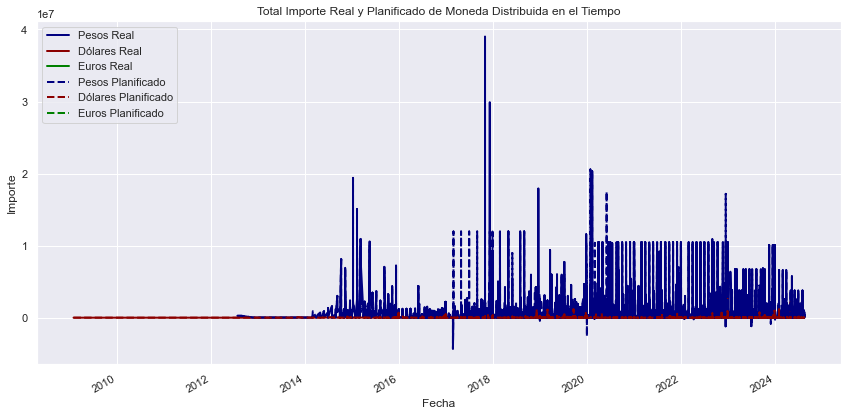

In [894]:
import matplotlib.pyplot as plt
import pandas as pd

fig, ax = plt.subplots(figsize=(12, 6))

# Usar colores y estilos de línea distintivos
pesos['pag_importe_real'].plot(ax=ax, color='navy', linestyle='-', label='Pesos Real')
dolares['pag_importe_real'].plot(ax=ax, color='darkred', linestyle='-', label='Dólares Real')
euros['pag_importe_real'].plot(ax=ax, color='green', linestyle='-', label='Euros Real')

pesos['pag_importe_planificado'].plot(ax=ax, color='navy', linestyle='--', label='Pesos Planificado')
dolares['pag_importe_planificado'].plot(ax=ax, color='darkred', linestyle='--', label='Dólares Planificado')
euros['pag_importe_planificado'].plot(ax=ax, color='green', linestyle='--', label='Euros Planificado')

ax.set_title('Total Importe Real y Planificado de Moneda Distribuida en el Tiempo')
ax.set_xlabel('Fecha')
ax.set_ylabel('Importe')
ax.legend(loc='upper left')
ax.grid(True)
ax.set_axisbelow(True)

plt.tight_layout()
plt.show()


It is observed that election years and seasonality have an impact, with the highest execution being concentrated in December at the end of the year.

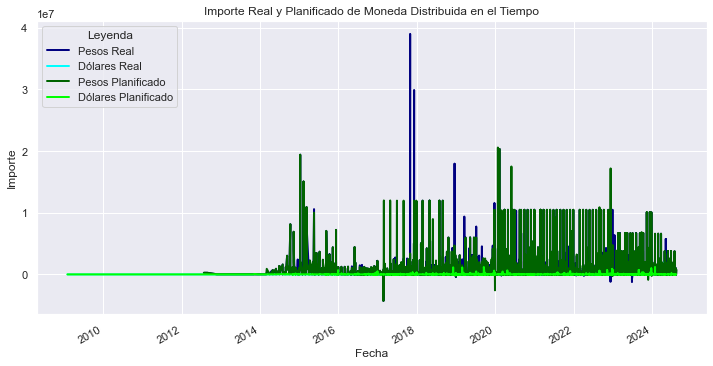

In [895]:
import matplotlib.pyplot as plt
import pandas as pd

# Suponiendo que 'pesos' y 'dolares' ya están definidos y contienen los datos adecuados
fig, ax = plt.subplots(figsize=(12, 6))

# Usar una paleta de colores más distintiva
pesos['pag_importe_real'].plot(ax=ax, color='navy', label='Pesos Real')
dolares['pag_importe_real'].plot(ax=ax, color='cyan', label='Dólares Real')
pesos['pag_importe_planificado'].plot(ax=ax, color='darkgreen', label='Pesos Planificado')
dolares['pag_importe_planificado'].plot(ax=ax, color='lime', label='Dólares Planificado')

ax.set_title('Importe Real y Planificado de Moneda Distribuida en el Tiempo')
ax.set_xlabel('Fecha')
ax.set_ylabel('Importe')
ax.legend(title='Leyenda', loc='upper left')
ax.grid(True)
ax.set_axisbelow(True)

plt.show()



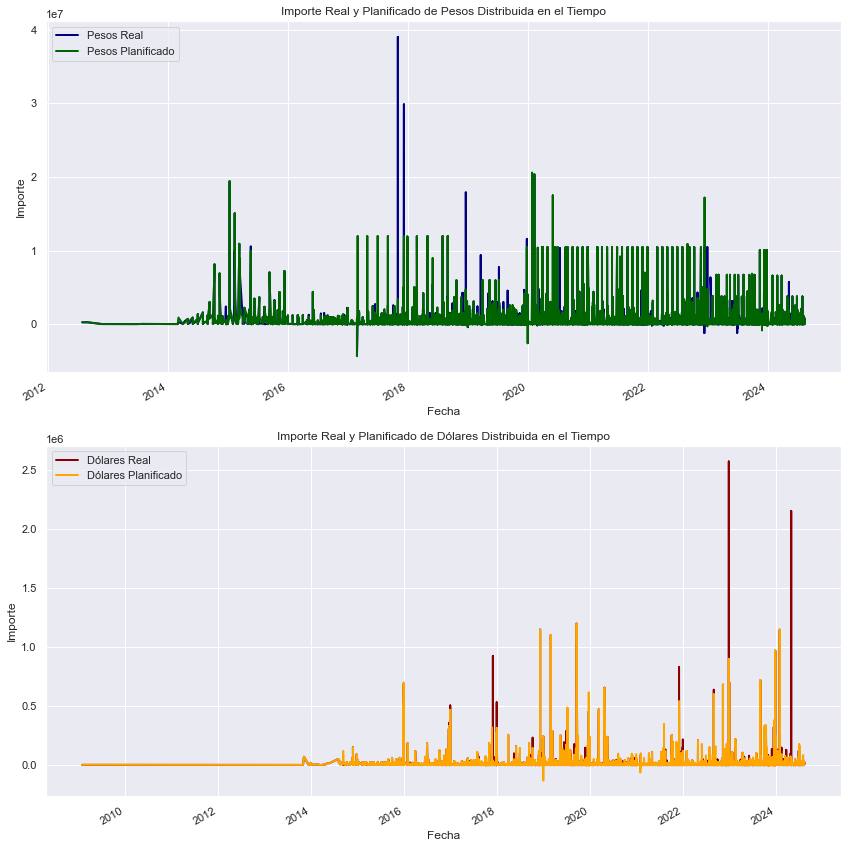

In [896]:
import matplotlib.pyplot as plt
import pandas as pd

# Suponiendo que 'pesos' y 'dolares' ya están definidos y contienen los datos adecuados
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 12))

# Gráfico para pesos
pesos['pag_importe_real'].plot(ax=ax1, color='navy', label='Pesos Real')
pesos['pag_importe_planificado'].plot(ax=ax1, color='darkgreen', label='Pesos Planificado')
ax1.set_title('Importe Real y Planificado de Pesos Distribuida en el Tiempo')
ax1.set_xlabel('Fecha')
ax1.set_ylabel('Importe')
ax1.legend(loc='upper left')
ax1.grid(True)

# Gráfico para dólares con nuevos colores
dolares['pag_importe_real'].plot(ax=ax2, color='darkred', label='Dólares Real')
dolares['pag_importe_planificado'].plot(ax=ax2, color='orange', label='Dólares Planificado')
ax2.set_title('Importe Real y Planificado de Dólares Distribuida en el Tiempo')
ax2.set_xlabel('Fecha')
ax2.set_ylabel('Importe')
ax2.legend(loc='upper left')
ax2.grid(True)

plt.tight_layout()
plt.show()



The planned value can be observed in contrast with the actual value, where it can be seen that 2019 is an election year, where there is no allocated budget, which affects the time to develop projects.

In [897]:
df_pagos=dfi.reset_index()

In [898]:
df_pagos.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23659 entries, 0 to 23658
Data columns (total 9 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   pag_fecha_real           23659 non-null  datetime64[ns]
 1   pag_pk                   23659 non-null  float64       
 2   pag_fecha_planificada    23659 non-null  datetime64[ns]
 3   pag_importe_planificado  23659 non-null  float64       
 4   pag_importe_real         23659 non-null  float64       
 5   pag_confirmar            23659 non-null  float64       
 6   mon_pk                   23659 non-null  int64         
 7   mon_nombre               23659 non-null  object        
 8   delay_days               23659 non-null  int64         
dtypes: datetime64[ns](2), float64(4), int64(2), object(1)
memory usage: 1.6+ MB


In [667]:
df_pagos.sample(2)

,pag_fecha_real,pag_pk,pag_fecha_planificada,pag_importe_planificado,pag_importe_real,pag_confirmar,mon_pk,mon_nombre
4555,2019-12-10,20107.0,2019-12-16,0.0,20398.0,1.0,1,Pesos
18074,2018-11-29,11160.0,2018-11-29,2927.0,0.0,1.0,2,Dlares


# PESOS BUDGET PREDICTION MODEL

In [899]:
#Eliminan las filas de esos registros
indexNames = df_pagos[df_pagos['mon_pk']==2].index
# Delete these row indexes from dataFrame

df_pagos.drop(indexNames,inplace=True)

In [900]:
df_pagos.sample(5)

,pag_fecha_real,pag_pk,pag_fecha_planificada,pag_importe_planificado,pag_importe_real,pag_confirmar,mon_pk,mon_nombre,delay_days
6778,2020-09-15,24533.0,2020-09-29,0.0,21877.0,1.0,1,Pesos,-14
14108,2023-04-30,40353.0,2023-04-30,457.5,0.0,1.0,1,Pesos,0
8671,2020-12-14,24647.0,2020-10-15,0.0,5551.0,1.0,1,Pesos,60
8374,2021-10-27,24067.0,2021-05-28,4000.0,907.0,1.0,1,Pesos,152
6727,2019-12-19,20166.0,2019-12-27,0.0,67871.0,1.0,1,Pesos,-8


In [901]:
pagos_modelo_pesos=df_pagos.drop(['pag_pk','pag_fecha_planificada','pag_importe_planificado','pag_confirmar','mon_pk','mon_nombre'],axis=1)
pagos_modelo_pesos.shape

(15660, 3)

In [671]:
pagos_modelo_pesos.sample(5)

,pag_fecha_real,pag_importe_real
2056,2017-08-31,16958.0
6182,2019-12-31,0.0
11281,2022-05-28,1581647.0
7549,2021-06-02,195318.0
6936,2020-03-29,316247.0


In [672]:
#Eliminan las filas de esos registros por debaje del 1% del valor medior dado que se suprimen 8% de registros es despeciable.
indexNames = pagos_modelo_pesos[pagos_modelo_pesos['pag_importe_real']<=3019.0].index
# Delete these row indexes from dataFrame

pagos_modelo_pesos.drop(indexNames,inplace=True)

In [673]:
#Eliminamos las filtas por encima de 12 millones dado que son los outlier del boxplot.
indexNames = pagos_modelo_pesos[pagos_modelo_pesos['pag_importe_real']>1200000].index
# Delete these row indexes from dataFrame

pagos_modelo_pesos.drop(indexNames,inplace=True)

In [674]:
pagos_modelo_pesos.sort_values(['pag_fecha_real', 'pag_importe_real'],ascending=False) 
pagos_modelo_pesos

,pag_fecha_real,pag_importe_real
0,2012-11-23,25205.0
1,2012-12-28,25205.0
2,2013-05-10,17644.0
3,2013-06-21,17644.0
4,2013-07-26,40328.0
...,...,...
23654,2018-01-22,144163.0
23655,2018-01-22,457457.0
23656,2018-01-22,191963.0
23657,2015-07-15,138538.0


In [675]:
pagos_modelo_pesos.head(5)

,pag_fecha_real,pag_importe_real
0,2012-11-23,25205.0
1,2012-12-28,25205.0
2,2013-05-10,17644.0
3,2013-06-21,17644.0
4,2013-07-26,40328.0


In [676]:
pagos_modelo_pesos.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 11347 entries, 0 to 23658
Data columns (total 2 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   pag_fecha_real    11347 non-null  datetime64[ns]
 1   pag_importe_real  11347 non-null  float64       
dtypes: datetime64[ns](1), float64(1)
memory usage: 265.9 KB


In [677]:
pagos_modelo_pesos['pag_importe_real'].max()

1198528.0

In [678]:
pagos_modelo_pesos['pag_importe_real'].mean()

168768.95297699835

In [679]:
pagos_modelo_pesos['pag_importe_real'].min()

3031.0


We generally use scatterplots to find the correlation between two variables. With the chart shown below, we can easily draw a trend line. These characteristics provide a good spread of points.


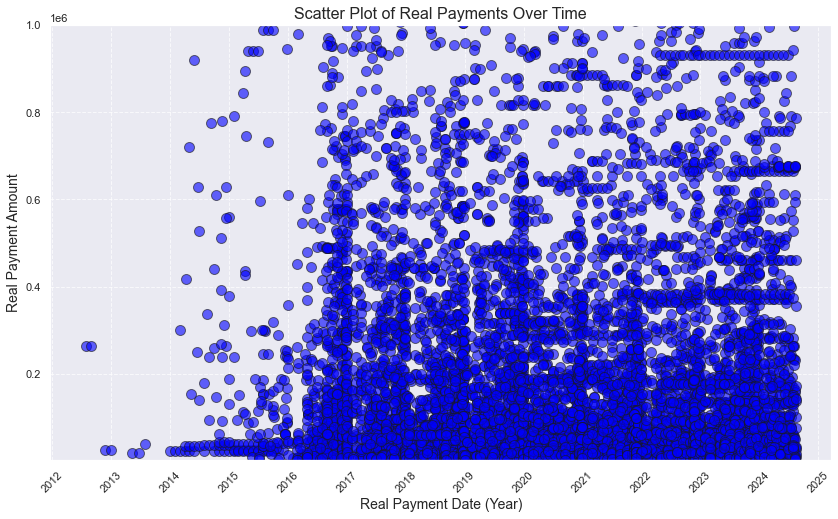

In [680]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

# Create a figure and axis with a larger size
fig, ax = plt.subplots(figsize=(14, 8))

# Scatter plot with improved aesthetics
ax.scatter(x=pagos_modelo_pesos['pag_fecha_real'], y=pagos_modelo_pesos['pag_importe_real'], 
           color='blue', alpha=0.6, edgecolor='k', s=100)

# Set y-axis limit
plt.ylim(3031.0, 1000000.0)

# Format the date on the x-axis to show years only
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
ax.xaxis.set_major_locator(mdates.YearLocator())

# Rotate the date labels for better readability
plt.xticks(rotation=45)

# Add labels and title
ax.set_xlabel('Real Payment Date (Year)', fontsize=14)
ax.set_ylabel('Real Payment Amount', fontsize=14)
ax.set_title('Scatter Plot of Real Payments Over Time', fontsize=16)

# Add a grid
ax.grid(True, linestyle='--', alpha=0.7)

# Save the improved plot as a PNG with better quality
plt.savefig('diagrama-dispersion-por-anio.png', dpi=300, bbox_inches='tight')

# Show the plot
plt.show()


It is observed that payments begin to be made starting in 2014 until 2024, therefore we understand that the prediction should be from 2014 onwards. It is also observed that all payments are accumulated in December, which is when the budget must be executed

In [681]:
sp = pagos_modelo_pesos.rename(columns={'pag_fecha_real': 'ds','pag_importe_real': 'y'})
sp_sample = sp[(sp.ds.dt.year>2014)]

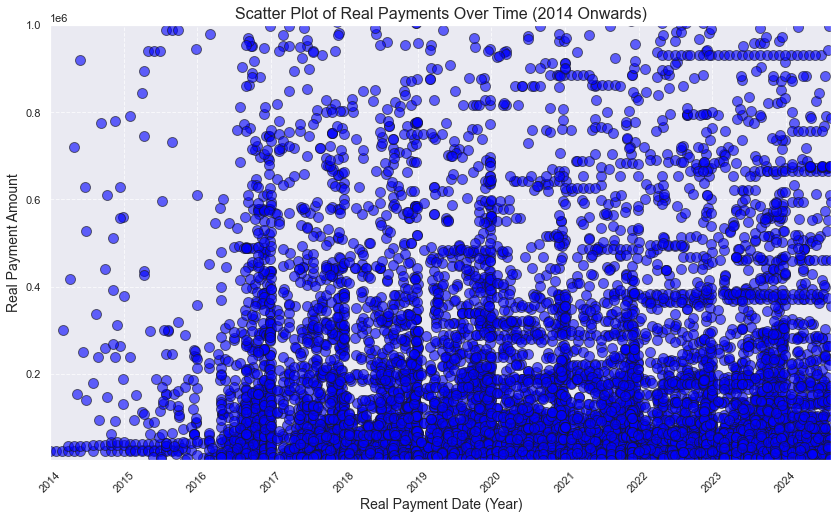

In [682]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

# Assuming pagos_modelo_pesos is already defined and has the data

# Create a figure and axis with a larger size
fig, ax = plt.subplots(figsize=(14, 8))

# Scatter plot with improved aesthetics
ax.scatter(x=pagos_modelo_pesos['pag_fecha_real'], y=pagos_modelo_pesos['pag_importe_real'], 
           color='blue', alpha=0.6, edgecolor='k', s=100)

# Set y-axis limit
plt.ylim(3031.0, 1000000.0)

# Filter dates to show from 2014 onwards
ax.set_xlim(pd.Timestamp('2014-01-01'), pagos_modelo_pesos['pag_fecha_real'].max())

# Format the date on the x-axis to show years only
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
ax.xaxis.set_major_locator(mdates.YearLocator())

# Rotate the date labels for better readability
plt.xticks(rotation=45)

# Add labels and title
ax.set_xlabel('Real Payment Date (Year)', fontsize=14)
ax.set_ylabel('Real Payment Amount', fontsize=14)
ax.set_title('Scatter Plot of Real Payments Over Time (2014 Onwards)', fontsize=16)

# Add a grid
ax.grid(True, linestyle='--', alpha=0.7)

# Save the improved plot as a PNG with better quality
plt.savefig('diagrama-dispersion-2014-adelante.png', dpi=300, bbox_inches='tight')

# Show the plot
plt.show()


In [683]:
model1 = Prophet(interval_width=0.95)
model1.add_country_holidays(country_name='UY')
model1.fit(sp_sample)

17:00:08 - cmdstanpy - INFO - Chain [1] start processing
17:00:11 - cmdstanpy - INFO - Chain [1] done processing


In [684]:
future = model1.make_future_dataframe(periods=30, freq="B")
forecast = model1.predict(future)

forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
1719,2024-09-20,206756.376164,-265976.991403,658751.073773
1720,2024-09-23,205786.618399,-264932.802575,657903.489803
1721,2024-09-24,195362.917264,-263552.399344,688834.304728
1722,2024-09-25,191576.738524,-267294.294351,612160.994998
1723,2024-09-26,197118.675268,-242459.377528,650887.425888


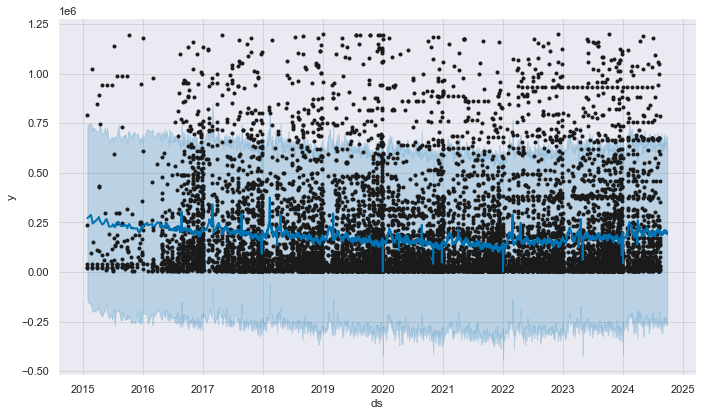

In [685]:
fig = model1.plot(forecast)

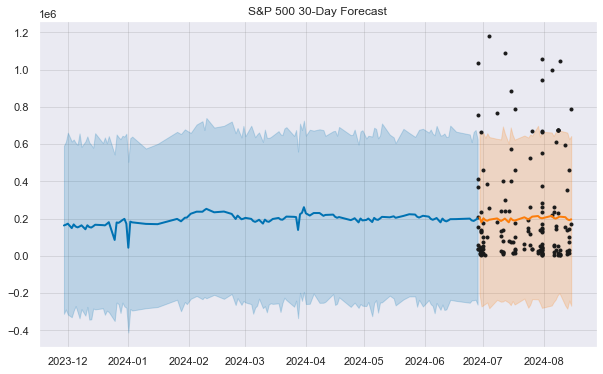

In [686]:
def custom_forecast_plot():
    forecast_length = 30

    prior_df = sp[(sp.ds.dt.year>2014)]
    forecast_df = sp[(sp.ds.dt.year==2021) & (sp.ds.dt.month==1)]
    all_df = pd.concat([prior_df, forecast_df]).sort_values('ds')
    all_df.head()

    all_df_sample = all_df[-forecast_length*5:]
    forecast_sample = forecast[forecast['ds'].isin(all_df["ds"].values)].sort_values('ds')

    prior_vis_df = forecast_sample[-forecast_length*5:-forecast_length]
    forecast_vis_df = forecast_sample[-forecast_length:]

    fig = plt.figure(figsize=(10,6))
    ax = fig.add_subplot(111)

    ax.plot(all_df_sample['ds'].dt.to_pydatetime(), all_df_sample["y"], '.k')

    ax.plot(prior_vis_df['ds'].dt.to_pydatetime(), prior_vis_df['yhat'], ls='-', c='#0072B2')
    ax.fill_between(prior_vis_df['ds'].dt.to_pydatetime(), prior_vis_df['yhat_lower'], prior_vis_df['yhat_upper'], color='#0072B2', alpha=0.2)

    ax.plot(forecast_vis_df['ds'].dt.to_pydatetime(), forecast_vis_df['yhat'], ls='-', c='#fc7d0b')
    ax.fill_between(forecast_vis_df['ds'].dt.to_pydatetime(), forecast_vis_df['yhat_lower'], forecast_vis_df['yhat_upper'], color='#fc7d0b', alpha=0.2)
    ax.grid(True, which='major', c='gray', ls='-', lw=1, alpha=0.2)

    ax.set_title('S&P 500 30-Day Forecast')
    plt.show(sns)
    
custom_forecast_plot()

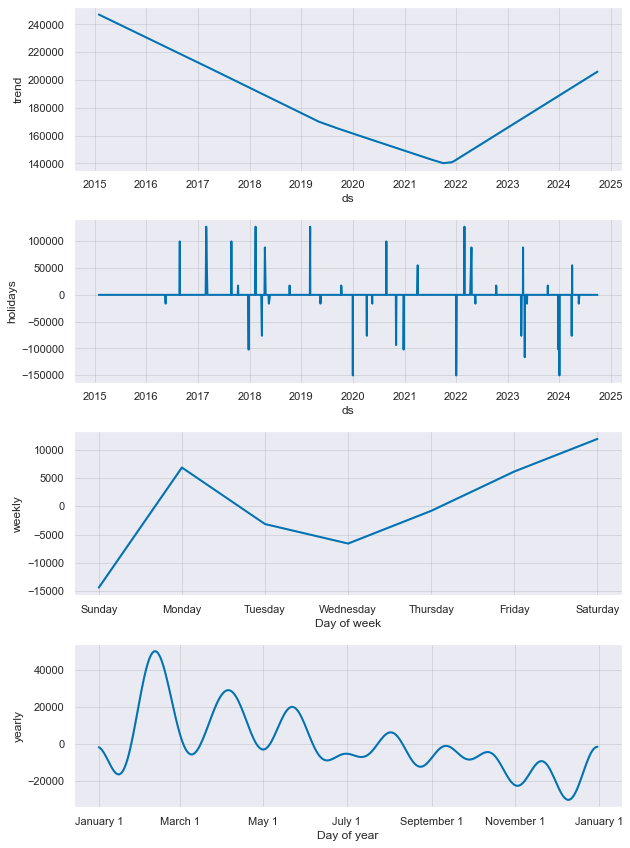

In [687]:
fig = model1.plot_components(forecast)

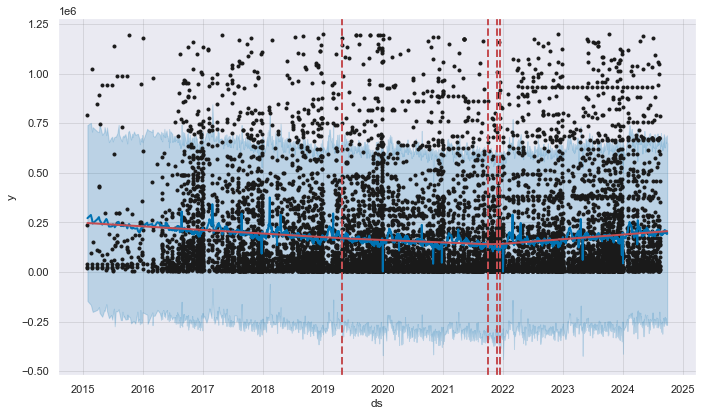

In [688]:
fig = model1.plot(forecast)
a = add_changepoints_to_plot(fig.gca(), model1, forecast)

17:00:33 - cmdstanpy - INFO - Chain [1] start processing
17:00:36 - cmdstanpy - INFO - Chain [1] done processing


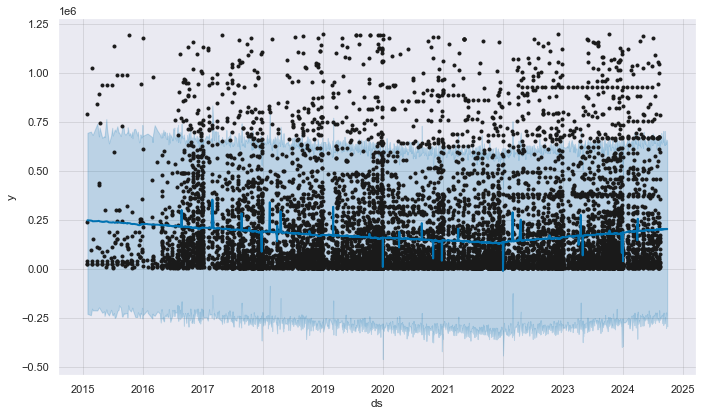

In [689]:
model4 = Prophet(interval_width=0.95, seasonality_prior_scale=0.001)
model4.add_country_holidays(country_name='UY')
forecast = model4.fit(sp_sample).predict(future)
fig = model4.plot(forecast)

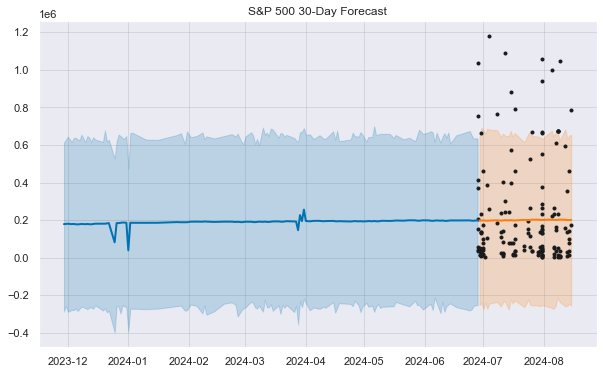

In [690]:
custom_forecast_plot()

17:00:48 - cmdstanpy - INFO - Chain [1] start processing
17:00:50 - cmdstanpy - INFO - Chain [1] done processing


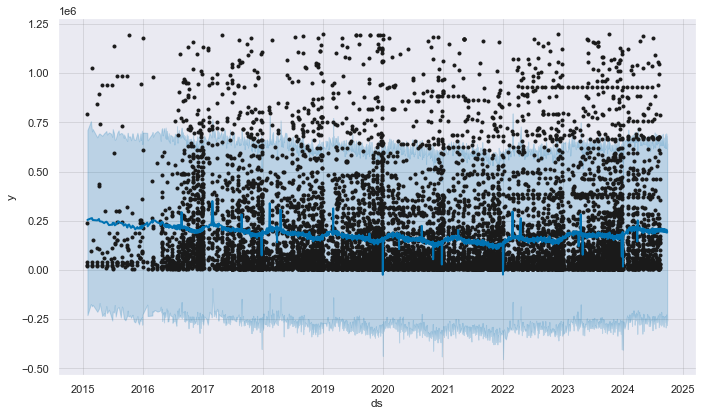

In [691]:
model5 = Prophet(interval_width=0.95, weekly_seasonality=True)
model5.add_seasonality(name='yearly', period=365, fourier_order=2)
model5.add_country_holidays(country_name='UY')
forecast = model5.fit(sp_sample).predict(future)
fig = model5.plot(forecast)

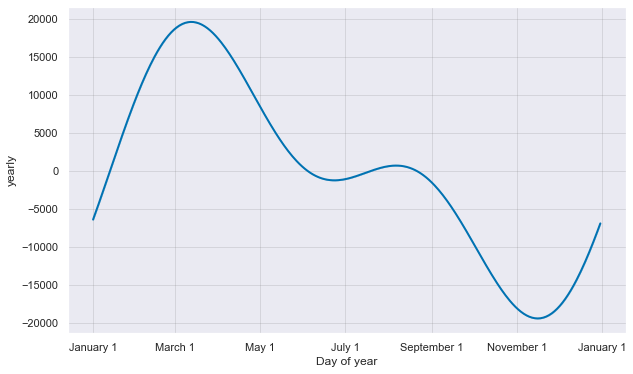

In [692]:
fig = plot_yearly(model5)

In [750]:
# Se aplica el alghoritmo de busqueda manual Grid Search  porque Prophet: no tiene integrado el mismo 
# Define los valores a probar para cada parámetro
param_grid = {
    'changepoint_prior_scale': [0.01, 0.1, 0.5, 0.9],
    'seasonality_prior_scale': [0.01, 0.1, 1, 5, 10],
    'weekly_seasonality': [True, False]
}

# Crear una lista de todas las combinaciones posibles de hiperparámetros
all_params = [dict(zip(param_grid.keys(), v)) for v in itertools.product(*param_grid.values())]

# DataFrame para almacenar los resultados
results = []

# Realizar la búsqueda manualmente
for params in all_params:
    # Construir y entrenar el modelo con los parámetros actuales
    model = Prophet(
        interval_width=0.95,  # Intervalo de confianza para las predicciones, en este caso es del 95%.
        
        changepoint_prior_scale=params['changepoint_prior_scale'],  
        # Controla la flexibilidad del modelo para ajustar cambios en la tendencia (changepoints).
        # Un valor más bajo hará que el modelo sea menos sensible a los cambios, mientras que un valor más alto 
        # permitirá más flexibilidad en la detección de cambios repentinos en la tendencia.
        
        seasonality_prior_scale=params['seasonality_prior_scale'],  
        # Controla la flexibilidad del componente estacional del modelo.
        # Valores más bajos harán que la estacionalidad sea más rígida (menos flexible), capturando solo 
        # patrones estacionales muy consistentes. Valores más altos permiten al modelo ajustarse más a 
        # fluctuaciones estacionales.
        
        weekly_seasonality=params['weekly_seasonality']  
        # Determina si se debe incluir o no la estacionalidad semanal.
        # Si se establece en True, Prophet incluirá automáticamente un componente de estacionalidad semanal. 
        # Si se establece en False, no se modelará la estacionalidad semanal, lo cual puede ser útil si no se 
        # observan patrones semanales significativos en los datos.
    )
    
    model.add_seasonality(name='yearly', period=365, fourier_order=8)
    # Añade un componente de estacionalidad anual personalizado.
    # name='yearly': Nombre de la estacionalidad.
    # period=365: Define el período de la estacionalidad, que en este caso es de 365 días (un año).
    # fourier_order=8: Controla la complejidad del modelo de estacionalidad. Un valor más alto permite que el 
    # modelo capture más detalles en la estacionalidad anual, mientras que un valor más bajo limita la 
    # complejidad y la flexibilidad de este componente.
    
    model.add_country_holidays(country_name='UY')
    # Añade los días festivos nacionales de Uruguay como un componente del modelo.
    # Esto permite que el modelo capture el impacto de los días festivos en la serie temporal, lo cual es 
    # particularmente útil si los días festivos afectan significativamente los datos (por ejemplo, ventas, 
    # tráfico, etc.).
    
    # Entrenar el modelo
    model.fit(sp_sample)
    
    # Predecir en los datos futuros
    forecast = model.predict(future)
    
    # Calcular el MAE entre las predicciones y los valores reales
    forecast_aligned = forecast.set_index('ds').join(sp_sample.set_index('ds')[['y']], how='inner')
    mae = mean_absolute_error(forecast_aligned['y'], forecast_aligned['yhat'])
    
    # Guardar los resultados
    results.append({'params': params, 'mae': mae})

# Convertir los resultados en un DataFrame para fácil acceso
results_df = pd.DataFrame(results)

# Encontrar la combinación de parámetros con el menor MAE
best_params = results_df.loc[results_df['mae'].idxmin()]

print(f"Mejores Parámetros: {best_params['params']}")
print(f"Mejor MAE: {best_params['mae']:.2f}")


17:43:30 - cmdstanpy - INFO - Chain [1] start processing
17:43:32 - cmdstanpy - INFO - Chain [1] done processing
17:43:34 - cmdstanpy - INFO - Chain [1] start processing
17:43:35 - cmdstanpy - INFO - Chain [1] done processing
17:43:37 - cmdstanpy - INFO - Chain [1] start processing
17:43:39 - cmdstanpy - INFO - Chain [1] done processing
17:43:46 - cmdstanpy - INFO - Chain [1] start processing
17:43:48 - cmdstanpy - INFO - Chain [1] done processing
17:43:51 - cmdstanpy - INFO - Chain [1] start processing
17:43:54 - cmdstanpy - INFO - Chain [1] done processing
17:43:56 - cmdstanpy - INFO - Chain [1] start processing
17:43:59 - cmdstanpy - INFO - Chain [1] done processing
17:44:01 - cmdstanpy - INFO - Chain [1] start processing
17:44:03 - cmdstanpy - INFO - Chain [1] done processing
17:44:05 - cmdstanpy - INFO - Chain [1] start processing
17:44:08 - cmdstanpy - INFO - Chain [1] done processing
17:44:11 - cmdstanpy - INFO - Chain [1] start processing
17:44:13 - cmdstanpy - INFO - Chain [1]

Mejores Parámetros: {'changepoint_prior_scale': 0.9, 'seasonality_prior_scale': 10, 'weekly_seasonality': False}
Mejor MAE: 163970.24


* Implement the Best Parameters 

18:27:06 - cmdstanpy - INFO - Chain [1] start processing
18:27:12 - cmdstanpy - INFO - Chain [1] done processing


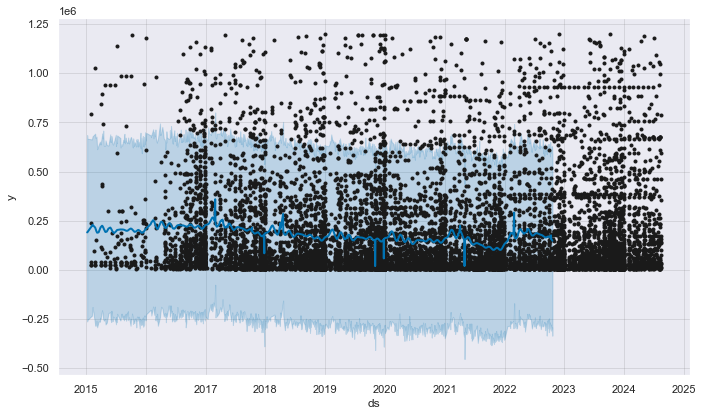

In [798]:
final_model_pesos = Prophet(
    interval_width=0.95, 
    weekly_seasonality=False,  # Activando la estacionalidad semanal
    seasonality_prior_scale=10,  # Incrementando la flexibilidad para capturar la estacionalidad
    changepoint_prior_scale=0.9  # Menos flexible con los cambios en la tendencia
)
final_model_pesos.add_seasonality(name='yearly', period=365, fourier_order=8)
final_model_pesos.add_country_holidays(country_name='UY')
forecast = final_model_pesos.fit(sp_sample).predict(future)
fig = final_model_pesos.plot(forecast)


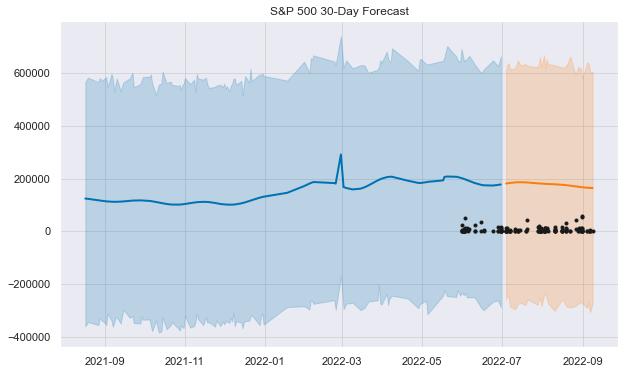

In [799]:
custom_forecast_plot()

In [800]:
from sklearn.metrics import mean_absolute_error

# Aseguramos que ambos DataFrames estén alineados por 'ds' (fecha)
forecast_aligned = forecast.set_index('ds').join(sp_sample.set_index('ds'), how='inner', lsuffix='_pred', rsuffix='_real')






In [801]:
forecast_aligned

,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,Año Nuevo [New Year's Day],Año Nuevo [New Year's Day]_lower,Año Nuevo [New Year's Day]_upper,Batalla de las Piedras [Battle of the stones],Batalla de las Piedras [Battle of the stones]_lower,...,holidays_lower,holidays_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat,y
ds,,,,,,,,,,,,,,,,,,,,,
2015-03-31,196949.463449,-248557.112519,637434.664762,196949.463449,196949.463449,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,18963.710545,18963.710545,18963.710545,0.0,0.0,0.0,215913.173994,24480.0
2015-03-31,196949.463449,-248557.112519,637434.664762,196949.463449,196949.463449,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,18963.710545,18963.710545,18963.710545,0.0,0.0,0.0,215913.173994,38558.0
2015-03-31,196949.463449,-248557.112519,637434.664762,196949.463449,196949.463449,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,18963.710545,18963.710545,18963.710545,0.0,0.0,0.0,215913.173994,844778.0
2015-03-31,196949.463449,-248557.112519,637434.664762,196949.463449,196949.463449,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,18963.710545,18963.710545,18963.710545,0.0,0.0,0.0,215913.173994,22597.0
2015-03-31,196949.463449,-248557.112519,637434.664762,196949.463449,196949.463449,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,18963.710545,18963.710545,18963.710545,0.0,0.0,0.0,215913.173994,113361.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-10-18,162553.697522,-291808.211744,625643.580803,162553.697522,162553.697522,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,-12899.392511,-12899.392511,-12899.392511,0.0,0.0,0.0,149654.305011,13487.0
2022-10-18,162553.697522,-291808.211744,625643.580803,162553.697522,162553.697522,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,-12899.392511,-12899.392511,-12899.392511,0.0,0.0,0.0,149654.305011,79175.0
2022-10-18,162553.697522,-291808.211744,625643.580803,162553.697522,162553.697522,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,-12899.392511,-12899.392511,-12899.392511,0.0,0.0,0.0,149654.305011,359890.0


In [802]:
print(forecast_aligned.columns)

Index(['trend', 'yhat_lower', 'yhat_upper', 'trend_lower', 'trend_upper',
       'Año Nuevo [New Year's Day]', 'Año Nuevo [New Year's Day]_lower',
       'Año Nuevo [New Year's Day]_upper',
       'Batalla de las Piedras [Battle of the stones]',
       'Batalla de las Piedras [Battle of the stones]_lower',
       'Batalla de las Piedras [Battle of the stones]_upper',
       'Desembarco de los 33 Orientales Landing of the 33 Orientals Aterrissagem dos 33 Orientais Sbarco dei 33 orientali',
       'Desembarco de los 33 Orientales Landing of the 33 Orientals Aterrissagem dos 33 Orientais Sbarco dei 33 orientali_lower',
       'Desembarco de los 33 Orientales Landing of the 33 Orientals Aterrissagem dos 33 Orientais Sbarco dei 33 orientali_upper',
       'Día de Carnaval [Carnival's Day]',
       'Día de Carnaval [Carnival's Day]_lower',
       'Día de Carnaval [Carnival's Day]_upper', 'Día de Pascuas [Easter Day]',
       'Día de Pascuas [Easter Day]_lower',
       'Día de Pascuas [Easter

In [803]:
# Verificar si las columnas existen
assert 'y' in forecast_aligned.columns, "La columna 'y' no está en forecast_aligned."
assert 'yhat' in forecast_aligned.columns, "La columna 'yhat' no está en forecast_aligned."

# Verificar si hay valores nulos
print(forecast_aligned[['y', 'yhat']].isnull().sum())


y       0
yhat    0
dtype: int64


In [804]:
from sklearn.metrics import mean_absolute_error

# Alinear los DataFrames por las fechas 'ds' (fecha)
forecast_aligned = forecast.set_index('ds').join(sp_sample.set_index('ds'), how='inner', lsuffix='_pred', rsuffix='_real')

# Verificar las primeras filas para asegurarse de que la alineación es correcta
print(forecast_aligned[['y', 'yhat']].head())

# Eliminar posibles valores nulos después de la alineación
forecast_aligned = forecast_aligned.dropna(subset=['y', 'yhat'])

# Calcular el MAE
mae = mean_absolute_error(forecast_aligned['y'], forecast_aligned['yhat'])

print(f'MAE: {mae:.2f}')




                   y           yhat
ds                                 
2015-03-31   24480.0  215913.173994
2015-03-31   38558.0  215913.173994
2015-03-31  844778.0  215913.173994
2015-03-31   22597.0  215913.173994
2015-03-31  113361.0  215913.173994
MAE: 163970.24


The MAE (Mean Absolute Error) obtained is 163,970.24. This means that, on average, the model predictions differ from the actual values ​​by approximately 163,970.24 units (on the scale of the variable y). Around 4200 dollars approx, for a global budget estimate the deviation is acceptable.

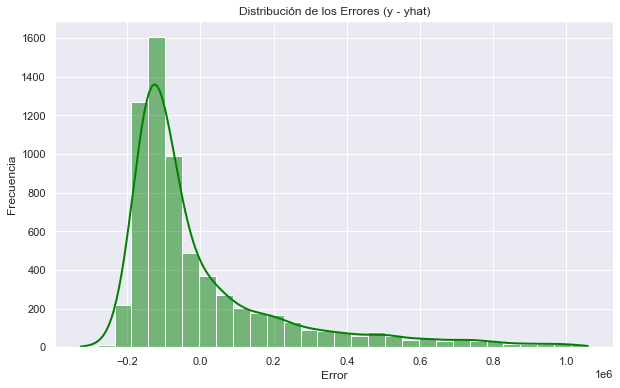

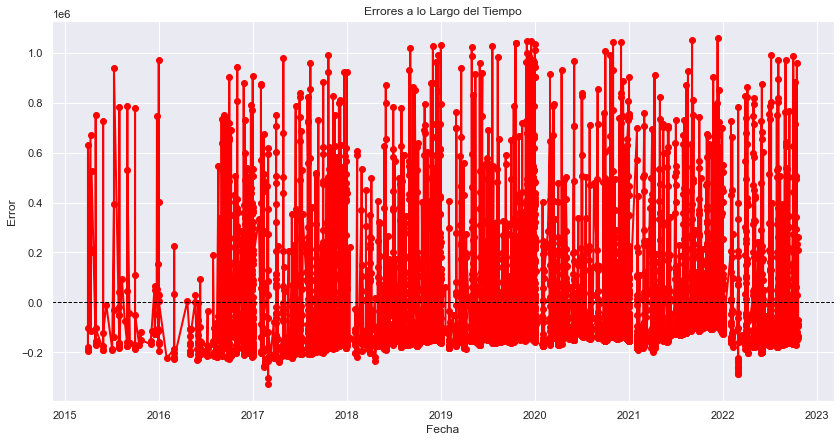

In [761]:
import seaborn as sns
import numpy as np

# Calcular el error
forecast_aligned['error'] = forecast_aligned['y'] - forecast_aligned['yhat']

# Distribución de los errores
plt.figure(figsize=(10, 6))
sns.histplot(forecast_aligned['error'], kde=True, bins=30, color='green')
plt.title('Distribución de los Errores (y - yhat)')
plt.xlabel('Error')
plt.ylabel('Frecuencia')
plt.show()

# Gráfico de errores a lo largo del tiempo
plt.figure(figsize=(14, 7))
plt.plot(forecast_aligned.index, forecast_aligned['error'], marker='o', linestyle='-', color='red')
plt.axhline(0, color='black', linewidth=1, linestyle='--')
plt.title('Errores a lo Largo del Tiempo')
plt.xlabel('Fecha')
plt.ylabel('Error')
plt.show()


In [760]:
# Verificar la cobertura
coverage = ((forecast_aligned['y'] >= forecast_aligned['yhat_lower']) & (forecast_aligned['y'] <= forecast_aligned['yhat_upper'])).mean()
print(f'Coverage: {coverage:.2%}')

# Comparar con el intervalo esperado
expected_coverage = 0.95
print(f'Diferencia con el Coverage esperado (95%): {coverage - expected_coverage:.2%}')


Coverage: 93.19%
Diferencia con el Coverage esperado (95%): -1.81%


Conclusion
Adequate Coverage: A coverage of 93.19% is fairly close to the expected 95%, suggesting that the model is performing well in terms of the accuracy of its prediction intervals, although it is slightly underestimating the variability in the data.

Possible Improvement: If it is crucial to achieve 95% coverage, you might consider adjusting the model to increase the uncertainty in the predictions, perhaps by tweaking parameters like interval_width or changepoint_prior_scale to make the prediction intervals a bit wider.

In summary, this result indicates that your model is performing quite solidly, but with some room for improvement to fully capture the variability in the actual data.



# DOLAR BUDGET FORECAST MODEL

In [762]:
df_pagos_dolares = pd.read_csv("pagos_moneda_filtro_campos.csv", engine="python", sep=',', quotechar='"', error_bad_lines=False)

In [763]:
#Eliminan las filas de esos registros
indexNames = df_pagos_dolares[df_pagos_dolares['pag_confirmar'].isnull()].index
# Delete these row indexes from dataFrame

df_pagos_dolares.drop(indexNames,inplace=True)

In [764]:
#Eliminan las filas de esos registros de los no confirmados.
indexNames = df_pagos_dolares[df_pagos_dolares['pag_confirmar']==0].index
# Delete these row indexes from dataFrame
df_pagos_dolares.drop(indexNames,inplace=True)

In [765]:
#Eliminan las filas de esos registros
indexNames = df_pagos_dolares[df_pagos_dolares['mon_pk']==1 & 3].index
# Delete these row indexes from dataFrame
df_pagos_dolares.drop(indexNames,inplace=True)

In [766]:
df_pagos_dolares.sample(5)

,pag_pk,pag_fecha_planificada,pag_importe_planificado,pag_fecha_real,pag_importe_real,pag_confirmar,mon_pk,mon_nombre
16289,10135,2018-11-29 00:00:00,500.0,2018-11-29 00:00:00,500.0,1.0,2,Dlares
15635,7412,2017-05-31 00:00:00,1464.0,2017-05-31 00:00:00,0.0,1.0,2,Dlares
16697,11808,2018-03-30 00:00:00,2550.0,2018-03-30 00:00:00,2000.0,1.0,2,Dlares
15036,5540,2017-05-19 00:00:00,4033.0,2017-07-03 00:00:00,2288.0,1.0,2,Dlares
15422,7115,2017-11-06 00:00:00,1250.0,2017-11-05 00:00:00,0.0,1.0,2,Dlares


In [767]:
df_pagos_dolares=df_pagos_dolares.drop(['pag_pk','pag_fecha_planificada','pag_importe_planificado','pag_confirmar','mon_pk','mon_nombre'],axis=1)
df_pagos_dolares.shape

(5244, 2)

In [768]:
df_pagos_dolares.sample(5)

,pag_fecha_real,pag_importe_real
17491,2019-11-15 00:00:00,4265.0
15096,2017-09-04 00:00:00,0.0
13311,2014-03-11 00:00:00,732.0
13428,2014-09-30 00:00:00,1088.0
14542,2017-11-08 00:00:00,2772.0


In [769]:
df_pagos_dolares.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5244 entries, 13186 to 20226
Data columns (total 2 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   pag_fecha_real    5244 non-null   object 
 1   pag_importe_real  5244 non-null   float64
dtypes: float64(1), object(1)
memory usage: 122.9+ KB


In [770]:
df_pagos_dolares['pag_importe_real'].max()

1150000.0

In [771]:
df_pagos_dolares['pag_importe_real'].min()

-976.0

In [772]:
df_pagos_dolares['pag_importe_real'].mean()

9407.202526697178

In [773]:
#Eliminan las filas de esos registros por debaje del 1% del valor medior dado que se suprimen 8% de registros es despeciable.
indexNames = df_pagos_dolares[df_pagos_dolares['pag_importe_real']==0].index
# Delete these row indexes from dataFrame

df_pagos_dolares.drop(indexNames,inplace=True)

In [774]:
#Eliminan las filas de esos registros por debaje del 1% del valor medior dado que se suprimen 8% de registros es despeciable.
indexNames = df_pagos_dolares[df_pagos_dolares['pag_importe_real']>500000].index
# Delete these row indexes from dataFrame

df_pagos_dolares.drop(indexNames,inplace=True)

In [775]:
df_pagos_dolares.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4432 entries, 13186 to 20226
Data columns (total 2 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   pag_fecha_real    4432 non-null   object 
 1   pag_importe_real  4432 non-null   float64
dtypes: float64(1), object(1)
memory usage: 103.9+ KB


In [776]:
#Cambio de los tipo objetos a tipo fecha 

df_pagos_dolares['pag_fecha_real'] = pd.to_datetime(df_pagos_dolares['pag_fecha_real'])

df_pagos_dolares.head()

,pag_fecha_real,pag_importe_real
13186,2014-04-28,5246.40
13187,2014-05-27,15739.20
13188,2014-09-15,20985.60
13189,2014-10-14,10492.80
13190,2015-02-28,1722.64


In [777]:
df_pagos_dolares.sort_values(['pag_fecha_real', 'pag_importe_real'],ascending=False) 
df_pagos_dolares

,pag_fecha_real,pag_importe_real
13186,2014-04-28,5246.40
13187,2014-05-27,15739.20
13188,2014-09-15,20985.60
13189,2014-10-14,10492.80
13190,2015-02-28,1722.64
...,...,...
20116,2022-07-20,9207.00
20117,2022-08-26,9385.00
20221,2022-09-08,120.00
20223,2020-03-17,800.00


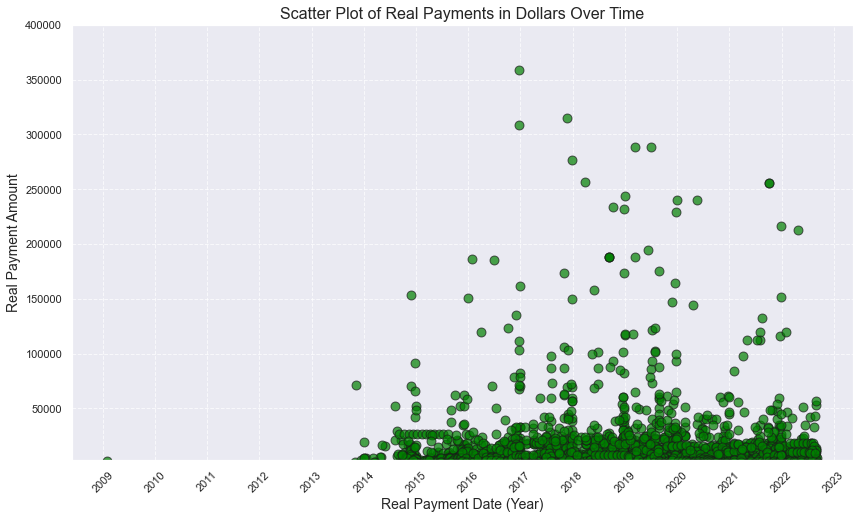

In [778]:

import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import pandas as pd  # Ensure pandas is imported

# Assuming df_pagos_dolares is your DataFrame with the data

# Create a figure and axis with a larger size
fig, ax = plt.subplots(figsize=(14, 8))

# Scatter plot with improved aesthetics
ax.scatter(x=df_pagos_dolares['pag_fecha_real'], y=df_pagos_dolares['pag_importe_real'], 
           color='green', alpha=0.7, edgecolor='k', s=80)

# Set y-axis limit
plt.ylim(3031.0, 400000.0)

# Format the date on the x-axis to show years only
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
ax.xaxis.set_major_locator(mdates.YearLocator())

# Rotate the date labels for better readability
plt.xticks(rotation=45)

# Add labels and title
ax.set_xlabel('Real Payment Date (Year)', fontsize=14)
ax.set_ylabel('Real Payment Amount', fontsize=14)
ax.set_title('Scatter Plot of Real Payments in Dollars Over Time', fontsize=16)

# Add a grid
ax.grid(True, linestyle='--', alpha=0.7)

# Save the improved plot as a PNG with better quality
plt.savefig('diagrama-dispersion-dolares-mejorado.png', dpi=300, bbox_inches='tight')

# Show the plot
plt.show()


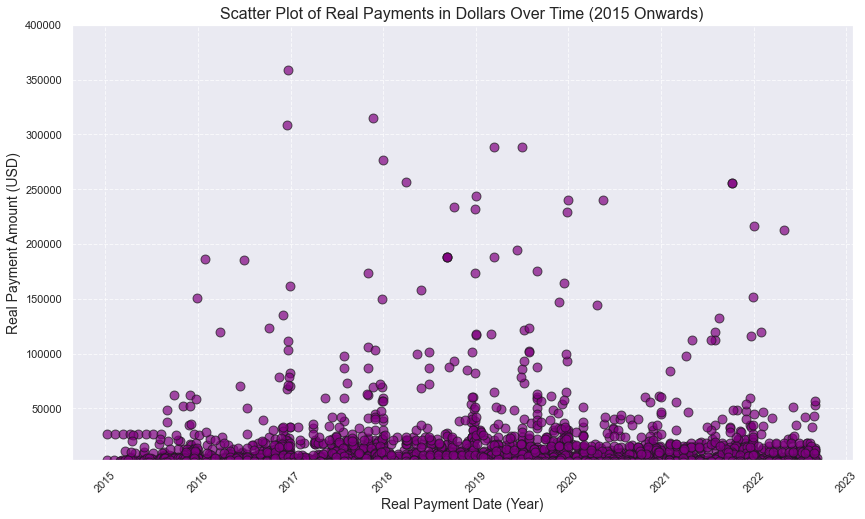

In [779]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

# Rename columns for easier plotting
sp = df_pagos_dolares.rename(columns={'pag_fecha_real': 'ds', 'pag_importe_real': 'y'})

# Filter data for years greater than 2014
sp_sample1 = sp[sp['ds'].dt.year > 2014]

# Create the figure and axes with a larger size
fig, ax = plt.subplots(figsize=(14, 8))

# Draw scatter plot with improved aesthetics
ax.scatter(x=sp_sample1['ds'], y=sp_sample1['y'], color='purple', alpha=0.7, edgecolor='k', s=80)

# Set y-axis limit
plt.ylim(3031.0, 400000.0)

# Format the date on the x-axis to show years only
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
ax.xaxis.set_major_locator(mdates.YearLocator())

# Rotate the date labels for better readability
plt.xticks(rotation=45)

# Add labels and title
ax.set_xlabel('Real Payment Date (Year)', fontsize=14)
ax.set_ylabel('Real Payment Amount (USD)', fontsize=14)
ax.set_title('Scatter Plot of Real Payments in Dollars Over Time (2015 Onwards)', fontsize=16)

# Add a grid
ax.grid(True, linestyle='--', alpha=0.7)

# Save the improved plot as a PNG with better quality
plt.savefig('diagrama-dispersion-dolares-2015-onwards.png', dpi=300, bbox_inches='tight')

# Show the plot
plt.show()


In [780]:
model11 = Prophet(interval_width=0.95)
model11.add_country_holidays(country_name='UY')
model11.fit(sp_sample1)

18:16:29 - cmdstanpy - INFO - Chain [1] start processing
18:16:30 - cmdstanpy - INFO - Chain [1] done processing


In [781]:
future = model11.make_future_dataframe(periods=30, freq="B")
forecast = model11.predict(future)

forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
1119,2022-10-14,10598.276383,-37933.320236,63194.446365
1120,2022-10-17,13062.124821,-38958.845870,60056.537687
1121,2022-10-18,12089.167706,-39400.349458,61621.374917
1122,2022-10-19,10529.724484,-40040.051532,60347.410813
1123,2022-10-20,8473.125030,-41129.447295,60978.687811


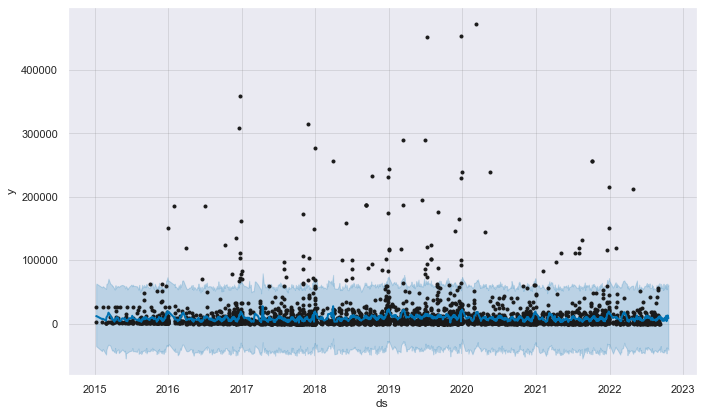

In [782]:
fig = model11.plot(forecast)

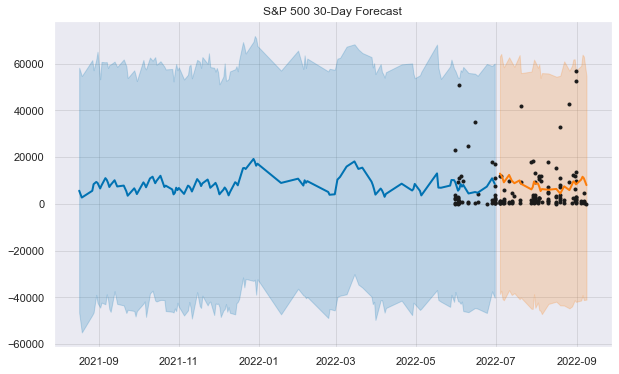

In [783]:
def custom_forecast_plot():
    forecast_length = 30

    prior_df = sp[(sp.ds.dt.year>2014)]
    forecast_df = sp[(sp.ds.dt.year==2021) & (sp.ds.dt.month==1)]
    all_df = pd.concat([prior_df, forecast_df]).sort_values('ds')
    all_df.head()

    all_df_sample = all_df[-forecast_length*5:]
    forecast_sample = forecast[forecast['ds'].isin(all_df["ds"].values)].sort_values('ds')

    prior_vis_df = forecast_sample[-forecast_length*5:-forecast_length]
    forecast_vis_df = forecast_sample[-forecast_length:]

    fig = plt.figure(figsize=(10,6))
    ax = fig.add_subplot(111)

    ax.plot(all_df_sample['ds'].dt.to_pydatetime(), all_df_sample["y"], '.k')

    ax.plot(prior_vis_df['ds'].dt.to_pydatetime(), prior_vis_df['yhat'], ls='-', c='#0072B2')
    ax.fill_between(prior_vis_df['ds'].dt.to_pydatetime(), prior_vis_df['yhat_lower'], prior_vis_df['yhat_upper'], color='#0072B2', alpha=0.2)

    ax.plot(forecast_vis_df['ds'].dt.to_pydatetime(), forecast_vis_df['yhat'], ls='-', c='#fc7d0b')
    ax.fill_between(forecast_vis_df['ds'].dt.to_pydatetime(), forecast_vis_df['yhat_lower'], forecast_vis_df['yhat_upper'], color='#fc7d0b', alpha=0.2)
    ax.grid(True, which='major', c='gray', ls='-', lw=1, alpha=0.2)

    ax.set_title('S&P 500 30-Day Forecast')
    plt.show(sns)
    
custom_forecast_plot()

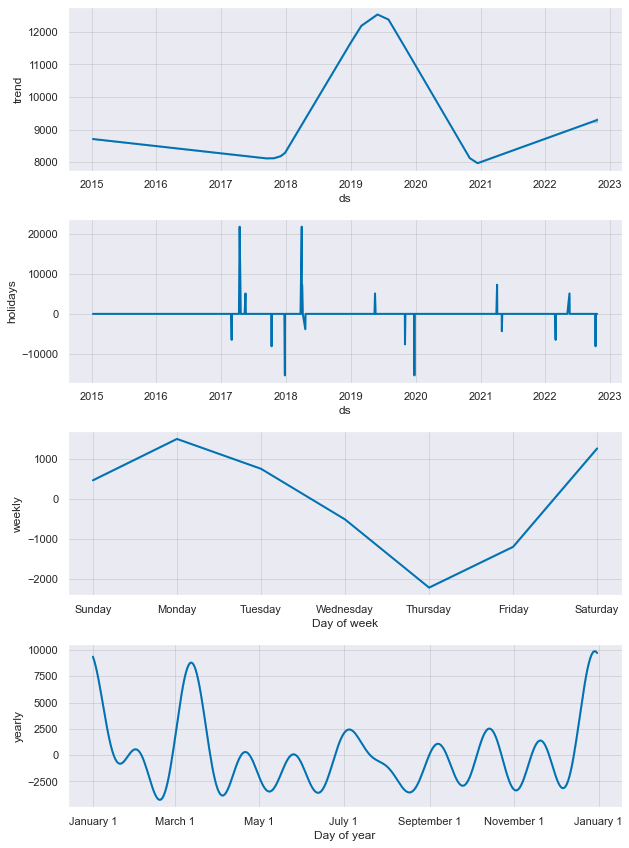

In [784]:
fig = model11.plot_components(forecast)

In [785]:
# Ajuste del Grid Search basado en la gráfica
param_grid = {
    'changepoint_prior_scale': [0.01, 0.1, 0.3, 0.5, 0.7],  # Agregar valores intermedios para mayor sensibilidad a los cambios en la tendencia
    'seasonality_prior_scale': [0.01, 0.1, 1, 5, 10],  # Mantener una variedad de opciones para capturar la estacionalidad
    'weekly_seasonality': [True]  # Basado en la gráfica, mantener la estacionalidad semanal activada
}

# Crear una lista de todas las combinaciones posibles de hiperparámetros
all_params = [dict(zip(param_grid.keys(), v)) for v in itertools.product(*param_grid.values())]

# DataFrame para almacenar los resultados
results = []

# Realizar la búsqueda manualmente
for params in all_params:
    # Construir y entrenar el modelo con los parámetros actuales
    model = Prophet(
        interval_width=0.95,  # Intervalo de confianza para las predicciones, en este caso es del 95%.
        
        changepoint_prior_scale=params['changepoint_prior_scale'],  
        # Controla la flexibilidad del modelo para ajustar cambios en la tendencia (changepoints).
        # Un valor más bajo hará que el modelo sea menos sensible a los cambios, mientras que un valor más alto 
        # permitirá más flexibilidad en la detección de cambios repentinos en la tendencia.
        
        seasonality_prior_scale=params['seasonality_prior_scale'],  
        # Controla la flexibilidad del componente estacional del modelo.
        # Valores más bajos harán que la estacionalidad sea más rígida (menos flexible), capturando solo 
        # patrones estacionales muy consistentes. Valores más altos permiten al modelo ajustarse más a 
        # fluctuaciones estacionales.
        
        weekly_seasonality=params['weekly_seasonality']  
        # Determina si se debe incluir o no la estacionalidad semanal.
        # En este caso, lo mantendremos siempre activado (True).
    )
    
    model.add_seasonality(name='yearly', period=365, fourier_order=10)
    # Incrementar el fourier_order a 10 para capturar más detalles en la estacionalidad anual basada en la gráfica.
    
    model.add_country_holidays(country_name='UY')
    # Añade los días festivos nacionales de Uruguay como un componente del modelo.
    # Esto permite que el modelo capture el impacto de los días festivos en la serie temporal, lo cual es 
    # particularmente útil si los días festivos afectan significativamente los datos (por ejemplo, ventas, 
    # tráfico, etc.).
    
    # Entrenar el modelo
    model.fit(sp_sample1)
    
    # Predecir en los datos futuros
    forecast = model.predict(future)
    
    # Calcular el MAE entre las predicciones y los valores reales
    forecast_aligned = forecast.set_index('ds').join(sp_sample.set_index('ds')[['y']], how='inner')
    mae = mean_absolute_error(forecast_aligned['y'], forecast_aligned['yhat'])
    
    # Guardar los resultados
    results.append({'params': params, 'mae': mae})

# Convertir los resultados en un DataFrame para fácil acceso
results_df = pd.DataFrame(results)

# Encontrar la combinación de parámetros con el menor MAE
best_params = results_df.loc[results_df['mae'].idxmin()]

print(f"Mejores Parámetros: {best_params['params']}")
print(f"Mejor MAE: {best_params['mae']:.2f}")


18:19:45 - cmdstanpy - INFO - Chain [1] start processing
18:19:45 - cmdstanpy - INFO - Chain [1] done processing
18:19:47 - cmdstanpy - INFO - Chain [1] start processing
18:19:47 - cmdstanpy - INFO - Chain [1] done processing
18:19:49 - cmdstanpy - INFO - Chain [1] start processing
18:19:50 - cmdstanpy - INFO - Chain [1] done processing
18:19:51 - cmdstanpy - INFO - Chain [1] start processing
18:19:52 - cmdstanpy - INFO - Chain [1] done processing
18:19:53 - cmdstanpy - INFO - Chain [1] start processing
18:19:54 - cmdstanpy - INFO - Chain [1] done processing
18:19:58 - cmdstanpy - INFO - Chain [1] start processing
18:19:59 - cmdstanpy - INFO - Chain [1] done processing
18:20:01 - cmdstanpy - INFO - Chain [1] start processing
18:20:02 - cmdstanpy - INFO - Chain [1] done processing
18:20:04 - cmdstanpy - INFO - Chain [1] start processing
18:20:05 - cmdstanpy - INFO - Chain [1] done processing
18:20:07 - cmdstanpy - INFO - Chain [1] start processing
18:20:09 - cmdstanpy - INFO - Chain [1]

Mejores Parámetros: {'changepoint_prior_scale': 0.7, 'seasonality_prior_scale': 0.1, 'weekly_seasonality': True}
Mejor MAE: 159901.89


18:22:00 - cmdstanpy - INFO - Chain [1] start processing
18:22:02 - cmdstanpy - INFO - Chain [1] done processing


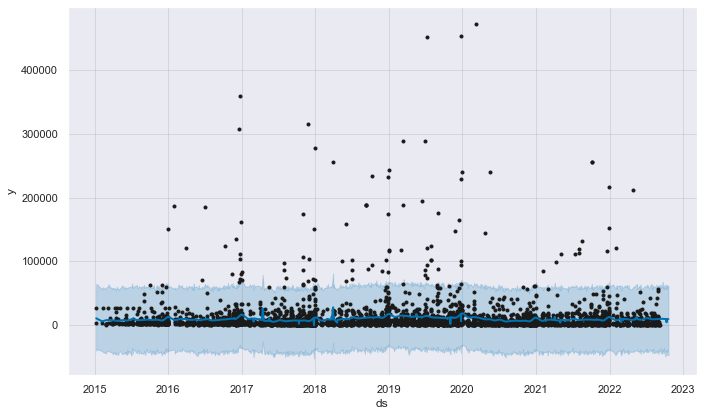

In [786]:
final_model_dolares = Prophet(interval_width=0.95, weekly_seasonality=False,seasonality_prior_scale=0.001,changepoint_prior_scale=0.9)
final_model_dolares .add_seasonality(name='yearly', period=365, fourier_order=8)
final_model_dolares .add_country_holidays(country_name='UY')
forecast = final_model_dolares.fit(sp_sample1).predict(future)
fig = final_model_dolares .plot(forecast)

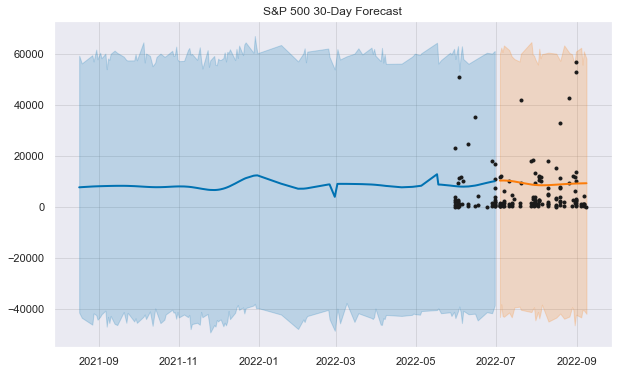

In [787]:
custom_forecast_plot()

In [788]:
# Save the model
filename ='modelsdolaressav'
pickle.dump(final_model_pesos, open(filename, 'wb'))

In [789]:
# Save the model
filename ='modelsdolares.sav'
pickle.dump(final_model_dolares, open(filename, 'wb'))

                  y          yhat
ds                               
2015-01-08   2440.0  10143.538423
2015-01-09  26784.0   9982.211839
2015-02-06   2440.0   5468.304216
2015-02-10  26784.0   5727.082210
2015-02-26   1840.0   7184.270349
MAE: 10343.34


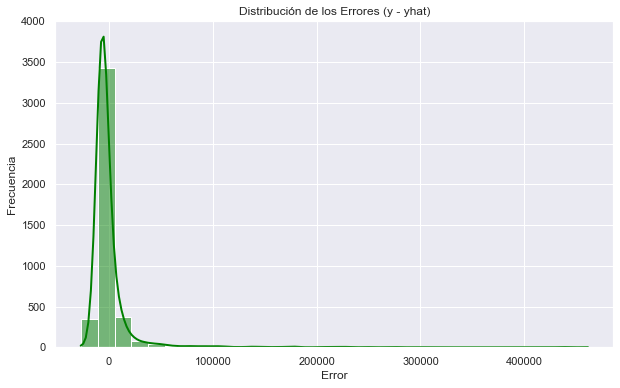

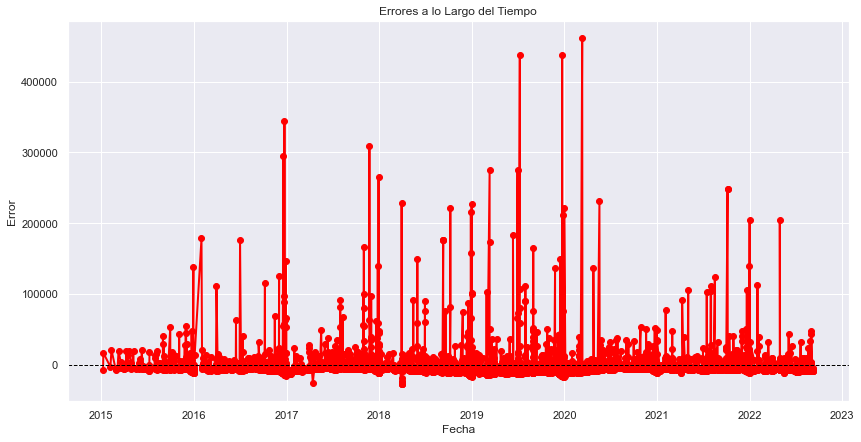

Coverage: 97.66%
Diferencia con el Coverage esperado (95%): 2.66%


In [790]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_error, mean_squared_error
import numpy as np
import seaborn as sns

# Supongamos que ya has generado 'forecast' y 'sp_sample' como en tu código anterior

# Alinear los DataFrames por las fechas 'ds' (fecha)
forecast_aligned = forecast.set_index('ds').join(sp_sample1.set_index('ds'), how='inner', lsuffix='_pred', rsuffix='_real')

# Verificar las primeras filas para asegurarse de que la alineación es correcta
print(forecast_aligned[['y', 'yhat']].head())

# Eliminar posibles valores nulos después de la alineación
forecast_aligned = forecast_aligned.dropna(subset=['y', 'yhat'])

# Calcular el MAE
mae = mean_absolute_error(forecast_aligned['y'], forecast_aligned['yhat'])
print(f'MAE: {mae:.2f}')


# Visualización de los errores
forecast_aligned['error'] = forecast_aligned['y'] - forecast_aligned['yhat']

# Distribución de los errores
plt.figure(figsize=(10, 6))
sns.histplot(forecast_aligned['error'], kde=True, bins=30, color='green')
plt.title('Distribución de los Errores (y - yhat)')
plt.xlabel('Error')
plt.ylabel('Frecuencia')
plt.show()

# Gráfico de errores a lo largo del tiempo
plt.figure(figsize=(14, 7))
plt.plot(forecast_aligned.index, forecast_aligned['error'], marker='o', linestyle='-', color='red')
plt.axhline(0, color='black', linewidth=1, linestyle='--')
plt.title('Errores a lo Largo del Tiempo')
plt.xlabel('Fecha')
plt.ylabel('Error')
plt.show()

# Verificar la cobertura de los intervalos de confianza
coverage = ((forecast_aligned['y'] >= forecast_aligned['yhat_lower']) & (forecast_aligned['y'] <= forecast_aligned['yhat_upper'])).mean()
print(f'Coverage: {coverage:.2%}')
print(f'Diferencia con el Coverage esperado (95%): {coverage - 0.95:.2%}')



The MAE (Mean Absolute Error) obtained is 10343. This means that, on average, the model predictions differ from the actual values ​​by approximately 10343 units (on the scale of the variable y). Around 4200 dollars approx, for a global budget estimate the deviation is acceptable.

Overall, a coverage of 97.66% indicates that the model is slightly overestimating the uncertainty in its predictions, resulting in wider intervals that capture more of the actual data. While this is not necessarily a bad thing, especially if avoiding underestimation is critical, there may be room to fine-tune the model for more precise prediction intervals if needed.

# Deep Learning

# Resume 
In this section, I will apply neural networks, such as RNN, LSTM, and GRU, among others, to generate tools to predict the budget in pesos and dollars. Then, compare it with the prophet model created by Facebook. 

## 2.2 Advanced Neural Network

### 2.2.1 Simple RNN: Test MAE : 0.0043

*Decision Making:* The decision to utilize a Simple RNN for sequence analysis is driven by its inherent capability to capture temporal dependencies within sequential data. The model's ability to leverage past information for making future predictions aligns well with the requirements of the task, which involves time series analysis. Despite its relatively higher MAE compared to other advanced models, the Simple RNN serves as a baseline for evaluating more complex architectures and highlights the trade-offs between model complexity and performance.

### 2.2.2 LSTM: Test MAE : 0.00439

*Decision Making:* The decision to employ LSTM networks stems from their proven effectiveness in capturing long-term dependencies in sequential data, making them suitable for time series analysis tasks. The model's ability to retain and utilize contextual information over extended periods aligns well with the requirements of the task, leading to improved predictive performance compared to simpler architectures. The selection of LSTM highlights the emphasis on leveraging advanced architectures tailored to the specific characteristics of sequential data.

### 2.2.3 GRU: Test MAE : 0.00514


*Decision Making:* The decision to utilize GRU networks is based on their advantageous properties, including the ability to capture long-range dependencies effectively, computational efficiency, and regularization capabilities. The model's performance, although slightly higher than LSTM, demonstrates its effectiveness in capturing temporal dependencies within sequential data. The choice of GRU highlights the consideration of both performance and computational efficiency in selecting suitable architectures for sequential data analysis.

### 2.2.4 LSTM Dropout: Test MAE: 0.00497

*Decision Making:* The decision to apply dropout regularization within LSTM networks is driven by its effectiveness in mitigating overfitting and improving generalization performance. By introducing noise during training and preventing the network from becoming overly reliant on specific neurons, dropout regularization enhances the robustness and reliability of the model. Despite a slightly higher MAE compared to other architectures, the regularization benefits offered by dropout contribute to improved performance on unseen data, highlighting its importance in enhancing the overall effectiveness of LSTM networks.

### 2.2.5 Stacked GRU: Test MAE: 0.00446

*Decision Making:* The decision to use a stacked GRU architecture is based on its ability to capture hierarchical features and complex patterns within sequential data more effectively than single-layer models. By leveraging multiple GRU layers, the model can extract high-level representations of the input data, leading to improved predictive performance. The regularization benefits offered by stacked architectures further enhance the model's generalization capabilities, making it a suitable choice for sequence modeling tasks.

### 2.2.6 Bidirectional: Best MAE : 0.00431


*Decision Making:* The decision to employ a bidirectional recurrent neural network (Bi-RNN) is motivated by its ability to capture dependencies from past and future contexts simultaneously, leading to improved performance in sequence modeling tasks. The bidirectional processing allows the model to better understand the temporal dynamics and long-range dependencies present in sequential data, resulting in more accurate predictions. Despite a slightly higher MAE compared to other architectures, the bidirectional nature of the model contributes to its effectiveness in accurately modeling and predicting sequential data, making it a suitable choice for the task at hand.



## 3.2 Problems
Problems that I have to manage when I am training the models:

* Time-consuming Training: Training certain RNN architectures, especially those with intricate designs or numerous parameters, can be time-intensive. This becomes particularly burdensome when dealing with large datasets or when conducting numerous experiments to enhance model performance.

* Hyperparameter Tuning Iterations: Discovering the optimal hyperparameters for each RNN architecture requires iterative tuning. This process entails exploring various combinations of hyperparameters, adjusting them, and experimenting with different configurations to achieve optimal results. Such iterations demand significant time and computational resources.

* Overfitting Concerns: Overfitting is prevalent in machine learning, including RNNs, where the model may memorize the training data instead of learning generalizable patterns. Both underfitting, with too few parameters, and overfitting, with too many parameters, are issues to address. Effective management of overfitting ensures the model's ability to generalize well to unseen data and make accurate predictions.

* Experimentation Burden: Experimenting with diverse RNN architectures, hyperparameters, and training strategies is laborious and time-consuming. It necessitates conducting multiple experiments, analyzing outcomes, and refining models based on performance metrics. Effective management of this experimentation process is crucial for resource optimization and informed decision-making.

* Interpreting Model Outputs: Understanding and interpreting RNN model outputs pose challenges, especially with complex architectures or large datasets. Analyzing predictions, identifying patterns, and extracting actionable insights require domain expertise and careful consideration of contextual factors.

To address these challenges effectively, a systematic approach is essential. It includes thorough experimentation, meticulous hyperparameter tuning, efficient resource management, and rigorous evaluation of model performance. 

## 3.3 Decisions
Considering computational efficiency alongside model performance, the Bidirectional architecture that achieved a Test MAE 0.00431 emerges as the most favorable option. 



## 3.4 Analsys results

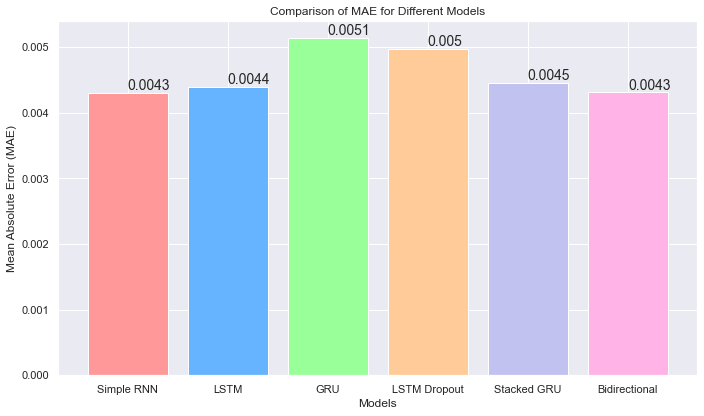

In [1048]:
import matplotlib.pyplot as plt

# Data for models and their MAE values
models = ['Simple RNN', 'LSTM', 'GRU', 'LSTM Dropout', 'Stacked GRU', 'Bidirectional']
mae_values = [0.0043, 0.00439, 0.00514, 0.00497, 0.00446, 0.00431]

# Create bar plot with pastel colors
colors = ['#ff9999', '#66b3ff', '#99ff99', '#ffcc99', '#c2c2f0', '#ffb3e6']

plt.figure(figsize=(10, 6))
bars = plt.bar(models, mae_values, color=colors)

# Add labels and title
plt.xlabel('Models')
plt.ylabel('Mean Absolute Error (MAE)')
plt.title('Comparison of MAE for Different Models')

# Add value labels on top of the bars
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2.0, yval, round(yval, 4), va='bottom') 

# Display the plot
plt.tight_layout()
plt.show()





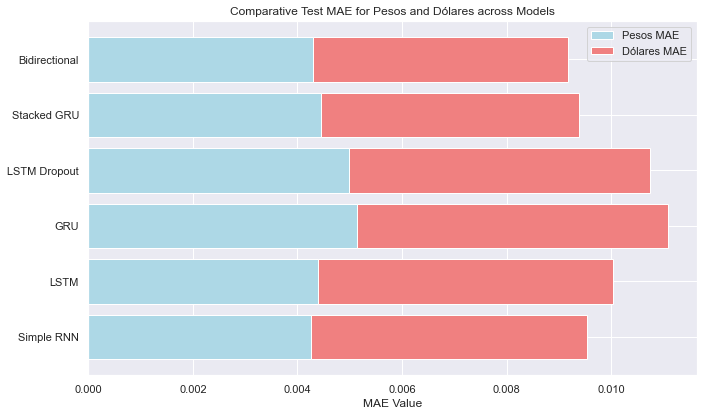

In [1049]:
import matplotlib.pyplot as plt

# Test MAE values for each model in Pesos and Dólares
models = ['Simple RNN', 'LSTM', 'GRU', 'LSTM Dropout', 'Stacked GRU', 'Bidirectional']
pesos_mae = [0.004266, 0.004387, 0.005136, 0.004977, 0.004459, 0.004306]
dolares_mae = [0.005266, 0.005647, 0.005953, 0.005763, 0.004930, 0.004871]

# Plotting the MAE for each model
plt.figure(figsize=(10, 6))

plt.barh(models, pesos_mae, color='lightblue', label='Pesos MAE')
plt.barh(models, dolares_mae, color='lightcoral', left=pesos_mae, label='Dólares MAE')

# Adding labels and title
plt.xlabel('MAE Value')
plt.title('Comparative Test MAE for Pesos and Dólares across Models')
plt.legend()

# Display the plot
plt.tight_layout()
plt.show()


Based on the Mean Absolute Error (MAE) values, the Bidirectional model stands out with the lowest MAE, indicating the best performance among the models compared. Both the Simple RNN and LSTM models also perform well, showing relatively low MAE values. Meanwhile, the GRU model has the highest MAE, suggesting it is the least effective in this context. Overall, the Bidirectional model delivers the most favorable results, with the Simple RNN and LSTM models following closely behind.



# Execution_Details

EDA

In [1016]:
df_pagos_DP.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 23659 entries, 106 to 30121
Data columns (total 8 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   pag_pk                   23659 non-null  float64       
 1   pag_fecha_planificada    23659 non-null  datetime64[ns]
 2   pag_importe_planificado  23659 non-null  float64       
 3   pag_fecha_real           23659 non-null  datetime64[ns]
 4   pag_importe_real         23659 non-null  float64       
 5   pag_confirmar            23659 non-null  float64       
 6   mon_pk                   23659 non-null  int64         
 7   mon_nombre               23659 non-null  object        
dtypes: datetime64[ns](2), float64(4), int64(1), object(1)
memory usage: 1.6+ MB


In [1017]:
import pandas as pd

# Suponiendo que df_pagos_DP ya está cargado y listo para usar
# Filtrar los registros para crear dos DataFrames separados para Pesos y Dólares
df_pesos = df_pagos_DP[df_pagos_DP['mon_pk'] == 1]
df_dolares = df_pagos_DP[df_pagos_DP['mon_pk'] == 2]

# Verificar las dimensiones de los nuevos DataFrames
print("Número de entradas en df_pesos:", df_pesos.shape[0])
print("Número de entradas en df_dolares:", df_dolares.shape[0])

# Opcionalmente, mostrar información de los DataFrames para asegurarse de que todo está correcto
df_pesos.info()
df_dolares.info()


Número de entradas en df_pesos: 15337
Número de entradas en df_dolares: 7999
<class 'pandas.core.frame.DataFrame'>
Int64Index: 15337 entries, 106 to 18749
Data columns (total 8 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   pag_pk                   15337 non-null  float64       
 1   pag_fecha_planificada    15337 non-null  datetime64[ns]
 2   pag_importe_planificado  15337 non-null  float64       
 3   pag_fecha_real           15337 non-null  datetime64[ns]
 4   pag_importe_real         15337 non-null  float64       
 5   pag_confirmar            15337 non-null  float64       
 6   mon_pk                   15337 non-null  int64         
 7   mon_nombre               15337 non-null  object        
dtypes: datetime64[ns](2), float64(4), int64(1), object(1)
memory usage: 1.1+ MB
<class 'pandas.core.frame.DataFrame'>
Int64Index: 7999 entries, 18940 to 29547
Data columns (total 8 columns):
 #   Column

In [1018]:
df_pesos.sample(5)

,pag_pk,pag_fecha_planificada,pag_importe_planificado,pag_fecha_real,pag_importe_real,pag_confirmar,mon_pk,mon_nombre
4461,11716.0,2018-12-28,55993.0,2018-12-28,0.0,1.0,1,Pesos
7616,16930.0,2019-12-13,34751.0,2019-10-11,0.0,1.0,1,Pesos
1211,3052.0,2016-09-09,20000.0,2016-09-09,0.0,1.0,1,Pesos
11357,27890.0,2021-12-31,4443.0,2022-10-05,1199.0,1.0,1,Pesos
12640,39115.0,2023-12-17,30456.0,2023-12-15,4552.0,1.0,1,Pesos


In [1013]:
df_dolares.sample(5)

,pag_pk,pag_fecha_planificada,pag_importe_planificado,pag_fecha_real,pag_importe_real,pag_confirmar,mon_pk,mon_nombre
19700,1883.0,2015-10-09,5018.5,2015-11-27,5018.0,1.0,2,Dlares
27592,38537.0,2023-05-31,8000.0,2023-05-31,0.0,1.0,2,Dlares
26097,46457.0,2023-12-29,0.0,2024-05-27,732.0,1.0,2,Dlares
26104,32791.0,2022-08-15,10000.0,2023-12-06,5984.0,1.0,2,Dlares
22749,13766.0,2019-04-29,1762.0,2019-06-12,1762.0,1.0,2,Dlares


In [1014]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler

# Suponiendo que df_pesos y df_dolares ya están definidos correctamente como antes

# Función para crear secuencias para la RNN
def create_sequences(data, n_steps):
    X, y = [], []
    for i in range(n_steps, len(data)):
        X.append(data[i-n_steps:i])  # secuencia de entradas
        y.append(data[i])  # valor a predecir
    return np.array(X), np.array(y)

# Número de pasos en la secuencia (por ejemplo, 30 días)
n_steps = 30

# Crear secuencias para cada conjunto de datos
X_pesos, y_pesos = create_sequences(df_pesos['pag_importe_real'].values, n_steps)
X_dolares, y_dolares = create_sequences(df_dolares['pag_importe_real'].values, n_steps)

# Inicializar el escalador MinMax
scaler = MinMaxScaler()

# Normalización y preparación de los datos para "Pesos"
if X_pesos.size > 0:
    X_pesos = scaler.fit_transform(X_pesos.reshape(-1, X_pesos.shape[-1])).reshape(X_pesos.shape)
    split_index_pesos = int(0.8 * len(X_pesos))
    X_train_pesos, y_train_pesos = X_pesos[:split_index_pesos], y_pesos[:split_index_pesos]
    X_test_pesos, y_test_pesos = X_pesos[split_index_pesos:], y_pesos[split_index_pesos:]
else:
    print("No hay suficientes datos para 'Pesos' para crear secuencias.")

# Normalización y preparación de los datos para "Dólares"
if X_dolares.size > 0:
    # Asegurar que se utilice el mismo scaler para ambos conjuntos de datos o reajustar según sea necesario
    X_dolares = scaler.transform(X_dolares.reshape(-1, X_dolares.shape[-1])).reshape(X_dolares.shape)
    split_index_dolares = int(0.8 * len(X_dolares))
    X_train_dolares, y_train_dolares = X_dolares[:split_index_dolares], y_dolares[:split_index_dolares]
    X_test_dolares, y_test_dolares = X_dolares[split_index_dolares:], y_dolares[split_index_dolares:]
else:
    print("No hay suficientes datos para 'Dólares' para crear secuencias.")

# Este código está listo para ser usado en entrenamiento de modelos o evaluaciones adicionales


### 2.2.1 Simple RNN

#### Pesos_All data set

In [1015]:
import os
import numpy as np
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.layers import Dense
import matplotlib.pyplot as plt
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.layers import SimpleRNN, Dense
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
import numpy as np

# Función para construir el modelo de Keras
def build_model(sequence_length, num_features):
    model = Sequential([
        SimpleRNN(units=128, input_shape=(sequence_length, num_features), activation='relu'),
        Dense(units=1)
    ])
    model.compile(optimizer='adam', loss='mean_squared_error', metrics=['mae'])
    return model

# Suponiendo que las variables X_train_pesos, y_train_pesos, X_test_pesos, y_test_pesos ya están definidas
# Configuración del modelo
sequence_length = 30  # Asumiendo secuencia de 30 pasos de tiempo
num_features = 1      # Suponiendo 1 característica por paso

# Crear el modelo
model = build_model(sequence_length, num_features)

# Definir el Early Stopping
early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=10,
    restore_best_weights=True
)

# Definir el ModelCheckpoint
model_checkpoint = ModelCheckpoint(
    'model_dense_best.keras',
    save_best_only=True,
    monitor='val_loss'
)

# Entrenamiento del modelo con Early Stopping y Model Checkpoint
history = model.fit(
    X_train_pesos, y_train_pesos,
    epochs=200,
    batch_size=256,
    validation_data=(X_test_pesos, y_test_pesos),
    callbacks=[early_stopping, model_checkpoint]
)

# Cargar el mejor modelo guardado durante el entrenamiento
best_model = load_model("model_dense_best.keras")

# Evaluar el mejor modelo
test_mae = best_model.evaluate(X_test_pesos, y_test_pesos)[1]
print(f"Test MAE: {test_mae}")

Epoch 1/200
48/48 [==============================] - 12s 203ms/step - loss: 1161423224832.0000 - mae: 299036.1250 - val_loss: 601178112000.0000 - val_mae: 253780.1562
Epoch 2/200
48/48 [==============================] - 9s 184ms/step - loss: 1158243942400.0000 - mae: 282127.2812 - val_loss: 564422770688.0000 - val_mae: 447199.5625
Epoch 3/200
48/48 [==============================] - 10s 198ms/step - loss: 1090913894400.0000 - mae: 364420.5000 - val_loss: 536748654592.0000 - val_mae: 313265.5000
Epoch 4/200
48/48 [==============================] - 9s 180ms/step - loss: 1087262883840.0000 - mae: 368127.9688 - val_loss: 535097638912.0000 - val_mae: 333643.7188
Epoch 5/200
48/48 [==============================] - 9s 186ms/step - loss: 1087455887360.0000 - mae: 372739.2500 - val_loss: 536638586880.0000 - val_mae: 361683.9375
Epoch 6/200
48/48 [==============================] - 10s 204ms/step - loss: 1090066448384.0000 - mae: 359383.5312 - val_loss: 537879379968.0000 - val_mae: 302693.1250
E

#### Pesos_Data set real and planining date and amount

In [1019]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.layers import SimpleRNN, Dense
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
import tensorflow as tf

# Convertir fechas a números y normalizar todas las características numéricas
df_pesos['pag_fecha_planificada'] = pd.to_datetime(df_pesos['pag_fecha_planificada']).astype(np.int64)
df_pesos['pag_fecha_real'] = pd.to_datetime(df_pesos['pag_fecha_real']).astype(np.int64)

scaler = MinMaxScaler()
features = ['pag_fecha_planificada', 'pag_importe_planificado', 'pag_fecha_real', 'pag_importe_real']
df_pesos[features] = scaler.fit_transform(df_pesos[features])

# Función para crear secuencias de datos
def create_sequences(data, sequence_length):
    X, y = [], []
    for i in range(len(data) - sequence_length):
        X.append(data[i:(i + sequence_length), :-1])  # Todas las características excepto 'pag_importe_real'
        y.append(data[i + sequence_length, -1])  # 'pag_importe_real' como objetivo
    return np.array(X), np.array(y)

# Preparar datos para la RNN
sequence_length = 30
data = df_pesos[features].values
X, y = create_sequences(data, sequence_length)

# Dividir los datos en entrenamiento y prueba
train_size = int(len(X) * 0.8)
X_train, X_test = X[:train_size], X[train_size:]
y_train, y_test = y[:train_size], y[train_size:]

# Construir el modelo RNN
def build_model(input_shape):
    model = Sequential([
        SimpleRNN(128, input_shape=input_shape, activation='relu'),
        Dense(1)
    ])
    model.compile(optimizer='adam', loss='mean_squared_error', metrics=['mae'])
    return model

input_shape = (X_train.shape[1], X_train.shape[2])  # Secuencias de longitud 30, 3 características
model = build_model(input_shape)

# Configurar callbacks para el entrenamiento
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
model_checkpoint = ModelCheckpoint('model_rnn_best.h5', save_best_only=True, monitor='val_loss')

# Entrenar el modelo
history = model.fit(
    X_train, y_train,
    epochs=100,
    batch_size=32,
    validation_data=(X_test, y_test),
    callbacks=[early_stopping, model_checkpoint]
)

# Cargar el mejor modelo y evaluar
best_model = load_model("model_rnn_best.h5")
test_loss, test_mae = best_model.evaluate(X_test, y_test)
print(f"Test Loss: {test_loss}, Test MAE: {test_mae}")


C:\Users\perez\AppData\Local\Temp\ipykernel_181656\578079450.py:10: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\perez\AppData\Local\Temp\ipykernel_181656\578079450.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\perez\AppData\Local\Temp\ipykernel_181656\578079450.py:15: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pa

Epoch 1/100
383/383 [==============================] - 12s 27ms/step - loss: 6.0495e-04 - mae: 0.0102 - val_loss: 1.3951e-04 - val_mae: 0.0062
Epoch 2/100
383/383 [==============================] - 10s 27ms/step - loss: 3.6901e-04 - mae: 0.0075 - val_loss: 1.5223e-04 - val_mae: 0.0061
Epoch 3/100
383/383 [==============================] - 10s 26ms/step - loss: 3.6102e-04 - mae: 0.0074 - val_loss: 1.3485e-04 - val_mae: 0.0046
Epoch 4/100
383/383 [==============================] - 10s 26ms/step - loss: 3.6733e-04 - mae: 0.0076 - val_loss: 1.3355e-04 - val_mae: 0.0044
Epoch 5/100
383/383 [==============================] - 10s 25ms/step - loss: 3.6351e-04 - mae: 0.0077 - val_loss: 2.1012e-04 - val_mae: 0.0099
Epoch 6/100
383/383 [==============================] - 10s 27ms/step - loss: 3.5408e-04 - mae: 0.0069 - val_loss: 1.6126e-04 - val_mae: 0.0082
Epoch 7/100
383/383 [==============================] - 10s 26ms/step - loss: 3.5828e-04 - mae: 0.0073 - val_loss: 1.3801e-04 - val_mae: 0.0052

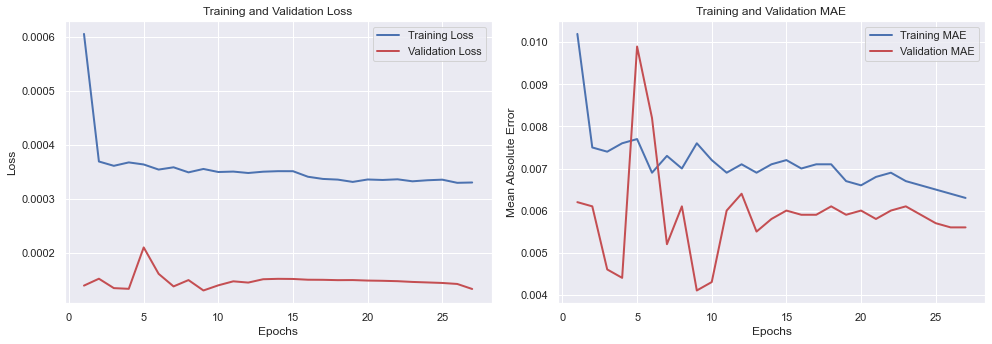

In [1020]:
import matplotlib.pyplot as plt

# Datos del entrenamiento y validación
epochs = list(range(1, 28))  # 27 epochs
train_loss = [6.0495e-04, 3.6901e-04, 3.6102e-04, 3.6733e-04, 3.6351e-04, 3.5408e-04, 3.5828e-04,
              3.4892e-04, 3.5522e-04, 3.4957e-04, 3.5036e-04, 3.4775e-04, 3.5015e-04, 3.5112e-04,
              3.5106e-04, 3.4081e-04, 3.3678e-04, 3.3552e-04, 3.3126e-04, 3.3574e-04, 3.3485e-04,
              3.3607e-04, 3.3238e-04, 3.3432e-04, 3.3542e-04, 3.2958e-04, 3.3019e-04]
val_loss = [1.3951e-04, 1.5223e-04, 1.3485e-04, 1.3355e-04, 2.1012e-04, 1.6126e-04, 1.3801e-04,
            1.4972e-04, 1.3050e-04, 1.4004e-04, 1.4742e-04, 1.4509e-04, 1.5129e-04, 1.5203e-04,
            1.5178e-04, 1.5038e-04, 1.5022e-04, 1.4959e-04, 1.4975e-04, 1.4882e-04, 1.4839e-04,
            1.4768e-04, 1.4629e-04, 1.4535e-04, 1.4439e-04, 1.4255e-04, 1.3326e-04]
train_mae = [0.0102, 0.0075, 0.0074, 0.0076, 0.0077, 0.0069, 0.0073, 0.0070, 0.0076, 0.0072,
             0.0069, 0.0071, 0.0069, 0.0071, 0.0072, 0.0070, 0.0071, 0.0071, 0.0067, 0.0066,
             0.0068, 0.0069, 0.0067, 0.0066, 0.0065, 0.0064, 0.0063]
val_mae = [0.0062, 0.0061, 0.0046, 0.0044, 0.0099, 0.0082, 0.0052, 0.0061, 0.0041, 0.0043,
           0.0060, 0.0064, 0.0055, 0.0058, 0.0060, 0.0059, 0.0059, 0.0061, 0.0059, 0.0060,
           0.0058, 0.0060, 0.0061, 0.0059, 0.0057, 0.0056, 0.0056]

# Crear gráficos para Loss
plt.figure(figsize=(14, 5))
plt.subplot(1, 2, 1)
plt.plot(epochs, train_loss, 'b-', label='Training Loss')
plt.plot(epochs, val_loss, 'r-', label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

# Crear gráficos para MAE
plt.subplot(1, 2, 2)
plt.plot(epochs, train_mae, 'b-', label='Training MAE')
plt.plot(epochs, val_mae, 'r-', label='Validation MAE')
plt.title('Training and Validation MAE')
plt.xlabel('Epochs')
plt.ylabel('Mean Absolute Error')
plt.legend()

plt.tight_layout()
plt.show()


#### Pesos_Real and planing date and amount with regularization

In [1021]:
from tensorflow.keras.layers import Dropout
from tensorflow.keras.regularizers import l1_l2

def build_model(input_shape):
    model = Sequential([
        SimpleRNN(128, input_shape=input_shape, activation='relu',
                  kernel_regularizer=l1_l2(l1=1e-5, l2=1e-4)),  # Regularización L1 y L2 en la capa RNN
        Dropout(0.5),  # Dropout del 50% para reducir el sobreajuste
        Dense(1)
    ])
    model.compile(optimizer='adam', loss='mean_squared_error', metrics=['mae'])
    return model

# Reconstruir y reentrenar el modelo con las regularizaciones
model = build_model((X_train.shape[1], X_train.shape[2]))

early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
model_checkpoint = ModelCheckpoint('model_rnn_regularized.h5', save_best_only=True, monitor='val_loss')

history = model.fit(
    X_train, y_train,
    epochs=100,
    batch_size=32,
    validation_data=(X_test, y_test),
    callbacks=[early_stopping, model_checkpoint]
)

# Cargar el mejor modelo y evaluar
best_model = load_model("model_rnn_regularized.h5")
test_loss, test_mae = best_model.evaluate(X_test, y_test)
print(f"Test Loss: {test_loss}, Test MAE: {test_mae}")


Epoch 1/100
383/383 [==============================] - 12s 27ms/step - loss: 0.0024 - mae: 0.0234 - val_loss: 7.3204e-04 - val_mae: 0.0062
Epoch 2/100
383/383 [==============================] - 10s 25ms/step - loss: 9.6707e-04 - mae: 0.0100 - val_loss: 6.4716e-04 - val_mae: 0.0053
Epoch 3/100
383/383 [==============================] - 10s 25ms/step - loss: 8.4252e-04 - mae: 0.0076 - val_loss: 6.0533e-04 - val_mae: 0.0081
Epoch 4/100
383/383 [==============================] - 10s 25ms/step - loss: 7.3448e-04 - mae: 0.0073 - val_loss: 4.9180e-04 - val_mae: 0.0050
Epoch 5/100
383/383 [==============================] - 9s 24ms/step - loss: 6.5490e-04 - mae: 0.0071 - val_loss: 3.9697e-04 - val_mae: 0.0047
Epoch 6/100
383/383 [==============================] - 9s 24ms/step - loss: 5.9175e-04 - mae: 0.0071 - val_loss: 3.6299e-04 - val_mae: 0.0075
Epoch 7/100
383/383 [==============================] - 10s 25ms/step - loss: 5.6718e-04 - mae: 0.0072 - val_loss: 2.8702e-04 - val_mae: 0.0063
Epoch

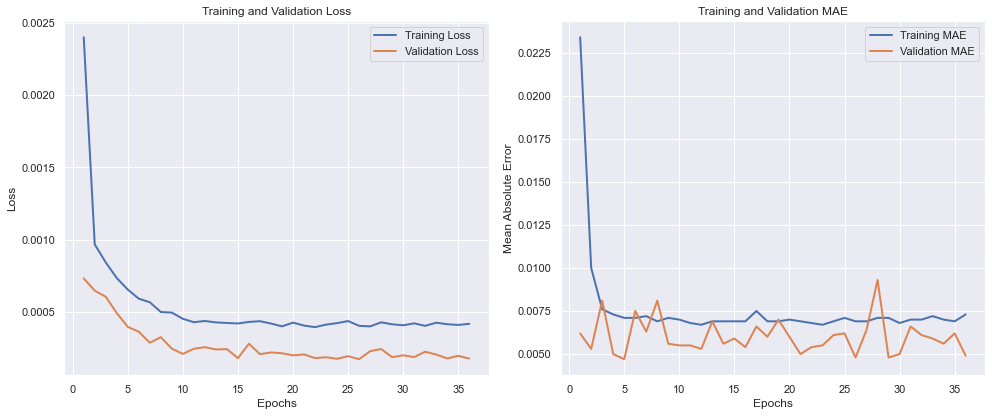

In [1022]:
# Datos de pérdida y MAE para cada época
epochs = range(1, 37)
train_loss = [
    0.0024, 9.6707e-04, 8.4252e-04, 7.3448e-04, 6.5490e-04, 5.9175e-04, 
    5.6718e-04, 4.9978e-04, 4.9542e-04, 4.5266e-04, 4.2924e-04, 4.3753e-04, 
    4.2782e-04, 4.2399e-04, 4.2042e-04, 4.3106e-04, 4.3620e-04, 4.2000e-04, 
    4.0042e-04, 4.2617e-04, 4.0593e-04, 3.9495e-04, 4.1258e-04, 4.2286e-04, 
    4.3708e-04, 4.0431e-04, 4.0017e-04, 4.2833e-04, 4.1473e-04, 4.0794e-04, 
    4.2111e-04, 4.0383e-04, 4.2569e-04, 4.1529e-04, 4.1026e-04, 4.1792e-04
]
val_loss = [
    7.3204e-04, 6.4716e-04, 6.0533e-04, 4.9180e-04, 3.9697e-04, 3.6299e-04, 
    2.8702e-04, 3.2586e-04, 2.4613e-04, 2.0981e-04, 2.4526e-04, 2.5649e-04, 
    2.4066e-04, 2.4310e-04, 1.8049e-04, 2.8054e-04, 2.0813e-04, 2.2006e-04, 
    2.1468e-04, 1.9983e-04, 2.0635e-04, 1.8092e-04, 1.8694e-04, 1.7596e-04, 
    1.9449e-04, 1.7333e-04, 2.2858e-04, 2.4379e-04, 1.8706e-04, 2.0040e-04, 
    1.8802e-04, 2.2515e-04, 2.0555e-04, 1.7855e-04, 1.9643e-04, 1.7784e-04
]
train_mae = [
    0.0234, 0.0100, 0.0076, 0.0073, 0.0071, 0.0071, 0.0072, 0.0069, 0.0071, 0.0070, 
    0.0068, 0.0067, 0.0069, 0.0069, 0.0069, 0.0069, 0.0075, 0.0069, 0.0069, 0.0070, 
    0.0069, 0.0068, 0.0067, 0.0069, 0.0071, 0.0069, 0.0069, 0.0071, 0.0071, 0.0068, 
    0.0070, 0.0070, 0.0072, 0.0070, 0.0069, 0.0073
]
val_mae = [
    0.0062, 0.0053, 0.0081, 0.0050, 0.0047, 0.0075, 0.0063, 0.0081, 0.0056, 0.0055, 
    0.0055, 0.0053, 0.0069, 0.0056, 0.0059, 0.0054, 0.0066, 0.0060, 0.0070, 0.0060, 
    0.0050, 0.0054, 0.0055, 0.0061, 0.0062, 0.0048, 0.0064, 0.0093, 0.0048, 0.0050, 
    0.0066, 0.0061, 0.0059, 0.0056, 0.0062, 0.0049
]

# Graficar la pérdida de entrenamiento y validación
plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
plt.plot(epochs, train_loss, label='Training Loss')
plt.plot(epochs, val_loss, label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(epochs, train_mae, label='Training MAE')
plt.plot(epochs, val_mae, label='Validation MAE')
plt.title('Training and Validation MAE')
plt.xlabel('Epochs')
plt.ylabel('Mean Absolute Error')
plt.legend()

plt.tight_layout()
plt.show()


####  Dollar_all dataset

In [980]:
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.layers import SimpleRNN, Dense
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
import numpy as np

# Función para construir el modelo de Keras
def build_model(sequence_length, num_features):
    model = Sequential([
        SimpleRNN(units=128, input_shape=(sequence_length, num_features), activation='relu'),
        Dense(units=1)
    ])
    model.compile(optimizer='adam', loss='mean_squared_error', metrics=['mae'])
    return model

# Suponiendo que las variables X_train_pesos, y_train_pesos, X_test_pesos, y_test_pesos ya están definidas
# Configuración del modelo
sequence_length = 30  # Asumiendo secuencia de 30 pasos de tiempo
num_features = 1      # Suponiendo 1 característica por paso

# Crear el modelo
model = build_model(sequence_length, num_features)

# Definir el Early Stopping
early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=10,
    restore_best_weights=True
)

# Definir el ModelCheckpoint
model_checkpoint = ModelCheckpoint(
    'model_dense_best.keras',
    save_best_only=True,
    monitor='val_loss'
)

# Entrenamiento del modelo con Early Stopping y Model Checkpoint
history = model.fit(
    X_train_dolares, y_train_dolares,
    epochs=200,
    batch_size=256,
    validation_data=(X_test_dolares, y_test_dolares),
    callbacks=[early_stopping, model_checkpoint]
)

# Cargar el mejor modelo guardado durante el entrenamiento
best_model = load_model("model_dense_best.keras")

# Evaluar el mejor modelo
test_mae = best_model.evaluate(X_test_dolares, y_test_dolares)[1]
print(f"Test MAE: {test_mae}")

Epoch 1/200
25/25 [==============================] - 7s 222ms/step - loss: 3023831552.0000 - mae: 9565.9307 - val_loss: 5120908288.0000 - val_mae: 15823.4492
Epoch 2/200
25/25 [==============================] - 5s 200ms/step - loss: 3011184896.0000 - mae: 10845.7910 - val_loss: 5222176256.0000 - val_mae: 10352.4219
Epoch 3/200
25/25 [==============================] - 5s 207ms/step - loss: 3021128448.0000 - mae: 9295.2256 - val_loss: 5208195584.0000 - val_mae: 10262.9434
Epoch 4/200
25/25 [==============================] - 5s 199ms/step - loss: 2973144064.0000 - mae: 10887.6006 - val_loss: 5141690368.0000 - val_mae: 11982.2783
Epoch 5/200
25/25 [==============================] - 5s 216ms/step - loss: 2964023296.0000 - mae: 11318.2119 - val_loss: 5185585664.0000 - val_mae: 10469.4014
Epoch 6/200
25/25 [==============================] - 5s 214ms/step - loss: 2951664896.0000 - mae: 11561.8086 - val_loss: 5124985344.0000 - val_mae: 13300.4697
Epoch 7/200
25/25 [=============================

#### Dollar_Real and planning with date and amount

In [1023]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.layers import SimpleRNN, Dense, Dropout
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.regularizers import l1_l2
import tensorflow as tf

# Convertir fechas a números y normalizar todas las características numéricas para dólares
df_dolares['pag_fecha_planificada'] = pd.to_datetime(df_dolares['pag_fecha_planificada']).astype(np.int64)
df_dolares['pag_fecha_real'] = pd.to_datetime(df_dolares['pag_fecha_real']).astype(np.int64)

# Normalizar las características
scaler = MinMaxScaler()
features = ['pag_fecha_planificada', 'pag_importe_planificado', 'pag_fecha_real', 'pag_importe_real']
df_dolares[features] = scaler.fit_transform(df_dolares[features])

# Función para crear secuencias de datos
def create_sequences(data, sequence_length):
    X, y = [], []
    for i in range(len(data) - sequence_length):
        X.append(data[i:(i + sequence_length), :-1])  # Todas las características excepto 'pag_importe_real'
        y.append(data[i + sequence_length, -1])  # 'pag_importe_real' como objetivo
    return np.array(X), np.array(y)

# Preparar datos para la RNN
sequence_length = 30
data = df_dolares[features].values
X, y = create_sequences(data, sequence_length)

# Dividir los datos en entrenamiento y prueba
train_size = int(len(X) * 0.8)
X_train, X_test = X[:train_size], X[train_size:]
y_train, y_test = y[:train_size], y[train_size:]

# Construir el modelo RNN con regularizaciones
def build_model(input_shape):
    model = Sequential([
        SimpleRNN(128, input_shape=input_shape, activation='relu',
                  kernel_regularizer=l1_l2(l1=1e-5, l2=1e-4)),  # Regularización L1 y L2 en la capa RNN
        Dropout(0.5),  # Dropout del 50% para reducir el sobreajuste
        Dense(1)
    ])
    model.compile(optimizer='adam', loss='mean_squared_error', metrics=['mae'])
    return model

# Construir y entrenar el modelo con las regularizaciones
model = build_model((X_train.shape[1], X_train.shape[2]))

early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
model_checkpoint = ModelCheckpoint('model_rnn_regularized_dolares.h5', save_best_only=True, monitor='val_loss')

history = model.fit(
    X_train, y_train,
    epochs=100,
    batch_size=32,
    validation_data=(X_test, y_test),
    callbacks=[early_stopping, model_checkpoint]
)

# Cargar el mejor modelo y evaluar
best_model = load_model("model_rnn_regularized_dolares.h5")
test_loss, test_mae = best_model.evaluate(X_test, y_test)
print(f"Test Loss: {test_loss}, Test MAE: {test_mae}")

# Hacer predicciones
predictions = best_model.predict(X_test)
print(f"Predicciones: {predictions}")


C:\Users\perez\AppData\Local\Temp\ipykernel_181656\283372739.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\perez\AppData\Local\Temp\ipykernel_181656\283372739.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\perez\AppData\Local\Temp\ipykernel_181656\283372739.py:17: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pa

Epoch 1/100
200/200 [==============================] - 7s 29ms/step - loss: 0.0079 - mae: 0.0470 - val_loss: 0.0015 - val_mae: 0.0050
Epoch 2/100
200/200 [==============================] - 5s 27ms/step - loss: 0.0012 - mae: 0.0088 - val_loss: 0.0014 - val_mae: 0.0050
Epoch 3/100
200/200 [==============================] - 5s 27ms/step - loss: 0.0011 - mae: 0.0060 - val_loss: 0.0014 - val_mae: 0.0044
Epoch 4/100
200/200 [==============================] - 6s 28ms/step - loss: 0.0010 - mae: 0.0053 - val_loss: 0.0013 - val_mae: 0.0054
Epoch 5/100
200/200 [==============================] - 5s 27ms/step - loss: 9.7706e-04 - mae: 0.0054 - val_loss: 0.0013 - val_mae: 0.0044
Epoch 6/100
200/200 [==============================] - 6s 28ms/step - loss: 9.4033e-04 - mae: 0.0052 - val_loss: 0.0013 - val_mae: 0.0044
Epoch 7/100
200/200 [==============================] - 6s 28ms/step - loss: 9.0700e-04 - mae: 0.0051 - val_loss: 0.0012 - val_mae: 0.0042
Epoch 8/100
200/200 [=============================

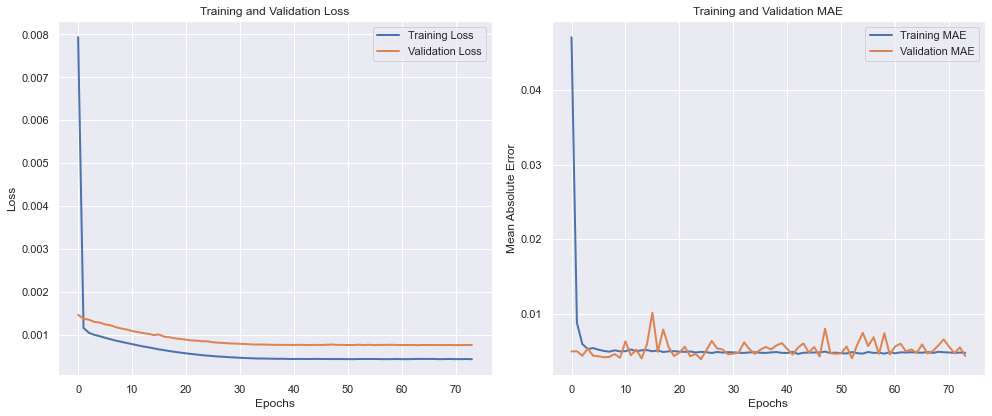

In [1024]:
import matplotlib.pyplot as plt

# Graficar la pérdida (loss) de entrenamiento y validación
plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

# Graficar el MAE de entrenamiento y validación
plt.subplot(1, 2, 2)
plt.plot(history.history['mae'], label='Training MAE')
plt.plot(history.history['val_mae'], label='Validation MAE')
plt.title('Training and Validation MAE')
plt.xlabel('Epochs')
plt.ylabel('Mean Absolute Error')
plt.legend()

plt.tight_layout()
plt.show()


### 2.2.2 LSTM

#### Pesos_all dataset

In [981]:
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.layers import LSTM, Dense
from tensorflow.keras.callbacks import EarlyStopping

def build_model(sequence_length, num_features):
    model = Sequential([
        LSTM(50, return_sequences=True, input_shape=(sequence_length, num_features)),
        LSTM(50, return_sequences=False),
        Dense(25, activation='relu'),
        Dense(1)
    ])
    model.compile(optimizer='adam', loss='mean_squared_error', metrics=['mae'])
    return model

# Configuración del modelo
sequence_length = 30  # Asumiendo secuencia de 30 pasos de tiempo
num_features = 1      # Suponiendo 1 característica por paso

# Crear el modelo
model = build_model(sequence_length, num_features)

# Definir Early Stopping
early_stopping = EarlyStopping(
    monitor='val_loss',     # Monitorear la pérdida de validación
    patience=10,            # Número de épocas sin mejora después de las cuales se detendrá el entrenamiento
    restore_best_weights=True  # Restaurar los mejores pesos al final del entrenamiento
)

# Suposición de las variables de entrenamiento y prueba
# X_train_pesos, y_train_pesos, X_test_pesos, y_test_pesos deben estar definidos aquí
# Asegúrate de que estas variables están correctamente preparadas y dimensionadas antes de correr este script

# Entrenamiento del modelo
history = model.fit(
    X_train_pesos, y_train_pesos, 
    epochs=200, 
    batch_size=256, 
    validation_data=(X_test_pesos, y_test_pesos),
    callbacks=[early_stopping]  # Añadir el callback de Early Stopping
)

# Guardar el modelo
model.save("model_dense_LSTM.keras")

# Cargar el modelo para evaluación
loaded_model = load_model("model_dense_LSTM.keras")

# Evaluar el modelo
test_mae = loaded_model.evaluate(X_test_pesos, y_test_pesos)[1]
print(f"Test MAE: {test_mae}")





Epoch 1/200
48/48 [==============================] - 23s 361ms/step - loss: 1164791775232.0000 - mae: 281878.0625 - val_loss: 602116259840.0000 - val_mae: 254998.3281
Epoch 2/200
48/48 [==============================] - 15s 320ms/step - loss: 1164784959488.0000 - mae: 281870.0625 - val_loss: 602109902848.0000 - val_mae: 254989.4844
Epoch 3/200
48/48 [==============================] - 15s 319ms/step - loss: 1164776964096.0000 - mae: 281860.3750 - val_loss: 602101317632.0000 - val_mae: 254977.2969
Epoch 4/200
48/48 [==============================] - 16s 343ms/step - loss: 1164765954048.0000 - mae: 281846.8125 - val_loss: 602089652224.0000 - val_mae: 254960.9062
Epoch 5/200
48/48 [==============================] - 17s 345ms/step - loss: 1164751667200.0000 - mae: 281830.0625 - val_loss: 602075365376.0000 - val_mae: 254941.0469
Epoch 6/200
48/48 [==============================] - 16s 338ms/step - loss: 1164734234624.0000 - mae: 281809.1250 - val_loss: 602058129408.0000 - val_mae: 254916.937

##### Pesos_Real and Planning date and amount

In [1025]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.layers import LSTM, Dense
from tensorflow.keras.callbacks import EarlyStopping

# Convertir fechas a números y normalizar todas las características numéricas para pesos
df_pesos['pag_fecha_planificada'] = pd.to_datetime(df_pesos['pag_fecha_planificada']).astype(np.int64)
df_pesos['pag_fecha_real'] = pd.to_datetime(df_pesos['pag_fecha_real']).astype(np.int64)

# Normalizar las características
scaler = MinMaxScaler()
features = ['pag_fecha_planificada', 'pag_importe_planificado', 'pag_fecha_real', 'pag_importe_real']
df_pesos[features] = scaler.fit_transform(df_pesos[features])

# Función para crear secuencias de datos
def create_sequences(data, sequence_length):
    X, y = [], []
    for i in range(len(data) - sequence_length):
        X.append(data[i:(i + sequence_length), :-1])  # Todas las características excepto 'pag_importe_real'
        y.append(data[i + sequence_length, -1])  # 'pag_importe_real' como objetivo
    return np.array(X), np.array(y)

# Preparar datos para la LSTM
sequence_length = 30
data = df_pesos[features].values
X, y = create_sequences(data, sequence_length)

# Dividir los datos en entrenamiento y prueba
train_size = int(len(X) * 0.8)
X_train, X_test = X[:train_size], X[train_size:]
y_train, y_test = y[:train_size], y[train_size:]

# Definir el modelo LSTM
def build_model(sequence_length, num_features):
    model = Sequential([
        LSTM(50, return_sequences=True, input_shape=(sequence_length, num_features)),
        LSTM(50, return_sequences=False),
        Dense(25, activation='relu'),
        Dense(1)
    ])
    model.compile(optimizer='adam', loss='mean_squared_error', metrics=['mae'])
    return model

# Crear el modelo
model = build_model(sequence_length, X_train.shape[2])

# Definir Early Stopping
early_stopping = EarlyStopping(
    monitor='val_loss',     # Monitorear la pérdida de validación
    patience=10,            # Número de épocas sin mejora después de las cuales se detendrá el entrenamiento
    restore_best_weights=True  # Restaurar los mejores pesos al final del entrenamiento
)

# Entrenamiento del modelo
history = model.fit(
    X_train, y_train, 
    epochs=100, 
    batch_size=256, 
    validation_data=(X_test, y_test),
    callbacks=[early_stopping]  # Añadir el callback de Early Stopping
)

# Guardar el modelo
model.save("model_lstm_pesos.keras")

# Cargar el modelo para evaluación
loaded_model = load_model("model_lstm_pesos.keras")

# Evaluar el modelo
test_loss, test_mae = loaded_model.evaluate(X_test, y_test)
print(f"Test Loss: {test_loss}, Test MAE: {test_mae}")

# Hacer predicciones
predictions = loaded_model.predict(X_test)
print(f"Predicciones: {predictions}")



C:\Users\perez\AppData\Local\Temp\ipykernel_181656\2801613846.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\perez\AppData\Local\Temp\ipykernel_181656\2801613846.py:10: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\perez\AppData\Local\Temp\ipykernel_181656\2801613846.py:15: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/

Epoch 1/100
48/48 [==============================] - 25s 424ms/step - loss: 0.0017 - mae: 0.0241 - val_loss: 2.2673e-04 - val_mae: 0.0065
Epoch 2/100
48/48 [==============================] - 19s 402ms/step - loss: 4.6608e-04 - mae: 0.0077 - val_loss: 2.2093e-04 - val_mae: 0.0061
Epoch 3/100
48/48 [==============================] - 18s 384ms/step - loss: 4.5090e-04 - mae: 0.0073 - val_loss: 2.1868e-04 - val_mae: 0.0077
Epoch 4/100
48/48 [==============================] - 18s 378ms/step - loss: 4.4158e-04 - mae: 0.0071 - val_loss: 2.0817e-04 - val_mae: 0.0063
Epoch 5/100
48/48 [==============================] - 18s 384ms/step - loss: 4.2893e-04 - mae: 0.0069 - val_loss: 2.0490e-04 - val_mae: 0.0063
Epoch 6/100
48/48 [==============================] - 19s 392ms/step - loss: 4.2282e-04 - mae: 0.0069 - val_loss: 2.0497e-04 - val_mae: 0.0052
Epoch 7/100
48/48 [==============================] - 18s 386ms/step - loss: 4.1532e-04 - mae: 0.0067 - val_loss: 2.0162e-04 - val_mae: 0.0051
Epoch 8/10

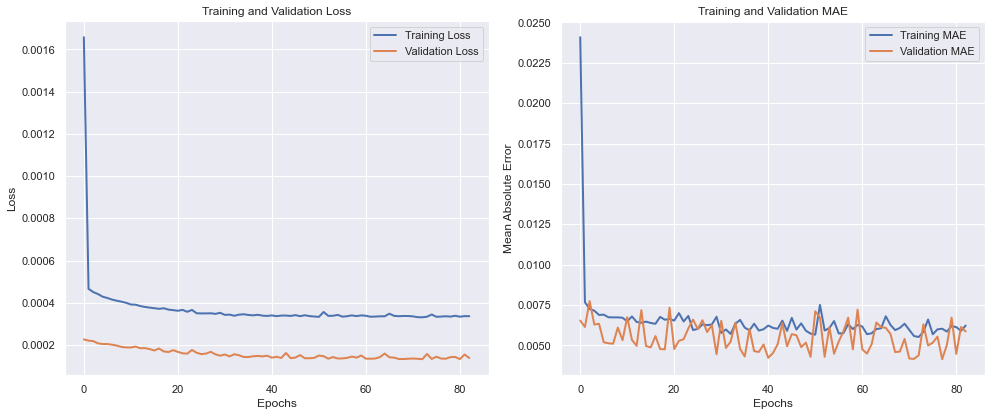

In [1026]:
import matplotlib.pyplot as plt

# Graficar la pérdida (loss) de entrenamiento y validación
plt.figure(figsize=(14, 6))

# Gráfico de Loss (Pérdida)
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

# Gráfico de MAE (Mean Absolute Error)
plt.subplot(1, 2, 2)
plt.plot(history.history['mae'], label='Training MAE')
plt.plot(history.history['val_mae'], label='Validation MAE')
plt.title('Training and Validation MAE')
plt.xlabel('Epochs')
plt.ylabel('Mean Absolute Error')
plt.legend()

plt.tight_layout()
plt.show()


#### Dollar_all dataset

In [983]:
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.layers import LSTM, Dense
from tensorflow.keras.callbacks import EarlyStopping

def build_model(sequence_length, num_features):
    model = Sequential([
        LSTM(50, return_sequences=True, input_shape=(sequence_length, num_features)),
        LSTM(50, return_sequences=False),
        Dense(25, activation='relu'),
        Dense(1)
    ])
    model.compile(optimizer='adam', loss='mean_squared_error', metrics=['mae'])
    return model

# Configuración del modelo
sequence_length = 30  # Asumiendo secuencia de 30 pasos de tiempo
num_features = 1      # Suponiendo 1 característica por paso

# Crear el modelo
model = build_model(sequence_length, num_features)

# Definir Early Stopping
early_stopping = EarlyStopping(
    monitor='val_loss',     # Monitorear la pérdida de validación
    patience=10,            # Número de épocas sin mejora después de las cuales se detendrá el entrenamiento
    restore_best_weights=True  # Restaurar los mejores pesos al final del entrenamiento
)

# Suposición de las variables de entrenamiento y prueba
# X_train_pesos, y_train_pesos, X_test_pesos, y_test_pesos deben estar definidos aquí
# Asegúrate de que estas variables están correctamente preparadas y dimensionadas antes de correr este script

# Entrenamiento del modelo
history = model.fit(
    X_train_dolares, y_train_dolares, 
    epochs=200, 
    batch_size=256, 
    validation_data=(X_test_dolares, y_test_dolares),
    callbacks=[early_stopping]  # Añadir el callback de Early Stopping
)

# Guardar el modelo
model.save("model_dense_LSTM.keras")

# Cargar el modelo para evaluación
loaded_model = load_model("model_dense_LSTM.keras")

# Evaluar el modelo
test_mae = loaded_model.evaluate(X_test_dolares, y_test_dolares)[1]
print(f"Test MAE: {test_mae}")


Epoch 1/200
25/25 [==============================] - 15s 406ms/step - loss: 3031510272.0000 - mae: 9619.3809 - val_loss: 5230255104.0000 - val_mae: 10556.2246
Epoch 2/200
25/25 [==============================] - 9s 361ms/step - loss: 3031402752.0000 - mae: 9615.5703 - val_loss: 5230135808.0000 - val_mae: 10552.7129
Epoch 3/200
25/25 [==============================] - 9s 358ms/step - loss: 3031296768.0000 - mae: 9611.7061 - val_loss: 5230019072.0000 - val_mae: 10549.3223
Epoch 4/200
25/25 [==============================] - 9s 379ms/step - loss: 3031184896.0000 - mae: 9607.6592 - val_loss: 5229883904.0000 - val_mae: 10545.4004
Epoch 5/200
25/25 [==============================] - 9s 348ms/step - loss: 3031056384.0000 - mae: 9602.9824 - val_loss: 5229733888.0000 - val_mae: 10541.0625
Epoch 6/200
25/25 [==============================] - 9s 352ms/step - loss: 3030909440.0000 - mae: 9597.7354 - val_loss: 5229564416.0000 - val_mae: 10536.1504
Epoch 7/200
25/25 [==============================] 

#### Dollar_Real and Planning and date and amount

In [1027]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.layers import LSTM, Dense
from tensorflow.keras.callbacks import EarlyStopping

# Convertir fechas a números y normalizar todas las características numéricas para dólares
df_dolares['pag_fecha_planificada'] = pd.to_datetime(df_dolares['pag_fecha_planificada']).astype(np.int64)
df_dolares['pag_fecha_real'] = pd.to_datetime(df_dolares['pag_fecha_real']).astype(np.int64)

# Normalizar las características
scaler = MinMaxScaler()
features = ['pag_fecha_planificada', 'pag_importe_planificado', 'pag_fecha_real', 'pag_importe_real']
df_dolares[features] = scaler.fit_transform(df_dolares[features])

# Función para crear secuencias de datos
def create_sequences(data, sequence_length):
    X, y = [], []
    for i in range(len(data) - sequence_length):
        X.append(data[i:(i + sequence_length), :-1])  # Todas las características excepto 'pag_importe_real'
        y.append(data[i + sequence_length, -1])  # 'pag_importe_real' como objetivo
    return np.array(X), np.array(y)

# Preparar datos para la LSTM
sequence_length = 30
data = df_dolares[features].values
X, y = create_sequences(data, sequence_length)

# Dividir los datos en entrenamiento y prueba
train_size = int(len(X) * 0.8)
X_train, X_test = X[:train_size], X[train_size:]
y_train, y_test = y[:train_size], y[train_size:]

# Definir el modelo LSTM
def build_model(sequence_length, num_features):
    model = Sequential([
        LSTM(50, return_sequences=True, input_shape=(sequence_length, num_features)),
        LSTM(50, return_sequences=False),
        Dense(25, activation='relu'),
        Dense(1)
    ])
    model.compile(optimizer='adam', loss='mean_squared_error', metrics=['mae'])
    return model

# Crear el modelo
model = build_model(sequence_length, X_train.shape[2])

# Definir Early Stopping
early_stopping = EarlyStopping(
    monitor='val_loss',     # Monitorear la pérdida de validación
    patience=10,            # Número de épocas sin mejora después de las cuales se detendrá el entrenamiento
    restore_best_weights=True  # Restaurar los mejores pesos al final del entrenamiento
)

# Entrenamiento del modelo
history = model.fit(
    X_train, y_train, 
    epochs=100, 
    batch_size=256, 
    validation_data=(X_test, y_test),
    callbacks=[early_stopping]  # Añadir el callback de Early Stopping
)

# Guardar el modelo
model.save("model_lstm_dolares.keras")

# Cargar el modelo para evaluación
loaded_model = load_model("model_lstm_dolares.keras")

# Evaluar el modelo
test_loss, test_mae = loaded_model.evaluate(X_test, y_test)
print(f"Test Loss: {test_loss}, Test MAE: {test_mae}")

# Hacer predicciones
predictions = loaded_model.predict(X_test)
print(f"Predicciones: {predictions}")


C:\Users\perez\AppData\Local\Temp\ipykernel_181656\64351515.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\perez\AppData\Local\Temp\ipykernel_181656\64351515.py:10: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\perez\AppData\Local\Temp\ipykernel_181656\64351515.py:15: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas

Epoch 1/100
25/25 [==============================] - 16s 483ms/step - loss: 4.6395e-04 - mae: 0.0059 - val_loss: 7.7307e-04 - val_mae: 0.0067
Epoch 2/100
25/25 [==============================] - 11s 445ms/step - loss: 4.4174e-04 - mae: 0.0047 - val_loss: 7.7338e-04 - val_mae: 0.0069
Epoch 3/100
25/25 [==============================] - 11s 440ms/step - loss: 4.4380e-04 - mae: 0.0048 - val_loss: 7.7052e-04 - val_mae: 0.0049
Epoch 4/100
25/25 [==============================] - 11s 434ms/step - loss: 4.4502e-04 - mae: 0.0050 - val_loss: 7.9232e-04 - val_mae: 0.0093
Epoch 5/100
25/25 [==============================] - 10s 406ms/step - loss: 4.4546e-04 - mae: 0.0051 - val_loss: 7.6891e-04 - val_mae: 0.0054
Epoch 6/100
25/25 [==============================] - 11s 436ms/step - loss: 4.4255e-04 - mae: 0.0051 - val_loss: 7.7980e-04 - val_mae: 0.0041
Epoch 7/100
25/25 [==============================] - 10s 400ms/step - loss: 4.4189e-04 - mae: 0.0047 - val_loss: 7.6908e-04 - val_mae: 0.0050
Epoch 

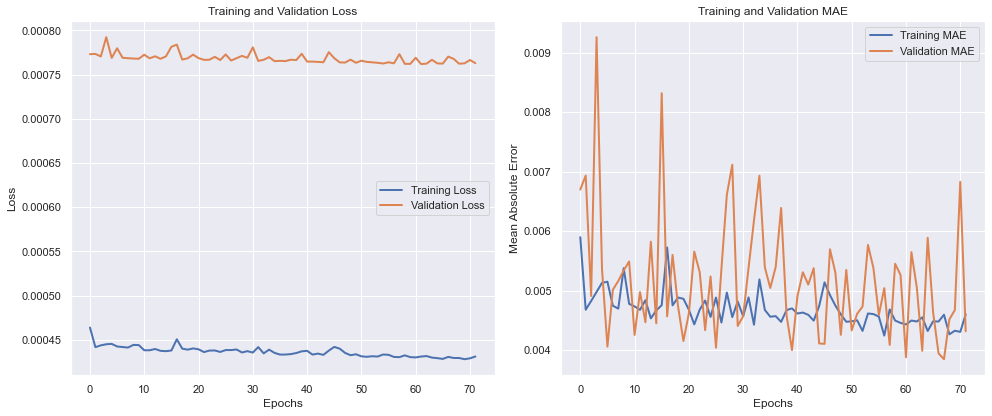

In [1028]:
import matplotlib.pyplot as plt

# Graficar la pérdida (loss) de entrenamiento y validación
plt.figure(figsize=(14, 6))

# Gráfico de Loss (Pérdida)
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

# Gráfico de MAE (Mean Absolute Error)
plt.subplot(1, 2, 2)
plt.plot(history.history['mae'], label='Training MAE')
plt.plot(history.history['val_mae'], label='Validation MAE')
plt.title('Training and Validation MAE')
plt.xlabel('Epochs')
plt.ylabel('Mean Absolute Error')
plt.legend()

plt.tight_layout()
plt.show()


### 2.2.3 GRU

In [971]:
from keras import Sequential
from keras.layers import LSTM, Dense, GRU
from keras.wrappers.scikit_learn import KerasRegressor
from sklearn import metrics
import numpy as np

# Función para construir el modelo de Keras
def build_model(sequence_length, num_features):
    model = Sequential()
    model.add(GRU(units=128, input_shape=(sequence_length, num_features)))
    model.add(Dense(units=1))
    model.compile(optimizer='adam', loss='mean_squared_error', metrics=['mae'])
    return model

# Asumiendo que las variables X_train, y_train, X_test, y_test ya están definidas

# Configuración del modelo
sequence_length = 30  # Asumiendo secuencia de 30 pasos de tiempo
num_features = 1      # Suponiendo 1 característica por paso

# Crear el modelo
model = build_model(sequence_length, num_features)

# Entrenamiento del modelo
model.fit(X_train_pesos, y_train_pesos, epochs=200, batch_size=256, validation_data=(X_test_pesos, y_test_pesos))

# Guardar el modelo
model.save("model_dense_GRU.keras")

# Cargar el modelo para evaluación
loaded_model = load_model("model_dense_GRU.keras")

# Evaluar el modelo
test_mae = loaded_model.evaluate(X_test_pesos, y_test_pesos)[1]

Epoch 1/200
48/48 [==============================] - 6s 97ms/step - loss: 1164788498432.0000 - mae: 281874.4688 - val_loss: 602112131072.0000 - val_mae: 254992.3906
Epoch 2/200
48/48 [==============================] - 5s 97ms/step - loss: 1164781682688.0000 - mae: 281865.9375 - val_loss: 602108461056.0000 - val_mae: 254987.3438
Epoch 3/200
48/48 [==============================] - 5s 106ms/step - loss: 1164777881600.0000 - mae: 281861.4062 - val_loss: 602105053184.0000 - val_mae: 254982.5156
Epoch 4/200
48/48 [==============================] - 6s 120ms/step - loss: 1164773949440.0000 - mae: 281856.9375 - val_loss: 602101710848.0000 - val_mae: 254977.9062
Epoch 5/200
48/48 [==============================] - 4s 91ms/step - loss: 1164770541568.0000 - mae: 281852.6250 - val_loss: 602098499584.0000 - val_mae: 254973.4062
Epoch 6/200
48/48 [==============================] - 5s 97ms/step - loss: 1164767395840.0000 - mae: 281848.4375 - val_loss: 602095353856.0000 - val_mae: 254969.0000
Epoch 7/

#### Pesos_Real and Planning amount and date

In [1029]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.layers import GRU, Dense, Dropout
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.regularizers import l1_l2

# Convertir fechas a números y normalizar todas las características numéricas para pesos
df_pesos['pag_fecha_planificada'] = pd.to_datetime(df_pesos['pag_fecha_planificada']).astype(np.int64)
df_pesos['pag_fecha_real'] = pd.to_datetime(df_pesos['pag_fecha_real']).astype(np.int64)

# Normalizar las características
scaler = MinMaxScaler()
features = ['pag_fecha_planificada', 'pag_importe_planificado', 'pag_fecha_real', 'pag_importe_real']
df_pesos[features] = scaler.fit_transform(df_pesos[features])

# Función para crear secuencias de datos
def create_sequences(data, sequence_length):
    X, y = [], []
    for i in range(len(data) - sequence_length):
        X.append(data[i:(i + sequence_length), :-1])  # Todas las características excepto 'pag_importe_real'
        y.append(data[i + sequence_length, -1])  # 'pag_importe_real' como objetivo
    return np.array(X), np.array(y)

# Preparar datos para la GRU
sequence_length = 30
data = df_pesos[features].values
X, y = create_sequences(data, sequence_length)

# Dividir los datos en entrenamiento y prueba
train_size = int(len(X) * 0.8)
X_train, X_test = X[:train_size], X[train_size:]
y_train, y_test = y[:train_size], y[train_size:]

# Definir el modelo GRU con regularización L1 y L2
def build_model(input_shape):
    model = Sequential([
        GRU(128, input_shape=input_shape, kernel_regularizer=l1_l2(l1=1e-5, l2=1e-4)),  # GRU con regularización
        Dropout(0.5),  # Dropout del 50% para reducir el sobreajuste
        Dense(1)  # Capa de salida con una sola neurona
    ])
    model.compile(optimizer='adam', loss='mean_squared_error', metrics=['mae'])
    return model

# Crear el modelo
model = build_model((X_train.shape[1], X_train.shape[2]))

# Definir callbacks para EarlyStopping y ModelCheckpoint
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
model_checkpoint = ModelCheckpoint('model_gru_regularized_pesos.h5', save_best_only=True, monitor='val_loss')

# Entrenar el modelo
history = model.fit(
    X_train, y_train,
    epochs=100,
    batch_size=32,
    validation_data=(X_test, y_test),
    callbacks=[early_stopping, model_checkpoint]
)

# Guardar el modelo entrenado
model.save("model_gru_pesos.h5")

# Cargar el mejor modelo guardado
best_model = load_model("model_gru_regularized_pesos.h5")

# Evaluar el modelo
test_loss, test_mae = best_model.evaluate(X_test, y_test)
print(f"Test Loss: {test_loss}, Test MAE: {test_mae}")

# Hacer predicciones con el modelo cargado
predictions = best_model.predict(X_test)
print(f"Predicciones: {predictions}")


C:\Users\perez\AppData\Local\Temp\ipykernel_181656\1776673679.py:10: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\perez\AppData\Local\Temp\ipykernel_181656\1776673679.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\perez\AppData\Local\Temp\ipykernel_181656\1776673679.py:16: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org

Epoch 1/100
383/383 [==============================] - 59s 149ms/step - loss: 9.5714e-04 - mae: 0.0138 - val_loss: 2.9047e-04 - val_mae: 0.0061
Epoch 2/100
383/383 [==============================] - 57s 150ms/step - loss: 5.2622e-04 - mae: 0.0097 - val_loss: 2.2516e-04 - val_mae: 0.0047
Epoch 3/100
383/383 [==============================] - 59s 154ms/step - loss: 4.7066e-04 - mae: 0.0088 - val_loss: 2.1495e-04 - val_mae: 0.0054
Epoch 4/100
383/383 [==============================] - 56s 145ms/step - loss: 4.3916e-04 - mae: 0.0084 - val_loss: 2.1335e-04 - val_mae: 0.0059
Epoch 5/100
383/383 [==============================] - 66s 172ms/step - loss: 4.2852e-04 - mae: 0.0080 - val_loss: 2.2779e-04 - val_mae: 0.0078
Epoch 6/100
383/383 [==============================] - 67s 174ms/step - loss: 4.2131e-04 - mae: 0.0078 - val_loss: 1.7813e-04 - val_mae: 0.0048
Epoch 7/100
383/383 [==============================] - 57s 149ms/step - loss: 4.2113e-04 - mae: 0.0081 - val_loss: 1.8975e-04 - val_mae:

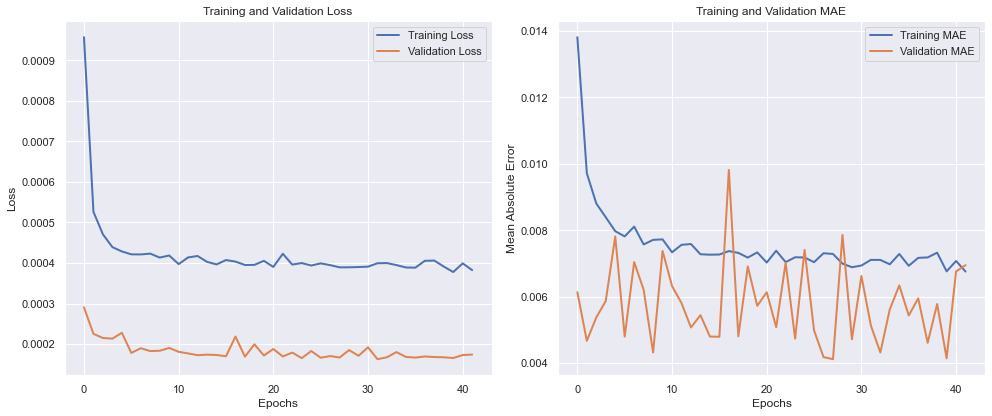

In [1030]:
import matplotlib.pyplot as plt

# Graficar la pérdida (loss) de entrenamiento y validación
plt.figure(figsize=(14, 6))

# Gráfico de Loss (Pérdida)
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

# Gráfico de MAE (Mean Absolute Error)
plt.subplot(1, 2, 2)
plt.plot(history.history['mae'], label='Training MAE')
plt.plot(history.history['val_mae'], label='Validation MAE')
plt.title('Training and Validation MAE')
plt.xlabel('Epochs')
plt.ylabel('Mean Absolute Error')
plt.legend()

plt.tight_layout()
plt.show()


#### Dollar_real_planning_amount-date

In [1031]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.layers import GRU, Dense, Dropout
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.regularizers import l1_l2

# Convertir fechas a números y normalizar todas las características numéricas para dólares
df_dolares['pag_fecha_planificada'] = pd.to_datetime(df_dolares['pag_fecha_planificada']).astype(np.int64)
df_dolares['pag_fecha_real'] = pd.to_datetime(df_dolares['pag_fecha_real']).astype(np.int64)

# Normalizar las características
scaler = MinMaxScaler()
features = ['pag_fecha_planificada', 'pag_importe_planificado', 'pag_fecha_real', 'pag_importe_real']
df_dolares[features] = scaler.fit_transform(df_dolares[features])

# Función para crear secuencias de datos
def create_sequences(data, sequence_length):
    X, y = [], []
    for i in range(len(data) - sequence_length):
        X.append(data[i:(i + sequence_length), :-1])  # Todas las características excepto 'pag_importe_real'
        y.append(data[i + sequence_length, -1])  # 'pag_importe_real' como objetivo
    return np.array(X), np.array(y)

# Preparar datos para la GRU
sequence_length = 30
data = df_dolares[features].values
X, y = create_sequences(data, sequence_length)

# Dividir los datos en entrenamiento y prueba
train_size = int(len(X) * 0.8)
X_train, X_test = X[:train_size], X[train_size:]
y_train, y_test = y[:train_size], y[train_size:]

# Definir el modelo GRU con regularización L1 y L2
def build_model(input_shape):
    model = Sequential([
        GRU(128, input_shape=input_shape, kernel_regularizer=l1_l2(l1=1e-5, l2=1e-4)),  # GRU con regularización
        Dropout(0.5),  # Dropout del 50% para reducir el sobreajuste
        Dense(1)  # Capa de salida con una sola neurona
    ])
    model.compile(optimizer='adam', loss='mean_squared_error', metrics=['mae'])
    return model

# Crear el modelo
model = build_model((X_train.shape[1], X_train.shape[2]))

# Definir callbacks para EarlyStopping y ModelCheckpoint
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
model_checkpoint = ModelCheckpoint('model_gru_regularized_dolares.h5', save_best_only=True, monitor='val_loss')

# Entrenar el modelo
history = model.fit(
    X_train, y_train,
    epochs=100,
    batch_size=32,
    validation_data=(X_test, y_test),
    callbacks=[early_stopping, model_checkpoint]
)

# Guardar el modelo entrenado
model.save("model_gru_dolares.h5")

# Cargar el mejor modelo guardado
best_model = load_model("model_gru_regularized_dolares.h5")

# Evaluar el modelo
test_loss, test_mae = best_model.evaluate(X_test, y_test)
print(f"Test Loss: {test_loss}, Test MAE: {test_mae}")

# Hacer predicciones con el modelo cargado
predictions = best_model.predict(X_test)
print(f"Predicciones: {predictions}")


C:\Users\perez\AppData\Local\Temp\ipykernel_181656\2610133966.py:10: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\perez\AppData\Local\Temp\ipykernel_181656\2610133966.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\perez\AppData\Local\Temp\ipykernel_181656\2610133966.py:16: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org

Epoch 1/100
200/200 [==============================] - 30s 142ms/step - loss: 8.5760e-04 - mae: 0.0076 - val_loss: 8.4212e-04 - val_mae: 0.0051
Epoch 2/100
200/200 [==============================] - 31s 154ms/step - loss: 5.2832e-04 - mae: 0.0066 - val_loss: 8.1181e-04 - val_mae: 0.0041
Epoch 3/100
200/200 [==============================] - 30s 151ms/step - loss: 4.9410e-04 - mae: 0.0062 - val_loss: 7.8952e-04 - val_mae: 0.0051
Epoch 4/100
200/200 [==============================] - 30s 150ms/step - loss: 4.7721e-04 - mae: 0.0061 - val_loss: 7.8817e-04 - val_mae: 0.0039
Epoch 5/100
200/200 [==============================] - 30s 150ms/step - loss: 4.6563e-04 - mae: 0.0058 - val_loss: 7.8715e-04 - val_mae: 0.0039
Epoch 6/100
200/200 [==============================] - 30s 152ms/step - loss: 4.5911e-04 - mae: 0.0056 - val_loss: 7.7545e-04 - val_mae: 0.0050
Epoch 7/100
200/200 [==============================] - 30s 149ms/step - loss: 4.5616e-04 - mae: 0.0055 - val_loss: 7.7742e-04 - val_mae:

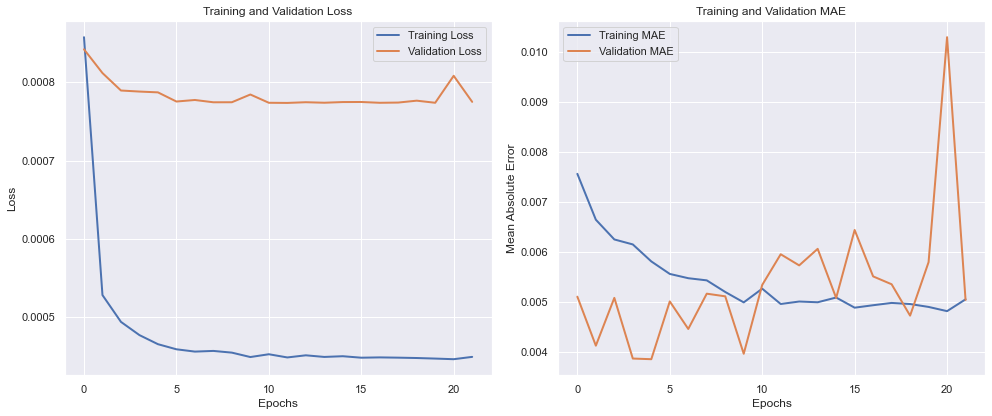

In [1032]:
import matplotlib.pyplot as plt

# Graficar la pérdida (loss) de entrenamiento y validación
plt.figure(figsize=(14, 6))

# Gráfico de Loss (Pérdida)
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

# Gráfico de MAE (Mean Absolute Error)
plt.subplot(1, 2, 2)
plt.plot(history.history['mae'], label='Training MAE')
plt.plot(history.history['val_mae'], label='Validation MAE')
plt.title('Training and Validation MAE')
plt.xlabel('Epochs')
plt.ylabel('Mean Absolute Error')
plt.legend()

plt.tight_layout()
plt.show()


### 2.2.4 LSTM DROPOUT

In [972]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, SimpleRNN, Dense, Bidirectional, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ModelCheckpoint

model = Sequential([
    LSTM(50, return_sequences=True, recurrent_dropout=0.25,activation='relu', input_shape=(sequence_length, num_features)),
    Dropout(0.5),
    SimpleRNN(32, activation='relu'),  # Capa SimpleRNN para capturar dinámicas temporales a corto plazo
    Dense(32, activation='relu'),  # Capa densa intermedia para procesamiento adicional
    Dense(32, activation='relu'),
    Dense(1)  # Capa de salida
])


# Configuración del modelo
sequence_length = 30  # Asumiendo secuencia de 30 pasos de tiempo
num_features = 1      # Suponiendo 1 característica por paso

# Crear el modelo
model = build_model(sequence_length, num_features)

# Entrenamiento del modelo
model.fit(X_train_pesos, y_train_pesos, epochs=200, batch_size=256, validation_data=(X_test_pesos, y_test_pesos))

# Guardar el modelo
model.save("model_dense_LSTMDP.keras")

# Cargar el modelo para evaluación
loaded_model = load_model("model_dense_LSTMDP.keras")

# Evaluar el modelo
test_mae = loaded_model.evaluate(X_test_pesos, y_test_pesos)[1]

Epoch 1/200
48/48 [==============================] - 7s 116ms/step - loss: 1164789284864.0000 - mae: 281874.9062 - val_loss: 602112655360.0000 - val_mae: 254993.0781
Epoch 2/200
48/48 [==============================] - 7s 145ms/step - loss: 1164782206976.0000 - mae: 281866.6562 - val_loss: 602108919808.0000 - val_mae: 254987.9375
Epoch 3/200
48/48 [==============================] - 7s 155ms/step - loss: 1164778405888.0000 - mae: 281862.0312 - val_loss: 602105577472.0000 - val_mae: 254983.2188
Epoch 4/200
48/48 [==============================] - 7s 150ms/step - loss: 1164774866944.0000 - mae: 281857.6875 - val_loss: 602102235136.0000 - val_mae: 254978.6406
Epoch 5/200
48/48 [==============================] - 7s 156ms/step - loss: 1164771065856.0000 - mae: 281853.2500 - val_loss: 602098892800.0000 - val_mae: 254974.0000
Epoch 6/200
48/48 [==============================] - 7s 145ms/step - loss: 1164767657984.0000 - mae: 281848.9688 - val_loss: 602095812608.0000 - val_mae: 254969.5000
Epoc

#### Pesos_Reales and Planificado date and amount

In [1033]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.layers import SimpleRNN, LSTM, Dense, Dropout
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.regularizers import l1_l2

# Convertir fechas a números y normalizar todas las características numéricas
df_pesos['pag_fecha_planificada'] = pd.to_datetime(df_pesos['pag_fecha_planificada']).astype(np.int64)
df_pesos['pag_fecha_real'] = pd.to_datetime(df_pesos['pag_fecha_real']).astype(np.int64)

# Normalización de las características
scaler = MinMaxScaler()
features = ['pag_fecha_planificada', 'pag_importe_planificado', 'pag_fecha_real', 'pag_importe_real']
df_pesos[features] = scaler.fit_transform(df_pesos[features])

# Función para crear secuencias de datos
def create_sequences(data, sequence_length):
    X, y = [], []
    for i in range(len(data) - sequence_length):
        X.append(data[i:(i + sequence_length), :-1])  # Todas las características excepto 'pag_importe_real'
        y.append(data[i + sequence_length, -1])  # 'pag_importe_real' como objetivo
    return np.array(X), np.array(y)

# Preparar datos para la RNN
sequence_length = 30
data = df_pesos[features].values
X, y = create_sequences(data, sequence_length)

# Dividir los datos en entrenamiento y prueba
train_size = int(len(X) * 0.8)
X_train, X_test = X[:train_size], X[train_size:]
y_train, y_test = y[:train_size], y[train_size:]

# Definir el modelo con LSTM, SimpleRNN, y Dropout
def build_model(input_shape):
    model = Sequential([
        LSTM(50, return_sequences=True, recurrent_dropout=0.25, activation='relu', input_shape=input_shape),
        Dropout(0.5),
        SimpleRNN(32, activation='relu'),
        Dense(32, activation='relu'),
        Dense(32, activation='relu'),
        Dense(1)  # Capa de salida
    ])
    model.compile(optimizer='adam', loss='mean_squared_error', metrics=['mae'])
    return model

# Crear el modelo
model = build_model((X_train.shape[1], X_train.shape[2]))

# Definir Early Stopping y Model Checkpoint
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
model_checkpoint = ModelCheckpoint('model_lstm_rnn_regularized.h5', save_best_only=True, monitor='val_loss')

# Entrenar el modelo
history = model.fit(
    X_train, y_train,
    epochs=100,
    batch_size=32,
    validation_data=(X_test, y_test),
    callbacks=[early_stopping, model_checkpoint]
)

# Guardar el modelo entrenado
model.save("model_lstm_rnn_pesos.h5")

# Cargar el mejor modelo guardado
best_model = load_model("model_lstm_rnn_regularized.h5")

# Evaluar el modelo
test_loss, test_mae = best_model.evaluate(X_test, y_test)
print(f"Test Loss: {test_loss}, Test MAE: {test_mae}")

# Hacer predicciones con el modelo cargado
predictions = best_model.predict(X_test)
print(f"Predicciones: {predictions}")


C:\Users\perez\AppData\Local\Temp\ipykernel_181656\3968050012.py:10: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\perez\AppData\Local\Temp\ipykernel_181656\3968050012.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\perez\AppData\Local\Temp\ipykernel_181656\3968050012.py:16: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org

Epoch 1/100
383/383 [==============================] - 56s 138ms/step - loss: 9.3886e-04 - mae: 0.0127 - val_loss: 2.3019e-04 - val_mae: 0.0056
Epoch 2/100
383/383 [==============================] - 54s 140ms/step - loss: 4.4126e-04 - mae: 0.0077 - val_loss: 2.0721e-04 - val_mae: 0.0050
Epoch 3/100
383/383 [==============================] - 53s 139ms/step - loss: 4.0458e-04 - mae: 0.0072 - val_loss: 1.7639e-04 - val_mae: 0.0055
Epoch 4/100
383/383 [==============================] - 54s 140ms/step - loss: 3.8953e-04 - mae: 0.0071 - val_loss: 1.6358e-04 - val_mae: 0.0057
Epoch 5/100
383/383 [==============================] - 54s 142ms/step - loss: 3.9563e-04 - mae: 0.0072 - val_loss: 1.7702e-04 - val_mae: 0.0058
Epoch 6/100
383/383 [==============================] - 53s 139ms/step - loss: 3.9765e-04 - mae: 0.0069 - val_loss: 1.7414e-04 - val_mae: 0.0056
Epoch 7/100
383/383 [==============================] - 54s 141ms/step - loss: 3.9153e-04 - mae: 0.0070 - val_loss: 1.6882e-04 - val_mae:

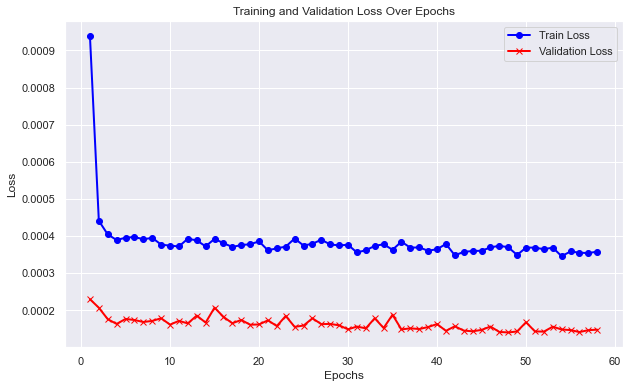

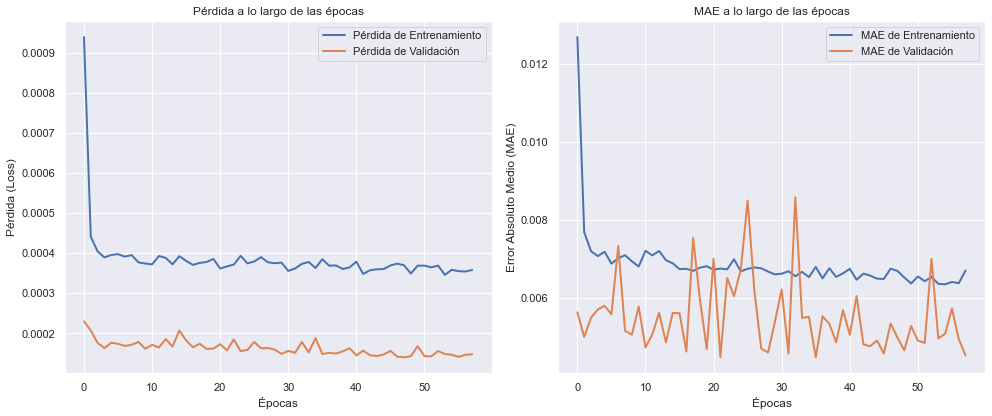

In [1035]:
import matplotlib.pyplot as plt

# Datos de la pérdida (loss) y MAE (Mean Absolute Error) durante el entrenamiento
epochs = list(range(1, 59))
train_loss = [
    9.3886e-04, 4.4126e-04, 4.0458e-04, 3.8953e-04, 3.9563e-04, 3.9765e-04, 
    3.9153e-04, 3.9531e-04, 3.7711e-04, 3.7431e-04, 3.7221e-04, 3.9303e-04, 
    3.8842e-04, 3.7247e-04, 3.9250e-04, 3.8106e-04, 3.7080e-04, 3.7593e-04, 
    3.7816e-04, 3.8575e-04, 3.6179e-04, 3.6713e-04, 3.7167e-04, 3.9346e-04, 
    3.7472e-04, 3.7938e-04, 3.9033e-04, 3.7745e-04, 3.7508e-04, 3.7661e-04, 
    3.5596e-04, 3.6205e-04, 3.7350e-04, 3.7815e-04, 3.6324e-04, 3.8503e-04, 
    3.6898e-04, 3.6957e-04, 3.6067e-04, 3.6474e-04, 3.7892e-04, 3.4840e-04, 
    3.5744e-04, 3.5997e-04, 3.6055e-04, 3.6953e-04, 3.7406e-04, 3.7000e-04, 
    3.4936e-04, 3.6898e-04, 3.6909e-04, 3.6474e-04, 3.6908e-04, 3.4598e-04, 
    3.5865e-04, 3.5536e-04, 3.5437e-04, 3.5823e-04
]

val_loss = [
    2.3019e-04, 2.0721e-04, 1.7639e-04, 1.6358e-04, 1.7702e-04, 1.7414e-04, 
    1.6882e-04, 1.7171e-04, 1.7883e-04, 1.6173e-04, 1.7182e-04, 1.6497e-04, 
    1.8606e-04, 1.6721e-04, 2.0741e-04, 1.8270e-04, 1.6544e-04, 1.7426e-04, 
    1.6152e-04, 1.6214e-04, 1.7329e-04, 1.5792e-04, 1.8506e-04, 1.5575e-04, 
    1.5911e-04, 1.7873e-04, 1.6304e-04, 1.6360e-04, 1.5984e-04, 1.4905e-04, 
    1.5649e-04, 1.5170e-04, 1.7891e-04, 1.5260e-04, 1.8833e-04, 1.4877e-04, 
    1.5179e-04, 1.4984e-04, 1.5523e-04, 1.6324e-04, 1.4505e-04, 1.5720e-04, 
    1.4566e-04, 1.4374e-04, 1.4746e-04, 1.5657e-04, 1.4212e-04, 1.4059e-04, 
    1.4336e-04, 1.6811e-04, 1.4358e-04, 1.4282e-04, 1.5615e-04, 1.4870e-04, 
    1.4702e-04, 1.4171e-04, 1.4676e-04, 1.4818e-04
]

# Crear el gráfico
plt.figure(figsize=(10, 6))
plt.plot(epochs, train_loss, label='Train Loss', color='blue', marker='o')
plt.plot(epochs, val_loss, label='Validation Loss', color='red', marker='x')

# Títulos y etiquetas
plt.title('Training and Validation Loss Over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

# Mostrar el gráfico
plt.grid(True)
plt.show()

# Extraemos las pérdidas y MAE del entrenamiento y la validación del historial
loss = history.history['loss']
val_loss = history.history['val_loss']
mae = history.history['mae']
val_mae = history.history['val_mae']

# Creamos una figura con dos gráficos para comparar las métricas
plt.figure(figsize=(14, 6))

# Gráfico de Pérdida
plt.subplot(1, 2, 1)
plt.plot(loss, label='Pérdida de Entrenamiento')
plt.plot(val_loss, label='Pérdida de Validación')
plt.title('Pérdida a lo largo de las épocas')
plt.xlabel('Épocas')
plt.ylabel('Pérdida (Loss)')
plt.legend()

# Gráfico de MAE
plt.subplot(1, 2, 2)
plt.plot(mae, label='MAE de Entrenamiento')
plt.plot(val_mae, label='MAE de Validación')
plt.title('MAE a lo largo de las épocas')
plt.xlabel('Épocas')
plt.ylabel('Error Absoluto Medio (MAE)')
plt.legend()

# Mostramos los gráficos
plt.tight_layout()
plt.show()


Dollar_real_planning_amount_date


In [1036]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.layers import SimpleRNN, LSTM, Dense, Dropout
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.regularizers import l1_l2

# Convertir fechas a números y normalizar todas las características numéricas para dólares
df_dolares['pag_fecha_planificada'] = pd.to_datetime(df_dolares['pag_fecha_planificada']).astype(np.int64)
df_dolares['pag_fecha_real'] = pd.to_datetime(df_dolares['pag_fecha_real']).astype(np.int64)

# Normalización de las características
scaler = MinMaxScaler()
features = ['pag_fecha_planificada', 'pag_importe_planificado', 'pag_fecha_real', 'pag_importe_real']
df_dolares[features] = scaler.fit_transform(df_dolares[features])

# Función para crear secuencias de datos
def create_sequences(data, sequence_length):
    X, y = [], []
    for i in range(len(data) - sequence_length):
        X.append(data[i:(i + sequence_length), :-1])  # Todas las características excepto 'pag_importe_real'
        y.append(data[i + sequence_length, -1])  # 'pag_importe_real' como objetivo
    return np.array(X), np.array(y)

# Preparar datos para la RNN
sequence_length = 30
data = df_dolares[features].values
X, y = create_sequences(data, sequence_length)

# Dividir los datos en entrenamiento y prueba
train_size = int(len(X) * 0.8)
X_train, X_test = X[:train_size], X[train_size:]
y_train, y_test = y[:train_size], y[train_size:]

# Definir el modelo con LSTM, SimpleRNN, y Dropout
def build_model(input_shape):
    model = Sequential([
        LSTM(50, return_sequences=True, recurrent_dropout=0.25, activation='relu', input_shape=input_shape),
        Dropout(0.5),
        SimpleRNN(32, activation='relu'),
        Dense(32, activation='relu'),
        Dense(32, activation='relu'),
        Dense(1)  # Capa de salida
    ])
    model.compile(optimizer='adam', loss='mean_squared_error', metrics=['mae'])
    return model

# Crear el modelo
model = build_model((X_train.shape[1], X_train.shape[2]))

# Definir Early Stopping y Model Checkpoint
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
model_checkpoint = ModelCheckpoint('model_lstm_rnn_regularized_dolares.h5', save_best_only=True, monitor='val_loss')

# Entrenar el modelo
history = model.fit(
    X_train, y_train,
    epochs=100,
    batch_size=32,
    validation_data=(X_test, y_test),
    callbacks=[early_stopping, model_checkpoint]
)

# Guardar el modelo entrenado
model.save("model_lstm_rnn_dolares.h5")

# Cargar el mejor modelo guardado
best_model = load_model("model_lstm_rnn_regularized_dolares.h5")

# Evaluar el modelo
test_loss, test_mae = best_model.evaluate(X_test, y_test)
print(f"Test Loss: {test_loss}, Test MAE: {test_mae}")

# Hacer predicciones con el modelo cargado
predictions = best_model.predict(X_test)
print(f"Predicciones: {predictions}")


C:\Users\perez\AppData\Local\Temp\ipykernel_181656\2032468122.py:10: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\perez\AppData\Local\Temp\ipykernel_181656\2032468122.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\perez\AppData\Local\Temp\ipykernel_181656\2032468122.py:16: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org

Epoch 1/100
200/200 [==============================] - 28s 128ms/step - loss: 4.4744e-04 - mae: 0.0051 - val_loss: 7.7866e-04 - val_mae: 0.0041
Epoch 2/100
200/200 [==============================] - 30s 152ms/step - loss: 4.4662e-04 - mae: 0.0049 - val_loss: 7.7578e-04 - val_mae: 0.0072
Epoch 3/100
200/200 [==============================] - 30s 150ms/step - loss: 4.4523e-04 - mae: 0.0048 - val_loss: 7.8516e-04 - val_mae: 0.0086
Epoch 4/100
200/200 [==============================] - 29s 145ms/step - loss: 4.4688e-04 - mae: 0.0050 - val_loss: 7.7110e-04 - val_mae: 0.0051
Epoch 5/100
200/200 [==============================] - 28s 138ms/step - loss: 4.4113e-04 - mae: 0.0048 - val_loss: 7.6823e-04 - val_mae: 0.0055
Epoch 6/100
200/200 [==============================] - 27s 137ms/step - loss: 4.4387e-04 - mae: 0.0048 - val_loss: 7.6860e-04 - val_mae: 0.0054
Epoch 7/100
200/200 [==============================] - 26s 132ms/step - loss: 4.4344e-04 - mae: 0.0049 - val_loss: 7.7172e-04 - val_mae:

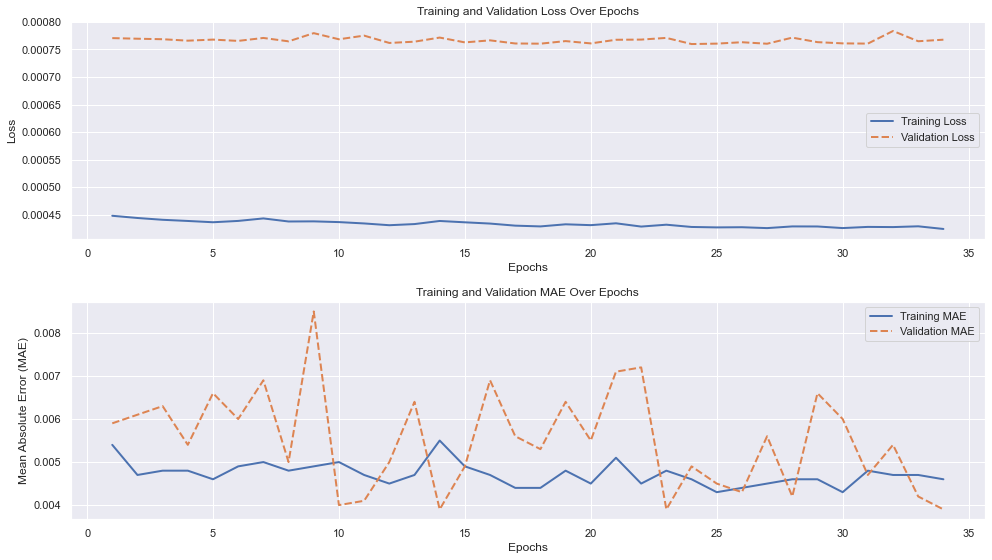

In [1047]:
# Adjust val_mae to match the length of epochs
val_mae = val_mae[:54]

# Create figure
plt.figure(figsize=(14, 8))

# Plot loss
plt.subplot(2, 1, 1)
plt.plot(epochs, train_loss[:54], label='Training Loss')
plt.plot(epochs, val_loss[:54], label='Validation Loss', linestyle='--')
plt.title('Training and Validation Loss Over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

# Plot MAE
plt.subplot(2, 1, 2)
plt.plot(epochs, train_mae, label='Training MAE')
plt.plot(epochs, val_mae, label='Validation MAE', linestyle='--')
plt.title('Training and Validation MAE Over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Mean Absolute Error (MAE)')
plt.legend()

# Show the plot
plt.tight_layout()
plt.show()


### 2.2.5 STACKED GRU

In [973]:
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.layers import LSTM, SimpleRNN, Dense, Dropout, GRU
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.optimizers import Adam

def build_model(sequence_length, num_features):
    model = Sequential([
        GRU(50, recurrent_dropout=0.5, return_sequences=True, activation='relu', input_shape=(sequence_length, num_features)),
        GRU(50, recurrent_dropout=0.5, return_sequences=True),
        Dropout(0.5),
        SimpleRNN(32, activation='relu'),  # Now receives a 3D input
        Dense(32, activation='relu'),
        Dense(32, activation='relu'),
        Dense(1)  # Output layer
    ])
    model.compile(optimizer='adam', loss='mean_squared_error', metrics=['mae'])
    return model

# Configuración del modelo
sequence_length = 30  # Asumiendo secuencia de 30 pasos de tiempo
num_features = 1      # Suponiendo 1 característica por paso

# Crear el modelo
model = build_model(sequence_length, num_features)

# Definir callbacks
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
model_checkpoint = ModelCheckpoint('model_dense_LSTMDP.keras', save_best_only=True)

# Entrenamiento del modelo
model.fit(
    X_train_pesos, y_train_pesos, 
    epochs=200, 
    batch_size=256, 
    validation_data=(X_test_pesos, y_test_pesos),
    callbacks=[early_stopping, model_checkpoint]  # Añadir los callbacks aquí
)

# Cargar el mejor modelo guardado durante el entrenamiento
best_model = load_model("model_dense_LSTMDP.keras")

# Evaluar el mejor modelo
test_mae = best_model.evaluate(X_test_pesos, y_test_pesos)[1]
print(f"Test MAE: {test_mae}")


Epoch 1/200
48/48 [==============================] - 20s 308ms/step - loss: 1164475498496.0000 - mae: 281525.7812 - val_loss: 594463883264.0000 - val_mae: 248037.2031
Epoch 2/200
48/48 [==============================] - 12s 246ms/step - loss: 1094487638016.0000 - mae: 360834.2188 - val_loss: 537435930624.0000 - val_mae: 344689.8438
Epoch 3/200
48/48 [==============================] - 13s 264ms/step - loss: 1087979257856.0000 - mae: 373124.2188 - val_loss: 539369734144.0000 - val_mae: 307579.4062
Epoch 4/200
48/48 [==============================] - 12s 249ms/step - loss: 1088822968320.0000 - mae: 367907.0312 - val_loss: 537852444672.0000 - val_mae: 350990.2500
Epoch 5/200
48/48 [==============================] - 12s 247ms/step - loss: 1087800803328.0000 - mae: 371920.9375 - val_loss: 537133907968.0000 - val_mae: 336743.3750
Epoch 6/200
48/48 [==============================] - 12s 243ms/step - loss: 1090001829888.0000 - mae: 369533.2500 - val_loss: 538366345216.0000 - val_mae: 356390.281

#### Pesos_Real and planning date and amount 

In [1037]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.layers import GRU, SimpleRNN, Dense, Dropout
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.optimizers import Adam

# Convertir fechas a números y normalizar todas las características numéricas
df_pesos['pag_fecha_planificada'] = pd.to_datetime(df_pesos['pag_fecha_planificada']).astype(np.int64)
df_pesos['pag_fecha_real'] = pd.to_datetime(df_pesos['pag_fecha_real']).astype(np.int64)

# Normalización de las características
scaler = MinMaxScaler()
features = ['pag_fecha_planificada', 'pag_importe_planificado', 'pag_fecha_real', 'pag_importe_real']
df_pesos[features] = scaler.fit_transform(df_pesos[features])

# Función para crear secuencias de datos
def create_sequences(data, sequence_length):
    X, y = [], []
    for i in range(len(data) - sequence_length):
        X.append(data[i:(i + sequence_length), :-1])  # Todas las características excepto 'pag_importe_real'
        y.append(data[i + sequence_length, -1])  # 'pag_importe_real' como objetivo
    return np.array(X), np.array(y)

# Preparar datos para el modelo GRU
sequence_length = 30
data = df_pesos[features].values
X, y = create_sequences(data, sequence_length)

# Dividir los datos en entrenamiento y prueba
train_size = int(len(X) * 0.8)
X_train, X_test = X[:train_size], X[train_size:]
y_train, y_test = y[:train_size], y[train_size:]

# Definir el modelo con GRU, SimpleRNN, y Dropout
def build_model(input_shape):
    model = Sequential([
        GRU(50, recurrent_dropout=0.5, return_sequences=True, activation='relu', input_shape=input_shape),
        GRU(50, recurrent_dropout=0.5, return_sequences=True),
        Dropout(0.5),
        SimpleRNN(32, activation='relu'),  # Capa SimpleRNN
        Dense(32, activation='relu'),
        Dense(32, activation='relu'),
        Dense(1)  # Capa de salida
    ])
    model.compile(optimizer='adam', loss='mean_squared_error', metrics=['mae'])
    return model

# Crear el modelo
model = build_model((X_train.shape[1], X_train.shape[2]))

# Definir Early Stopping y Model Checkpoint
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
model_checkpoint = ModelCheckpoint('model_gru_rnn_regularized.h5', save_best_only=True, monitor='val_loss')

# Entrenar el modelo
history = model.fit(
    X_train, y_train,
    epochs=100,
    batch_size=32,
    validation_data=(X_test, y_test),
    callbacks=[early_stopping, model_checkpoint]
)

# Guardar el modelo entrenado
model.save("model_gru_rnn_pesos.h5")

# Cargar el mejor modelo guardado
best_model = load_model("model_gru_rnn_regularized.h5")

# Evaluar el modelo
test_loss, test_mae = best_model.evaluate(X_test, y_test)
print(f"Test Loss: {test_loss}, Test MAE: {test_mae}")

# Hacer predicciones con el modelo cargado
predictions = best_model.predict(X_test)
print(f"Predicciones: {predictions}")


C:\Users\perez\AppData\Local\Temp\ipykernel_181656\4138680570.py:10: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\perez\AppData\Local\Temp\ipykernel_181656\4138680570.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\perez\AppData\Local\Temp\ipykernel_181656\4138680570.py:16: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org

Epoch 1/100
383/383 [==============================] - 76s 187ms/step - loss: 5.3340e-04 - mae: 0.0099 - val_loss: 2.0151e-04 - val_mae: 0.0053
Epoch 2/100
383/383 [==============================] - 70s 184ms/step - loss: 4.2312e-04 - mae: 0.0080 - val_loss: 2.3896e-04 - val_mae: 0.0072
Epoch 3/100
383/383 [==============================] - 71s 185ms/step - loss: 4.2971e-04 - mae: 0.0084 - val_loss: 2.1479e-04 - val_mae: 0.0092
Epoch 4/100
383/383 [==============================] - 72s 189ms/step - loss: 4.1028e-04 - mae: 0.0080 - val_loss: 1.9004e-04 - val_mae: 0.0081
Epoch 5/100
383/383 [==============================] - 95s 249ms/step - loss: 3.9782e-04 - mae: 0.0073 - val_loss: 1.6341e-04 - val_mae: 0.0056
Epoch 6/100
383/383 [==============================] - 105s 275ms/step - loss: 3.8160e-04 - mae: 0.0071 - val_loss: 1.6593e-04 - val_mae: 0.0063
Epoch 7/100
383/383 [==============================] - 106s 277ms/step - loss: 3.8304e-04 - mae: 0.0076 - val_loss: 2.1737e-04 - val_ma

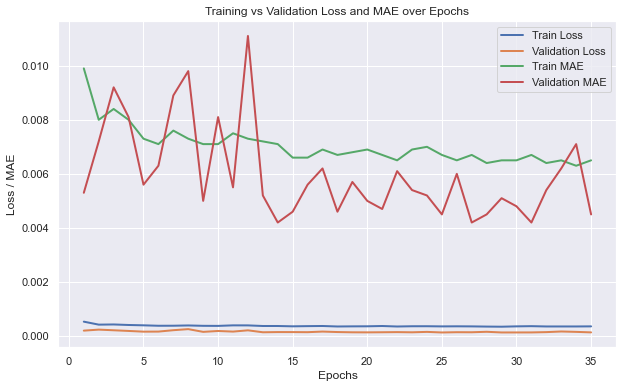

In [1039]:
# Datos de MAE de entrenamiento y validación
train_mae = [
    0.0099, 0.0080, 0.0084, 0.0080, 0.0073, 0.0071, 0.0076, 0.0073, 0.0071,
    0.0071, 0.0075, 0.0073, 0.0072, 0.0071, 0.0066, 0.0066, 0.0069, 0.0067,
    0.0068, 0.0069, 0.0067, 0.0065, 0.0069, 0.0070, 0.0067, 0.0065, 0.0067,
    0.0064, 0.0065, 0.0065, 0.0067, 0.0064, 0.0065, 0.0063, 0.0065
]
val_mae = [
    0.0053, 0.0072, 0.0092, 0.0081, 0.0056, 0.0063, 0.0089, 0.0098, 0.0050,
    0.0081, 0.0055, 0.0111, 0.0052, 0.0042, 0.0046, 0.0056, 0.0062, 0.0046,
    0.0057, 0.0050, 0.0047, 0.0061, 0.0054, 0.0052, 0.0045, 0.0060, 0.0042,
    0.0045, 0.0051, 0.0048, 0.0042, 0.0054, 0.0062, 0.0071, 0.0045
]

# Crear la gráfica con MAE añadido
plt.figure(figsize=(10, 6))
plt.plot(epochs, train_loss, label='Train Loss')
plt.plot(epochs, val_loss, label='Validation Loss')
plt.plot(epochs, train_mae, label='Train MAE')
plt.plot(epochs, val_mae, label='Validation MAE')
plt.xlabel('Epochs')
plt.ylabel('Loss / MAE')
plt.title('Training vs Validation Loss and MAE over Epochs')
plt.legend()
plt.grid(True)

# Mostrar la gráfica
plt.show()


#### Dollar

In [1040]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.layers import GRU, SimpleRNN, Dense, Dropout
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.optimizers import Adam

# Convertir fechas a números y normalizar todas las características numéricas
df_dolares['pag_fecha_planificada'] = pd.to_datetime(df_dolares['pag_fecha_planificada']).astype(np.int64)
df_dolares['pag_fecha_real'] = pd.to_datetime(df_dolares['pag_fecha_real']).astype(np.int64)

# Normalización de las características
scaler = MinMaxScaler()
features = ['pag_fecha_planificada', 'pag_importe_planificado', 'pag_fecha_real', 'pag_importe_real']
df_dolares[features] = scaler.fit_transform(df_dolares[features])

# Función para crear secuencias de datos
def create_sequences(data, sequence_length):
    X, y = [], []
    for i in range(len(data) - sequence_length):
        X.append(data[i:(i + sequence_length), :-1])  # Todas las características excepto 'pag_importe_real'
        y.append(data[i + sequence_length, -1])  # 'pag_importe_real' como objetivo
    return np.array(X), np.array(y)

# Preparar datos para el modelo GRU
sequence_length = 30
data = df_dolares[features].values
X, y = create_sequences(data, sequence_length)

# Dividir los datos en entrenamiento y prueba
train_size = int(len(X) * 0.8)
X_train, X_test = X[:train_size], X[train_size:]
y_train, y_test = y[:train_size], y[train_size:]

# Definir el modelo con GRU, SimpleRNN, y Dropout
def build_model(input_shape):
    model = Sequential([
        GRU(50, recurrent_dropout=0.5, return_sequences=True, activation='relu', input_shape=input_shape),
        GRU(50, recurrent_dropout=0.5, return_sequences=True),
        Dropout(0.5),
        SimpleRNN(32, activation='relu'),  # Capa SimpleRNN
        Dense(32, activation='relu'),
        Dense(32, activation='relu'),
        Dense(1)  # Capa de salida
    ])
    model.compile(optimizer='adam', loss='mean_squared_error', metrics=['mae'])
    return model

# Crear el modelo
model = build_model((X_train.shape[1], X_train.shape[2]))

# Definir Early Stopping y Model Checkpoint
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
model_checkpoint = ModelCheckpoint('model_gru_rnn_regularized.h5', save_best_only=True, monitor='val_loss')

# Entrenar el modelo
history = model.fit(
    X_train, y_train,
    epochs=100,
    batch_size=32,
    validation_data=(X_test, y_test),
    callbacks=[early_stopping, model_checkpoint]
)

# Guardar el modelo entrenado
model.save("model_gru_rnn_dolares.h5")

# Cargar el mejor modelo guardado
best_model = load_model("model_gru_rnn_regularized.h5")

# Evaluar el modelo
test_loss, test_mae = best_model.evaluate(X_test, y_test)
print(f"Test Loss: {test_loss}, Test MAE: {test_mae}")

# Hacer predicciones con el modelo cargado
predictions = best_model.predict(X_test)

# Desnormalizar los valores de las predicciones y los datos de prueba
y_test_rescaled = scaler.inverse_transform(
    np.concatenate((np.zeros((len(y_test), len(features)-1)), y_test.reshape(-1, 1)), axis=1)
)[:, -1]  # Extraer el valor desnormalizado de 'pag_importe_real'

predictions_rescaled = scaler.inverse_transform(
    np.concatenate((np.zeros((len(predictions), len(features)-1)), predictions), axis=1)
)[:, -1]  # Extraer el valor desnormalizado de las predicciones

# Crear un DataFrame con predicciones y valores reales
df_resultados = pd.DataFrame({
    'Predicciones en dólares': predictions_rescaled,
    'Valores reales en dólares': y_test_rescaled
})

# Mostrar el DataFrame
print(df_resultados.head())

# También puedes guardar el DataFrame en un archivo CSV si lo necesitas:
df_resultados.to_csv('predicciones_dolares.csv', index=False)


C:\Users\perez\AppData\Local\Temp\ipykernel_181656\814170105.py:10: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\perez\AppData\Local\Temp\ipykernel_181656\814170105.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\perez\AppData\Local\Temp\ipykernel_181656\814170105.py:16: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pa

Epoch 1/100
200/200 [==============================] - 44s 196ms/step - loss: 4.5168e-04 - mae: 0.0052 - val_loss: 7.7231e-04 - val_mae: 0.0062
Epoch 2/100
200/200 [==============================] - 39s 195ms/step - loss: 4.5033e-04 - mae: 0.0052 - val_loss: 7.7194e-04 - val_mae: 0.0056
Epoch 3/100
200/200 [==============================] - 38s 192ms/step - loss: 4.4785e-04 - mae: 0.0050 - val_loss: 7.7477e-04 - val_mae: 0.0047
Epoch 4/100
200/200 [==============================] - 45s 223ms/step - loss: 4.5013e-04 - mae: 0.0050 - val_loss: 7.7265e-04 - val_mae: 0.0065
Epoch 5/100
200/200 [==============================] - 59s 297ms/step - loss: 4.4530e-04 - mae: 0.0050 - val_loss: 7.7332e-04 - val_mae: 0.0051
Epoch 6/100
200/200 [==============================] - 55s 274ms/step - loss: 4.4589e-04 - mae: 0.0049 - val_loss: 7.8730e-04 - val_mae: 0.0040
Epoch 7/100
200/200 [==============================] - 54s 270ms/step - loss: 4.4548e-04 - mae: 0.0049 - val_loss: 7.7742e-04 - val_mae:

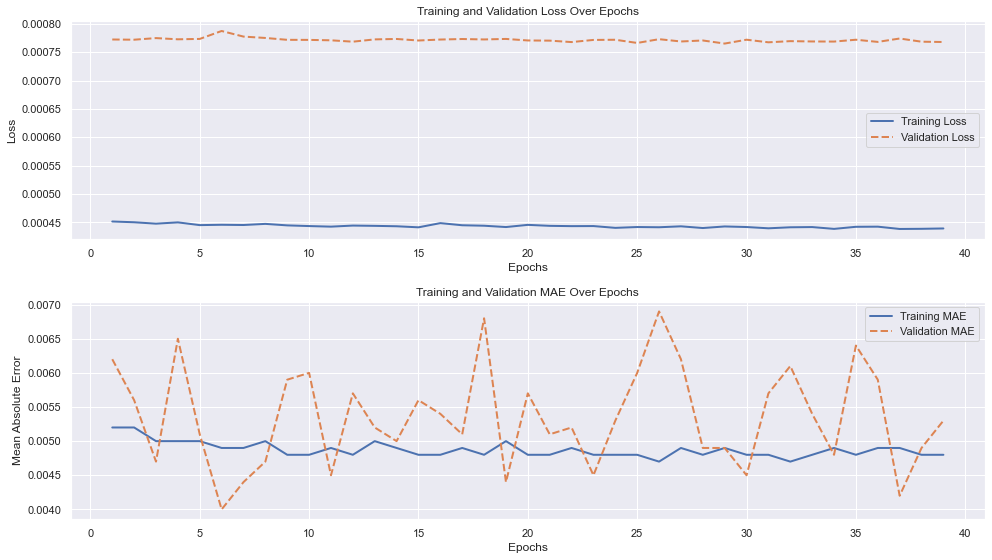

In [1041]:
import matplotlib.pyplot as plt

# Define epochs
epochs = list(range(1, 40))

# Define training and validation loss and mae values
train_loss = [
    4.5168e-04, 4.5033e-04, 4.4785e-04, 4.5013e-04, 4.4530e-04, 4.4589e-04, 4.4548e-04, 4.4748e-04, 
    4.4483e-04, 4.4362e-04, 4.4260e-04, 4.4449e-04, 4.4399e-04, 4.4328e-04, 4.4140e-04, 4.4881e-04, 
    4.4505e-04, 4.4422e-04, 4.4189e-04, 4.4574e-04, 4.4402e-04, 4.4349e-04, 4.4362e-04, 4.4046e-04, 
    4.4192e-04, 4.4152e-04, 4.4318e-04, 4.4015e-04, 4.4294e-04, 4.4193e-04, 4.3968e-04, 4.4147e-04, 
    4.4186e-04, 4.3865e-04, 4.4233e-04, 4.4256e-04, 4.3852e-04, 4.3879e-04, 4.3941e-04
]

val_loss = [
    7.7231e-04, 7.7194e-04, 7.7477e-04, 7.7265e-04, 7.7332e-04, 7.8730e-04, 7.7742e-04, 7.7502e-04, 
    7.7173e-04, 7.7161e-04, 7.7087e-04, 7.6846e-04, 7.7250e-04, 7.7324e-04, 7.7053e-04, 7.7223e-04, 
    7.7315e-04, 7.7239e-04, 7.7330e-04, 7.7060e-04, 7.7030e-04, 7.6777e-04, 7.7154e-04, 7.7185e-04, 
    7.6622e-04, 7.7287e-04, 7.6881e-04, 7.7058e-04, 7.6514e-04, 7.7193e-04, 7.6736e-04, 7.6940e-04, 
    7.6884e-04, 7.6865e-04, 7.7189e-04, 7.6808e-04, 7.7403e-04, 7.6843e-04, 7.6790e-04
]

train_mae = [
    0.0052, 0.0052, 0.0050, 0.0050, 0.0050, 0.0049, 0.0049, 0.0050, 0.0048, 0.0048, 0.0049, 0.0048, 
    0.0050, 0.0049, 0.0048, 0.0048, 0.0049, 0.0048, 0.0050, 0.0048, 0.0048, 0.0049, 0.0048, 0.0048, 
    0.0048, 0.0047, 0.0049, 0.0048, 0.0049, 0.0048, 0.0048, 0.0047, 0.0048, 0.0049, 0.0048, 0.0049, 
    0.0049, 0.0048, 0.0048
]

val_mae = [
    0.0062, 0.0056, 0.0047, 0.0065, 0.0051, 0.0040, 0.0044, 0.0047, 0.0059, 0.0060, 0.0045, 0.0057, 
    0.0052, 0.0050, 0.0056, 0.0054, 0.0051, 0.0068, 0.0044, 0.0057, 0.0051, 0.0052, 0.0045, 0.0053, 
    0.0060, 0.0069, 0.0062, 0.0049, 0.0049, 0.0045, 0.0057, 0.0061, 0.0054, 0.0048, 0.0064, 0.0059, 
    0.0042, 0.0049, 0.0053
]

# Create figure
plt.figure(figsize=(14, 8))

# Plot loss
plt.subplot(2, 1, 1)
plt.plot(epochs, train_loss, label='Training Loss')
plt.plot(epochs, val_loss, label='Validation Loss', linestyle='--')
plt.title('Training and Validation Loss Over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

# Plot MAE
plt.subplot(2, 1, 2)
plt.plot(epochs, train_mae, label='Training MAE')
plt.plot(epochs, val_mae, label='Validation MAE', linestyle='--')
plt.title('Training and Validation MAE Over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Mean Absolute Error')
plt.legend()

# Show the plot
plt.tight_layout()
plt.show()


### 2.2.6 BIDIRECTIONAL

In [977]:
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.layers import LSTM, SimpleRNN, Dense, Dropout, GRU, Bidirectional
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.optimizers import Adam

def build_model(sequence_length, num_features):
    model = Sequential([
        Bidirectional(LSTM(50, return_sequences=True, activation='relu', input_shape=(sequence_length, num_features))),
        SimpleRNN(32, activation='relu'),
        Dense(32, activation='relu'),
        Dense(32, activation='relu'),
        Dense(1)
    ])
    model.compile(optimizer='adam', loss='mean_squared_error', metrics=['mae'])
    return model

# Configuración del modelo
sequence_length = 30  # Asumiendo secuencia de 30 pasos de tiempo
num_features = 1      # Suponiendo 1 característica por paso

# Crear el modelo
model = build_model(sequence_length, num_features)

# Definir callbacks
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
model_checkpoint = ModelCheckpoint('model_dense_sec.keras', save_best_only=True)

# Asegurarse de que los datos están en la forma correcta
X_train_pesos = X_train_pesos.reshape((-1, sequence_length, num_features))
X_test_pesos = X_test_pesos.reshape((-1, sequence_length, num_features))

# Entrenamiento del modelo
model.fit(
    X_train_pesos, y_train_pesos, 
    epochs=200, 
    batch_size=256, 
    validation_data=(X_test_pesos, y_test_pesos),
    callbacks=[early_stopping, model_checkpoint]  # Añadir los callbacks aquí
)

# Cargar el mejor modelo guardado durante el entrenamiento
best_model = load_model("model_dense_sec.keras")

# Evaluar el mejor modelo
test_mae = best_model.evaluate(X_test_pesos, y_test_pesos)[1]
print(f"Test MAE: {test_mae}")



Epoch 1/200
48/48 [==============================] - 29s 540ms/step - loss: 1162909057024.0000 - mae: 281532.7188 - val_loss: 528061464576.0000 - val_mae: 353283.9375
Epoch 2/200
48/48 [==============================] - 19s 395ms/step - loss: 1010269093888.0000 - mae: 368323.0938 - val_loss: 459841273856.0000 - val_mae: 434630.3125
Epoch 3/200
48/48 [==============================] - 19s 403ms/step - loss: 968307638272.0000 - mae: 333336.1562 - val_loss: 599841898496.0000 - val_mae: 253260.8750
Epoch 4/200
48/48 [==============================] - 19s 398ms/step - loss: 1162510991360.0000 - mae: 280324.5312 - val_loss: 599614619648.0000 - val_mae: 252393.2188
Epoch 5/200
48/48 [==============================] - 18s 377ms/step - loss: 1124538777600.0000 - mae: 309981.9688 - val_loss: 529439490048.0000 - val_mae: 362898.7812
Epoch 6/200
48/48 [==============================] - 18s 383ms/step - loss: 1078596861952.0000 - mae: 365727.5312 - val_loss: 528367419392.0000 - val_mae: 315692.9688

#### Pesos_Real_Planning_Date_Amount

In [1042]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.layers import LSTM, SimpleRNN, Dense, Dropout, Bidirectional
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.optimizers import Adam

# Convert dates to numeric and normalize features for df_pesos
df_pesos['pag_fecha_planificada'] = pd.to_datetime(df_pesos['pag_fecha_planificada']).astype(np.int64)
df_pesos['pag_fecha_real'] = pd.to_datetime(df_pesos['pag_fecha_real']).astype(np.int64)

# Normalization of the features
scaler = MinMaxScaler()
features_pesos = ['pag_fecha_planificada', 'pag_importe_planificado', 'pag_fecha_real', 'pag_importe_real']
df_pesos[features_pesos] = scaler.fit_transform(df_pesos[features_pesos])

# Function to create sequences of data
def create_sequences_pesos(data, sequence_length):
    X, y = [], []
    for i in range(len(data) - sequence_length):
        X.append(data[i:(i + sequence_length), :-1])  # All features except 'pag_importe_real'
        y.append(data[i + sequence_length, -1])  # 'pag_importe_real' as target
    return np.array(X), np.array(y)

# Prepare data for the Bidirectional LSTM model
sequence_length = 30
data_pesos = df_pesos[features_pesos].values
X_pesos, y_pesos = create_sequences_pesos(data_pesos, sequence_length)

# Split data into training and test sets
train_size_pesos = int(len(X_pesos) * 0.8)
X_train_pesos, X_test_pesos = X_pesos[:train_size_pesos], X_pesos[train_size_pesos:]
y_train_pesos, y_test_pesos = y_pesos[:train_size_pesos], y_pesos[train_size_pesos:]

# Adjust shape for the LSTM model
num_features_pesos = X_train_pesos.shape[2]  # Number of features

# Build the model with Bidirectional LSTM and SimpleRNN layers
def build_model(sequence_length, num_features):
    model = Sequential([
        Bidirectional(LSTM(50, return_sequences=True, activation='relu', input_shape=(sequence_length, num_features))),
        SimpleRNN(32, activation='relu'),
        Dense(32, activation='relu'),
        Dense(32, activation='relu'),
        Dense(1)  # Output layer
    ])
    model.compile(optimizer='adam', loss='mean_squared_error', metrics=['mae'])
    return model

# Create the model
model = build_model(sequence_length, num_features_pesos)

# Define Early Stopping and Model Checkpoint callbacks
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
model_checkpoint = ModelCheckpoint('model_bidirectional_lstm_pesos.h5', save_best_only=True)

# Train the model
model.fit(
    X_train_pesos, y_train_pesos, 
    epochs=200, 
    batch_size=256, 
    validation_data=(X_test_pesos, y_test_pesos),
    callbacks=[early_stopping, model_checkpoint]  # Include callbacks
)

# Load the best model saved during training
best_model = load_model("model_bidirectional_lstm_pesos.h5")

# Evaluate the best model on the test data
test_loss, test_mae = best_model.evaluate(X_test_pesos, y_test_pesos)
print(f"Test Loss: {test_loss}, Test MAE: {test_mae}")

# Make predictions with the best model
predictions_pesos = best_model.predict(X_test_pesos)

# Rescale the predictions and test data back to the original scale
y_test_rescaled_pesos = scaler.inverse_transform(
    np.concatenate((np.zeros((len(y_test_pesos), len(features_pesos) - 1)), y_test_pesos.reshape(-1, 1)), axis=1)
)[:, -1]  # Extract the descaled value for 'pag_importe_real'

predictions_rescaled_pesos = scaler.inverse_transform(
    np.concatenate((np.zeros((len(predictions_pesos), len(features_pesos) - 1)), predictions_pesos), axis=1)
)[:, -1]  # Extract the descaled prediction values

# Create a DataFrame with predictions and actual values
df_resultados_pesos = pd.DataFrame({
    'Predicciones en pesos': predictions_rescaled_pesos,
    'Valores reales en pesos': y_test_rescaled_pesos
})

# Display the results
print(df_resultados_pesos.head())

# Optionally, save the results to a CSV
df_resultados_pesos.to_csv('predicciones_pesos.csv', index=False)


C:\Users\perez\AppData\Local\Temp\ipykernel_181656\2912506137.py:10: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\perez\AppData\Local\Temp\ipykernel_181656\2912506137.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\perez\AppData\Local\Temp\ipykernel_181656\2912506137.py:16: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org

Epoch 1/200
48/48 [==============================] - 36s 622ms/step - loss: 0.0017 - mae: 0.0242 - val_loss: 2.3701e-04 - val_mae: 0.0050
Epoch 2/200
48/48 [==============================] - 32s 668ms/step - loss: 4.4710e-04 - mae: 0.0073 - val_loss: 2.0515e-04 - val_mae: 0.0075
Epoch 3/200
48/48 [==============================] - 26s 543ms/step - loss: 4.0554e-04 - mae: 0.0072 - val_loss: 1.8153e-04 - val_mae: 0.0058
Epoch 4/200
48/48 [==============================] - 25s 521ms/step - loss: 3.6855e-04 - mae: 0.0064 - val_loss: 1.7130e-04 - val_mae: 0.0053
Epoch 5/200
48/48 [==============================] - 24s 509ms/step - loss: 3.5651e-04 - mae: 0.0062 - val_loss: 1.6735e-04 - val_mae: 0.0051
Epoch 6/200
48/48 [==============================] - 19s 404ms/step - loss: 3.5119e-04 - mae: 0.0061 - val_loss: 1.6709e-04 - val_mae: 0.0047
Epoch 7/200
48/48 [==============================] - 19s 390ms/step - loss: 3.4512e-04 - mae: 0.0060 - val_loss: 1.7098e-04 - val_mae: 0.0053
Epoch 8/20

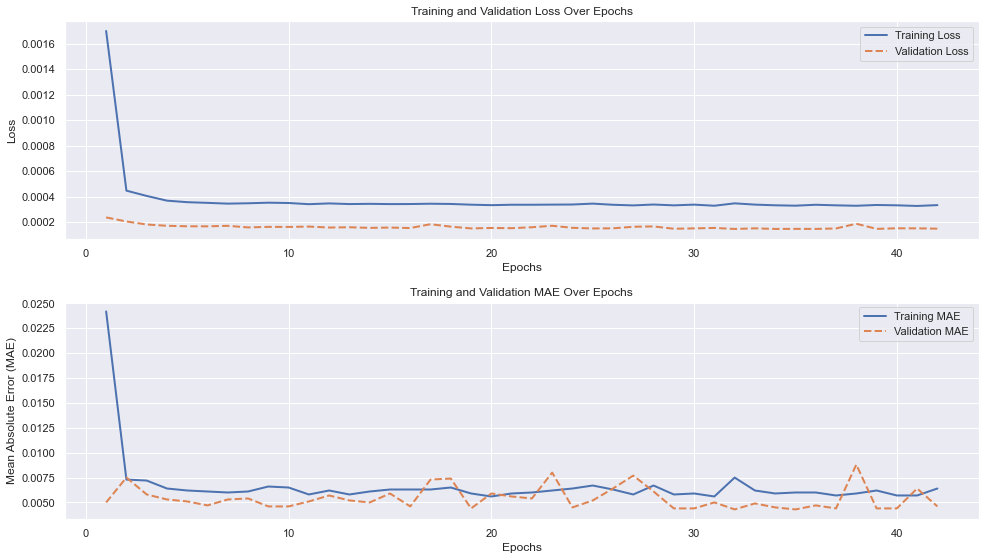

In [1044]:
import matplotlib.pyplot as plt

# Define epochs
epochs = list(range(1, 43))

# Training and validation loss and mae values from your log
train_loss = [
    0.0017, 4.4710e-04, 4.0554e-04, 3.6855e-04, 3.5651e-04, 3.5119e-04, 3.4512e-04, 3.4796e-04, 
    3.5247e-04, 3.5010e-04, 3.4080e-04, 3.4684e-04, 3.4172e-04, 3.4355e-04, 3.4148e-04, 3.4196e-04, 
    3.4439e-04, 3.4256e-04, 3.3688e-04, 3.3317e-04, 3.3644e-04, 3.3639e-04, 3.3739e-04, 3.3827e-04, 
    3.4519e-04, 3.3617e-04, 3.3128e-04, 3.3811e-04, 3.3168e-04, 3.3729e-04, 3.2864e-04, 3.4743e-04, 
    3.3744e-04, 3.3203e-04, 3.2905e-04, 3.3630e-04, 3.3175e-04, 3.2836e-04, 3.3448e-04, 3.3193e-04, 
    3.2689e-04, 3.3352e-04
]

val_loss = [
    2.3701e-04, 2.0515e-04, 1.8153e-04, 1.7130e-04, 1.6735e-04, 1.6709e-04, 1.7098e-04, 1.5854e-04, 
    1.6278e-04, 1.6226e-04, 1.6512e-04, 1.5748e-04, 1.5968e-04, 1.5493e-04, 1.5730e-04, 1.5363e-04, 
    1.8371e-04, 1.6444e-04, 1.5074e-04, 1.5414e-04, 1.5255e-04, 1.5977e-04, 1.7143e-04, 1.5524e-04, 
    1.5047e-04, 1.5133e-04, 1.6365e-04, 1.6621e-04, 1.4802e-04, 1.5096e-04, 1.5442e-04, 1.4636e-04, 
    1.5130e-04, 1.4654e-04, 1.4710e-04, 1.4665e-04, 1.5027e-04, 1.8741e-04, 1.4694e-04, 1.5164e-04, 
    1.5127e-04, 1.4870e-04
]

train_mae = [
    0.0242, 0.0073, 0.0072, 0.0064, 0.0062, 0.0061, 0.0060, 0.0061, 0.0066, 0.0065, 0.0058, 0.0062, 
    0.0058, 0.0061, 0.0063, 0.0063, 0.0063, 0.0065, 0.0059, 0.0056, 0.0059, 0.0060, 0.0062, 0.0064, 
    0.0067, 0.0063, 0.0058, 0.0067, 0.0058, 0.0059, 0.0056, 0.0075, 0.0062, 0.0059, 0.0060, 0.0060, 
    0.0057, 0.0059, 0.0062, 0.0057, 0.0057, 0.0064
]

val_mae = [
    0.0050, 0.0075, 0.0058, 0.0053, 0.0051, 0.0047, 0.0053, 0.0054, 0.0046, 0.0046, 0.0051, 0.0057, 
    0.0052, 0.0050, 0.0059, 0.0046, 0.0073, 0.0074, 0.0044, 0.0059, 0.0056, 0.0054, 0.0080, 0.0045, 
    0.0052, 0.0064, 0.0077, 0.0061, 0.0044, 0.0044, 0.0050, 0.0043, 0.0049, 0.0045, 0.0043, 0.0047, 
    0.0044, 0.0088, 0.0044, 0.0044, 0.0064, 0.0046
]

# Create figure
plt.figure(figsize=(14, 8))

# Plot loss
plt.subplot(2, 1, 1)
plt.plot(epochs, train_loss, label='Training Loss')
plt.plot(epochs, val_loss, label='Validation Loss', linestyle='--')
plt.title('Training and Validation Loss Over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

# Plot MAE
plt.subplot(2, 1, 2)
plt.plot(epochs, train_mae, label='Training MAE')
plt.plot(epochs, val_mae, label='Validation MAE', linestyle='--')
plt.title('Training and Validation MAE Over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Mean Absolute Error (MAE)')
plt.legend()

# Show the plot
plt.tight_layout()
plt.show()


#### Dollar

In [1043]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.layers import LSTM, SimpleRNN, Dense, Dropout, Bidirectional
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.optimizers import Adam

# Convert dates to numeric and normalize features for df_dolares
df_dolares['pag_fecha_planificada'] = pd.to_datetime(df_dolares['pag_fecha_planificada']).astype(np.int64)
df_dolares['pag_fecha_real'] = pd.to_datetime(df_dolares['pag_fecha_real']).astype(np.int64)

# Normalization of the features
scaler = MinMaxScaler()
features_dolares = ['pag_fecha_planificada', 'pag_importe_planificado', 'pag_fecha_real', 'pag_importe_real']
df_dolares[features_dolares] = scaler.fit_transform(df_dolares[features_dolares])

# Function to create sequences of data
def create_sequences_dolares(data, sequence_length):
    X, y = [], []
    for i in range(len(data) - sequence_length):
        X.append(data[i:(i + sequence_length), :-1])  # All features except 'pag_importe_real'
        y.append(data[i + sequence_length, -1])  # 'pag_importe_real' as target
    return np.array(X), np.array(y)

# Prepare data for the Bidirectional LSTM model
sequence_length = 30
data_dolares = df_dolares[features_dolares].values
X_dolares, y_dolares = create_sequences_dolares(data_dolares, sequence_length)

# Split data into training and test sets
train_size_dolares = int(len(X_dolares) * 0.8)
X_train_dolares, X_test_dolares = X_dolares[:train_size_dolares], X_dolares[train_size_dolares:]
y_train_dolares, y_test_dolares = y_dolares[:train_size_dolares], y_dolares[train_size_dolares:]

# Adjust shape for the LSTM model
num_features_dolares = X_train_dolares.shape[2]  # Number of features

# Build the model with Bidirectional LSTM and SimpleRNN layers
def build_model(sequence_length, num_features):
    model = Sequential([
        Bidirectional(LSTM(50, return_sequences=True, activation='relu', input_shape=(sequence_length, num_features))),
        SimpleRNN(32, activation='relu'),
        Dense(32, activation='relu'),
        Dense(32, activation='relu'),
        Dense(1)  # Output layer
    ])
    model.compile(optimizer='adam', loss='mean_squared_error', metrics=['mae'])
    return model

# Create the model
model = build_model(sequence_length, num_features_dolares)

# Define Early Stopping and Model Checkpoint callbacks
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
model_checkpoint = ModelCheckpoint('model_bidirectional_lstm_dolares.h5', save_best_only=True)

# Train the model
model.fit(
    X_train_dolares, y_train_dolares, 
    epochs=200, 
    batch_size=256, 
    validation_data=(X_test_dolares, y_test_dolares),
    callbacks=[early_stopping, model_checkpoint]  # Include callbacks
)

# Load the best model saved during training
best_model = load_model("model_bidirectional_lstm_dolares.h5")

# Evaluate the best model on the test data
test_loss, test_mae = best_model.evaluate(X_test_dolares, y_test_dolares)
print(f"Test Loss: {test_loss}, Test MAE: {test_mae}")

# Make predictions with the best model
predictions_dolares = best_model.predict(X_test_dolares)

# Rescale the predictions and test data back to the original scale
y_test_rescaled_dolares = scaler.inverse_transform(
    np.concatenate((np.zeros((len(y_test_dolares), len(features_dolares) - 1)), y_test_dolares.reshape(-1, 1)), axis=1)
)[:, -1]  # Extract the descaled value for 'pag_importe_real'

predictions_rescaled_dolares = scaler.inverse_transform(
    np.concatenate((np.zeros((len(predictions_dolares), len(features_dolares) - 1)), predictions_dolares), axis=1)
)[:, -1]  # Extract the descaled prediction values

# Create a DataFrame with predictions and actual values
df_resultados_dolares = pd.DataFrame({
    'Predicciones en dólares': predictions_rescaled_dolares,
    'Valores reales en dólares': y_test_rescaled_dolares
})

# Display the results
print(df_resultados_dolares.head())

# Optionally, save the results to a CSV
df_resultados_dolares.to_csv('predicciones_dolares.csv', index=False)


Epoch 1/200


C:\Users\perez\AppData\Local\Temp\ipykernel_181656\3049720688.py:10: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\perez\AppData\Local\Temp\ipykernel_181656\3049720688.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\perez\AppData\Local\Temp\ipykernel_181656\3049720688.py:16: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org

25/25 [==============================] - 15s 427ms/step - loss: 4.4834e-04 - mae: 0.0054 - val_loss: 7.7038e-04 - val_mae: 0.0059
Epoch 2/200
25/25 [==============================] - 11s 462ms/step - loss: 4.4433e-04 - mae: 0.0047 - val_loss: 7.6929e-04 - val_mae: 0.0061
Epoch 3/200
25/25 [==============================] - 10s 415ms/step - loss: 4.4106e-04 - mae: 0.0048 - val_loss: 7.6836e-04 - val_mae: 0.0063
Epoch 4/200
25/25 [==============================] - 10s 410ms/step - loss: 4.3894e-04 - mae: 0.0048 - val_loss: 7.6575e-04 - val_mae: 0.0054
Epoch 5/200
25/25 [==============================] - 10s 404ms/step - loss: 4.3661e-04 - mae: 0.0046 - val_loss: 7.6768e-04 - val_mae: 0.0066
Epoch 6/200
25/25 [==============================] - 10s 418ms/step - loss: 4.3901e-04 - mae: 0.0049 - val_loss: 7.6533e-04 - val_mae: 0.0060
Epoch 7/200
25/25 [==============================] - 10s 408ms/step - loss: 4.4355e-04 - mae: 0.0050 - val_loss: 7.7068e-04 - val_mae: 0.0069
Epoch 8/200
25/25 

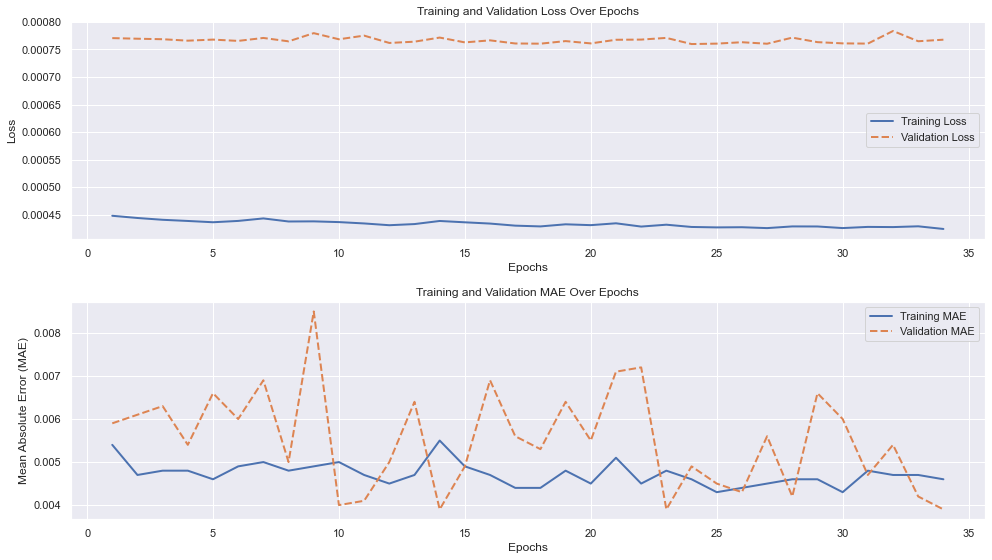

In [1045]:
# Define epochs
epochs = list(range(1, 35))

# Training and validation loss and mae values from your log
train_loss = [
    4.4834e-04, 4.4433e-04, 4.4106e-04, 4.3894e-04, 4.3661e-04, 4.3901e-04, 4.4355e-04, 4.3798e-04,
    4.3821e-04, 4.3688e-04, 4.3444e-04, 4.3123e-04, 4.3330e-04, 4.3891e-04, 4.3650e-04, 4.3422e-04, 
    4.3045e-04, 4.2906e-04, 4.3289e-04, 4.3135e-04, 4.3470e-04, 4.2878e-04, 4.3216e-04, 4.2807e-04, 
    4.2727e-04, 4.2759e-04, 4.2599e-04, 4.2906e-04, 4.2895e-04, 4.2605e-04, 4.2817e-04, 4.2784e-04, 
    4.2926e-04, 4.2444e-04
]

val_loss = [
    7.7038e-04, 7.6929e-04, 7.6836e-04, 7.6575e-04, 7.6768e-04, 7.6533e-04, 7.7068e-04, 7.6453e-04,
    7.7938e-04, 7.6827e-04, 7.7490e-04, 7.6162e-04, 7.6391e-04, 7.7136e-04, 7.6262e-04, 7.6633e-04,
    7.6066e-04, 7.6030e-04, 7.6498e-04, 7.6079e-04, 7.6739e-04, 7.6770e-04, 7.7077e-04, 7.5962e-04,
    7.6039e-04, 7.6293e-04, 7.6020e-04, 7.7125e-04, 7.6308e-04, 7.6085e-04, 7.6042e-04, 7.8330e-04,
    7.6470e-04, 7.6753e-04
]

train_mae = [
    0.0054, 0.0047, 0.0048, 0.0048, 0.0046, 0.0049, 0.0050, 0.0048, 0.0049, 0.0050, 0.0047, 0.0045, 
    0.0047, 0.0055, 0.0049, 0.0047, 0.0044, 0.0044, 0.0048, 0.0045, 0.0051, 0.0045, 0.0048, 0.0046, 
    0.0043, 0.0044, 0.0045, 0.0046, 0.0046, 0.0043, 0.0048, 0.0047, 0.0047, 0.0046
]

val_mae = [
    0.0059, 0.0061, 0.0063, 0.0054, 0.0066, 0.0060, 0.0069, 0.0050, 0.0085, 0.0040, 0.0041, 0.0050,
    0.0064, 0.0039, 0.0049, 0.0069, 0.0056, 0.0053, 0.0064, 0.0055, 0.0071, 0.0072, 0.0039, 0.0049,
    0.0045, 0.0043, 0.0056, 0.0042, 0.0066, 0.0060, 0.0047, 0.0054, 0.0042, 0.0039
]

# Create figure
plt.figure(figsize=(14, 8))

# Plot loss
plt.subplot(2, 1, 1)
plt.plot(epochs, train_loss, label='Training Loss')
plt.plot(epochs, val_loss, label='Validation Loss', linestyle='--')
plt.title('Training and Validation Loss Over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

# Plot MAE
plt.subplot(2, 1, 2)
plt.plot(epochs, train_mae, label='Training MAE')
plt.plot(epochs, val_mae, label='Validation MAE', linestyle='--')
plt.title('Training and Validation MAE Over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Mean Absolute Error (MAE)')
plt.legend()

# Show the plot
plt.tight_layout()
plt.show()


# Compare Time Series Model Prophet vs Neural Network

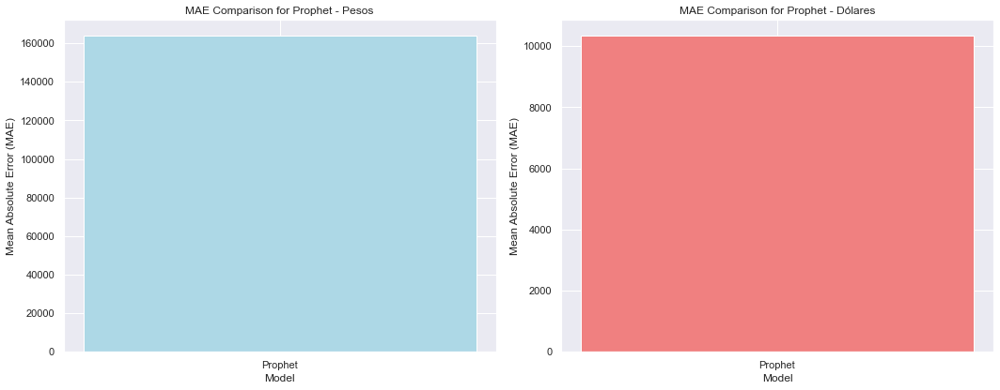

C:\Users\perez\AppData\Local\Temp\ipykernel_181656\1194360118.py:41: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\perez\AppData\Local\Temp\ipykernel_181656\1194360118.py:48: UserWarning:

FixedFormatter should only be used together with FixedLocator



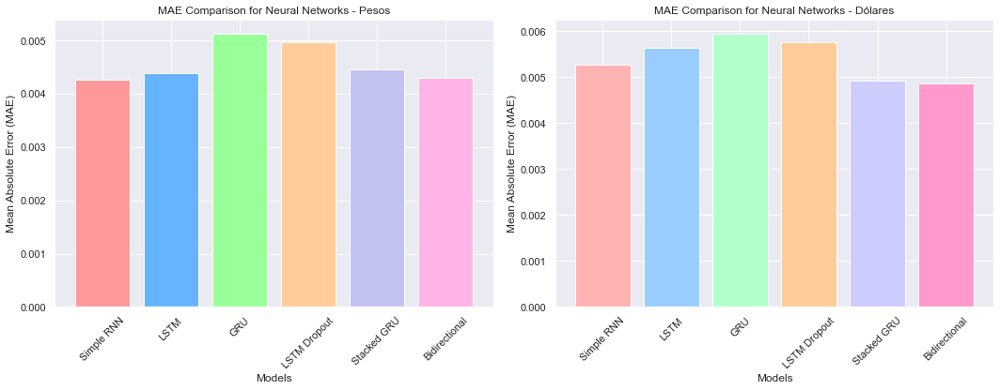

In [1054]:
import matplotlib.pyplot as plt

# Data for models and their MAE values
models_neural = ['Simple RNN', 'LSTM', 'GRU', 'LSTM Dropout', 'Stacked GRU', 'Bidirectional']
pesos_mae_neural = [0.004266, 0.004387, 0.005136, 0.004977, 0.004459, 0.004306]
dolares_mae_neural = [0.005266, 0.005647, 0.005953, 0.005763, 0.004930, 0.004871]

# Colors in pastel tones for each model
pastel_colors_pesos = ['#ff9999','#66b3ff','#99ff99','#ffcc99','#c2c2f0','#ffb3e6']
pastel_colors_dolares = ['#ffb3b3', '#99ccff', '#b3ffcc', '#ffcc99', '#ccccff', '#ff99cc']

# Plot Prophet separately
models_prophet = ['Prophet']
pesos_mae_prophet = [163970.24]
dolares_mae_prophet = [10343.34]

fig, ax = plt.subplots(1, 2, figsize=(15, 6))

# First plot: Prophet (high scale)
ax[0].bar(models_prophet, pesos_mae_prophet, color='lightblue')
ax[0].set_title('MAE Comparison for Prophet - Pesos')
ax[0].set_xlabel('Model')
ax[0].set_ylabel('Mean Absolute Error (MAE)')

ax[1].bar(models_prophet, dolares_mae_prophet, color='lightcoral')
ax[1].set_title('MAE Comparison for Prophet - Dólares')
ax[1].set_xlabel('Model')
ax[1].set_ylabel('Mean Absolute Error (MAE)')

plt.tight_layout()
plt.show()

# Plot Neural Network models
fig, ax = plt.subplots(1, 2, figsize=(15, 6))

# Second plot: Neural Networks (low scale) for Pesos
ax[0].bar(models_neural, pesos_mae_neural, color=pastel_colors_pesos)
ax[0].set_title('MAE Comparison for Neural Networks - Pesos')
ax[0].set_xlabel('Models')
ax[0].set_ylabel('Mean Absolute Error (MAE)')
ax[0].set_xticklabels(models_neural, rotation=45)

# Second plot: Neural Networks (low scale) for Dólares
ax[1].bar(models_neural, dolares_mae_neural, color=pastel_colors_dolares)
ax[1].set_title('MAE Comparison for Neural Networks - Dólares')
ax[1].set_xlabel('Models')
ax[1].set_ylabel('Mean Absolute Error (MAE)')
ax[1].set_xticklabels(models_neural, rotation=45)

plt.tight_layout()
plt.show()




Results Analysis
To compare the effectiveness of the Prophet and the Neural Network models in forecasting time series, we shall identify how these models are strong and weak when solving problems related to organizational characteristics and data nature. More details on this analysis are shown below:

Prophet:
Pros:
Interpretability
Prophet provides interpretable results for trend, seasonality, and holiday effects, which help in understanding the underlying data behavior. It automatically yields uncertainty intervals, and the user has a feeling of confidence in the predictions that is very useful in practical applications, where one often needs to communicate to stakeholders an idea of how reliable the prediction is.

Ease of Use:
Prophet is meant to be friendly and easily usable and has an intuitive interface that requires little tuning. It is easier to set up and integrate; even more so, the teams or the organization which are not having highly specialized knowledge in machine learning.

Handles missing data well, which is common in real-world datasets.

Scalability
It works well on datasets in which the ranges of variables are huge, like Pesos and Dólares, where the financial scale varies a lot. On the other hand, Prophet is automatic with respect to trend and seasonality adjustment, therefore most suitable when dealing with data that has long-term patterns and cyclical components.

Cons:
Reduced Accuracy (Higher MAE)
The values of MAE (Mean Absolute Error) are found to be much larger for Prophet than for Neural Networks, especially in Pesos, where the average error is on the order of 163,000 units. This means Prophet does not perform well with fine-grained predictions. This level of error might be acceptable for large-scale predictions, for example annual financial forecasts, but quite inadequate for cases in which precision matters.

Limited Flexibility:
Although Prophet is good at capturing simple trends and seasonal patterns, it is weak with respect to complex non-linear patterns that are common in many datasets. Therefore, it will often overlook the important dependencies within the data that a much more flexible model could capture.

Neural Network Models (RNN, LSTM, GRU, etc.)
Pros:
Superior Accuracy:
In general, the MAE of Neural Networks is less than RNNs, showing that they may yield better results in the forecast, particularly for fine-grained predictions. For example, models like Bidirectional LSTM and Stacked GRU present pretty good numbers with an MAE well below 0.005 for Pesos, which makes them very appropriate models for precision tasks.

Managing complex patterns: Neural Networks are more flexible and able to grasp complex, non-linear data relationships better than the classical methods. This is often pertinent in cases where datasets have sequenced dependencies or very intricate patterns which simple models such as Prophet miss. Models such as LSTM and GRU are made for time series data, especially where there is a long dependency from one time step to the next.

Adaptability Across Data Scales :

Because of the sequential learning and fine-tuned learned prediction, neural networks can adjust to many different scales effectively despite the complexity of data (either in pesos or dollars).

Cons:
Complexity and Resource Requirements: Neural Networks, especially deep models like LSTM and GRU, involve a lot of computational demand. This model requires quite a rigorous setup, from the selection of hyperparameters to avoid overfitting to sufficiency in training data required for generalization purposes. It is a resource-intensive process, as model training might require huge hardware, such as GPUs to lessen the training time.

Interpretability :

While these models perform adequately in the prediction context, they tend to be treated as a "black box" because the internal mechanics are very interpretable. Unlike Prophet, which gives clear insight regarding trend and seasonality, Neural Networks do not provide explanations for its prediction. They lack the prediction intervals as provided by Prophet, which could be important in case one wants to understand how certain he/she can be about the forecast.

Overfitting Risk:
Neural Networks naturally tend to overfit. Even with proper regularization and tuning of hyperparameters, overfitting might occur, especially on small datasets. The result will be a model making training data-centric predictions, while their generalization to new unseen data will be poor.

Conclusion:
This is the point where Prophet and Neural Networks have respective strengths to give valuable benefits based on the specific requirements of the forecasting in question:

Prophet is very efficient for organizations or teams that want to have :

Quick setup and deployment with very little data science knowledge.

Interpretability of results, with a particular emphasis on making the results understandable to a non-technical audience. Scenarios in which capturing large-scale trends and uncertainty is more important than fine-grained accuracy. Neural networks, however, offer: Best possible accuracy, especially for those tasks that require highly precise forecasts. Ability to capture complex, non-linear patterns, therefore ideal for more complex datasets. They give the best performance when computational resources and technical skills are available to train and fine-tune such models.

Recommendations:
For organizations that do not have an effective forecasting model, this would be the right step to start with. Prophet is, however, easy to use and interpret; hence, it's a great way of getting reasonable forecasts and providing valuable insights for decision making. Once the organization becomes familiar with forecasting and is ready for more refined predictions, this can be built upon further using Neural Networks—Bidirectional LSTM, for example, or Stacked GRU. These will give much better, although more computationally expensive, results with increased expertise in hyperparameter tuning.



In [ ]:
df_modelo = pd.read_csv('DataModeloRegresion.csv', engine='python')
#Eliminan las filas de esos registros
indexNames = df_modelo[df_modelo['Padre']==0].index
# Delete these row indexes from dataFrame
df_modelo.drop(indexNames,inplace=True)
from sklearn.model_selection import train_test_split 
train, test = train_test_split(df_modelo, test_size = 0.20, shuffle = False)
#Eliminan las filas de esos registros
indexNames = train[train['Avance'].isnull()].index
# Delete these row indexes from dataFrame
train.drop(indexNames,inplace=True)
#Eliminan las filas de esos registros
indexNames = train[train['EstadoCronograma'].isnull()].index
# Delete these row indexes from dataFrame
train.drop(indexNames,inplace=True)
train.drop(['Tipo_Presupuesto','Termina en presupuesto','Programa','Proyecto','Área','Orden','Padre','Nombre','Área.1','Tipo','Inicio plan.','Fin plan.','Inicio','Fin','Duración plan.','Duración','Cantidad_Riesgos','Tipo_Riesgo','Anio'],axis=1,inplace=True)
X = train.drop(['Dificultad'], axis=1)
y = train['Dificultad']
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
from sklearn.linear_model import LogisticRegression
# Instantiate Logistic Regression
model = LogisticRegression()
# Fit the data
model.fit(X_train, y_train)
x_nuevo = pd.DataFrame({'Avance':[81],'EstadoCronograma': [0]})
print(x_nuevo)
resultadoPorcentaje = model.predict(x_nuevo)
resultadoPorcentaje 

   Avance  EstadoCronograma
0      81                 0


array([0], dtype=int64)